# Silvery Beetle Species Classifier Neural Network
## Authors: Vinicio Soto y Marcela Hernández
### CICIMA UCR

- Trains and tests a neural network for species classification.
- Works with fiber optics reflectance measurements.
- Calculates the probability of a specimen being of a certain species.

In [1]:
import sys
import os
from pathlib import Path
import seaborn as sns
# Get the current directory
current_directory = os.getcwd()
base_directory = Path(current_directory).parent
libraries_directory = base_directory/"libraries"
directories_in_path = [current_directory, base_directory, libraries_directory]

# Convert paths to strings and normalize for Windows
directories_in_path = [
    current_directory,
    str(base_directory),
    str(libraries_directory)
]

# Add directories to sys.path if not already present
for path in directories_in_path:
    path = os.path.normpath(path)  # Normalize path for Windows
    if path not in sys.path:
        sys.path.append(path)
        print(f"Added {path} to sys.path")


from spectraltools import Specimen_Collection, Spectrum, create_path_if_not_exists
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import math
import re
import scipy
import socket #gets the machine name
import tensorflow as tf
from metrics import Metric, feature_and_label_extractor 
from metrics import (Gamma_First_Two_Peaks, Gamma_Arbitrary_Limits_Silver, 
                    Gamma_Area_Under_Curve_Naive, Gamma_Area_Under_Curve_First_Min_Cut, Gamma_Vector_Relative_Reflectance,
                    Wavelength_Vector, Critical_Points, Metric_Testbench, Gamma_Gaussian_Fit, Gamma_First_Two_Peaks_Simple)
from feature_engineering import get_aggregated_data
import seaborn as sns
from visualizations import scatter_plot_2_variables, scatter_plot_3_variables
import warnings


Added C:\Users\esteb\escarabajos\gamma factor calculation and neural network training to sys.path
Added C:\Users\esteb\escarabajos to sys.path
Added C:\Users\esteb\escarabajos\libraries to sys.path


# Collection main paths

In [2]:
"""This section allows the user to choose their workplace location.
This is important if the user has multiple locations and operating systems in which this
script is run"""

# Training data is used when we are already certain of species and genera for a particular sample
training_data_is_used = True
debug = True

# Base folder 
base_folder = Path(base_directory)  # Same folder

# Define the location of the tables with information about the collections and its parent directory
collection_tables_main_path = base_folder / "collections"
l1050_collection_files_main_path = base_folder / "L1050_data"
fiber_optics_collection_files_main_path = base_folder / "avalight_spectrometer_data"

#Configuration file location

#configuration for collections
config_file_main_path = base_folder / "libraries" / "spectraltools"/ "spectral_config"

config_file_cicimaucr_l050_golden = config_file_main_path / "CICIMAUCR_L1050_GOLDEN.ini"
config_file_cicimaucr_l050_silver = config_file_main_path / "CICIMAUCR_L1050_SILVER.ini"
config_file_inbucr_avalight_silver = config_file_main_path / "INBUCR_AVALIGHT_SILVER.ini"
config_file_inbucr_l1050_golden = config_file_main_path / "INBUCR_L1050_GOLDEN.ini"
config_file_cicimaucr_avalight_silver = config_file_main_path / "CICIMAUCR_AVALIGHT_SILVER.ini"

#configuration for metrics
metric_configuration_file = base_folder / "libraries" / "metrics" / "spectral_config" / "metrics.ini"

# Define report location
report_location = base_folder / "reports" / "data_analysis"

# Define image counter generator
def yield_image_counter():
    for val in range(1, 100):
        yield val
image_counter = yield_image_counter()


### check existence of directories

In [3]:
from pathlib import Path

def check_paths_exist():
    # Define all paths in a dictionary for clarity
    paths = {
        "collection_tables_main_path": collection_tables_main_path,
        "l1050_collection_files_main_path": l1050_collection_files_main_path,
        "fiber_optics_collection_files_main_path": fiber_optics_collection_files_main_path,
        "config_file_main_path": config_file_main_path,
        "config_file_cicimaucr_l050_golden": config_file_cicimaucr_l050_golden,
        "config_file_cicimaucr_l050_silver": config_file_cicimaucr_l050_silver,
        "config_file_inbucr_avalight_silver": config_file_inbucr_avalight_silver,
        "config_file_inbucr_l1050_golden": config_file_inbucr_l1050_golden,
        "config_file_cicimaucr_avalight_silver": config_file_cicimaucr_avalight_silver,
        "metric_configuration_file": metric_configuration_file,
        "report_location": report_location,
    }

    print("\n=== Checking required paths ===")
    for name, path in paths.items():
        if path.is_dir():
            if path.exists():
                print(f"[OK] Directory exists: {name} -> {path}")
            else:
                print(f"[MISSING] Directory: {name} -> {path}")
        elif path.is_file():
            if path.exists():
                print(f"[OK] File exists: {name} -> {path}")
            else:
                print(f"[MISSING] File: {name} -> {path}")
        else:
            # If extension suggests file but doesn't exist yet, handle
            if path.suffix:
                print(f"[MISSING] Expected file: {name} -> {path}")
            else:
                print(f"[MISSING] Expected directory: {name} -> {path}")

# Run check
check_paths_exist()



=== Checking required paths ===
[OK] Directory exists: collection_tables_main_path -> C:\Users\esteb\escarabajos\collections
[OK] Directory exists: l1050_collection_files_main_path -> C:\Users\esteb\escarabajos\L1050_data
[OK] Directory exists: fiber_optics_collection_files_main_path -> C:\Users\esteb\escarabajos\avalight_spectrometer_data
[OK] Directory exists: config_file_main_path -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config
[OK] File exists: config_file_cicimaucr_l050_golden -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config\CICIMAUCR_L1050_GOLDEN.ini
[OK] File exists: config_file_cicimaucr_l050_silver -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config\CICIMAUCR_L1050_SILVER.ini
[OK] File exists: config_file_inbucr_avalight_silver -> C:\Users\esteb\escarabajos\libraries\spectraltools\spectral_config\INBUCR_AVALIGHT_SILVER.ini
[OK] File exists: config_file_inbucr_l1050_golden -> C:\Users\esteb\escarabajos\libraries\spec

## Spectrometer data main paths: L1050 data

In [4]:

# File location and metadata location for collection 1
l1050_angsol_collection_path = l1050_collection_files_main_path / "ANGSOL" / "average"
angsol_collection_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - ANGSOL.txt"

# File location and metadata location for collection 2
l1050_cicimaucr_collection_path = l1050_collection_files_main_path / "TRA_data_CICIMA_INBUCR" / "CICIMAUCR" / "reflectance"
l1050_cicimaucr_collection_2_path = l1050_collection_files_main_path / "CICIMA-2024-01-REFLECTANCE" / "average"
l1050_cicimaucr_collection_3_path = l1050_collection_files_main_path / "CICIMA-2024-03-REFLECTANCE" / "without iris nor lens" / "average"
l1050_cicimaucr_collection_4_path = l1050_collection_files_main_path / "CICIMA-2024-05-REFLECTANCE" / "DORSAL" / "average" #elitros



cicima_ucr_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - CICIMAUCR.txt"

# File location and metadata location for collection 3
l1050_inbucr_collection_path = l1050_collection_files_main_path / "INBUCR" / "average"
inbucr_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - INBUCR.txt"

# File location and metadata location for collection 4
l1050_bioucr_collection_path = l1050_collection_files_main_path / "BIOUCR" / "average"
bioucr_metadata = collection_tables_main_path / "CICIMA-beetles-general-inventory - BIOUCR.txt"

# Aggregated data location, where averages and std will be saved when training data and retrieved when classifying spectra
agregated_data_location = base_folder / "aggregated_data"

## Spectrometer data main paths: Fiber optics data

In [5]:
fiber_optics_cicimaucr_collection_5_path = fiber_optics_collection_files_main_path / "ELITROS"/"CICIMAUCR" #Elitros
fiber_optics_inbucr_collection_2_path = fiber_optics_collection_files_main_path / "ELITROS"/ "INBUCR"       #Elitros
fiber_optics_cicimaucr_collection_6_path = fiber_optics_collection_files_main_path / "COMPLETOS" /"20250829" / "CICIMAUCR" #escarabajos completos

## Select collections for training and testing

In [6]:
#Set Specimen Collection objects

# Function to verify and print path
def verify_and_print_path(name, path):
    print(f"Input {name}: {path}")
    if not path.exists():
        print(f"Warning: Path does not exist: {path}")

# Create collections with debug output
print("Creating Specimen_Collection instances:")
verify_and_print_path("l1050_angsol_collection_path", l1050_angsol_collection_path)
verify_and_print_path("angsol_collection_metadata", angsol_collection_metadata)
angsol_collection = Specimen_Collection(
    name="ANGSOL",
    data_folder_path=l1050_angsol_collection_path,
    metadata_path=angsol_collection_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)
angsol_collection.set_description(
    "ANGSOL collection has specimens that belong to Angel Solís. The confidence that we have about specimen identification is high."
)

verify_and_print_path("l1050_cicimaucr_collection_path", l1050_cicimaucr_collection_path)
verify_and_print_path("cicima_ucr_metadata", cicima_ucr_metadata)
l1050_cicimaucr_collection = Specimen_Collection(
    name="CICIMAUCR1",
    data_folder_path=l1050_cicimaucr_collection_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)

verify_and_print_path("l1050_cicimaucr_collection_2_path", l1050_cicimaucr_collection_2_path)
l1050_cicimaucr_collection_2 = Specimen_Collection(
    name="CICIMAUCR2",
    data_folder_path=l1050_cicimaucr_collection_2_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)

verify_and_print_path("l1050_cicimaucr_collection_3_path", l1050_cicimaucr_collection_3_path)
l1050_cicimaucr_collection_3 = Specimen_Collection(
    name="CICIMAUCR3",
    data_folder_path=l1050_cicimaucr_collection_3_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_l050_golden,
)
#THIS
verify_and_print_path("fiber_optics_cicimaucr_collection_5_path", fiber_optics_cicimaucr_collection_5_path)
fiber_optics_cicimaucr_collection_5 = Specimen_Collection(
    name="CICIMAUCR5",
    data_folder_path=fiber_optics_cicimaucr_collection_5_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_avalight_silver,
)
#THIS
verify_and_print_path("fiber_optics_cicimaucr_collection_6_path", fiber_optics_cicimaucr_collection_6_path)
fiber_optics_cicimaucr_collection_6 = Specimen_Collection(
    name="CICIMAUCR6",
    data_folder_path=fiber_optics_cicimaucr_collection_6_path,
    metadata_path=cicima_ucr_metadata,
    quality="HIGH",
    config_file = config_file_cicimaucr_avalight_silver,
)
#THIS
verify_and_print_path("fiber_optics_inbucr_collection_2_path", fiber_optics_inbucr_collection_2_path)
fiber_optics_inbucr_collection_2 = Specimen_Collection(
    name="INBUCR2",
    data_folder_path=fiber_optics_inbucr_collection_2_path,
    metadata_path=inbucr_metadata,
    quality="HIGH",
    config_file = config_file_inbucr_avalight_silver,
)

verify_and_print_path("l1050_inbucr_collection_path", l1050_inbucr_collection_path)
verify_and_print_path("inbucr_metadata", inbucr_metadata)
l1050_inbucr_collection = Specimen_Collection(
    name="INBUCR",
    data_folder_path=l1050_inbucr_collection_path,
    metadata_path=inbucr_metadata,
    quality="MID",
    config_file = config_file_inbucr_l1050_golden,
)

verify_and_print_path("l1050_bioucr_collection_path", l1050_bioucr_collection_path)
verify_and_print_path("bioucr_metadata", bioucr_metadata)
l1050_bioucr_collection = Specimen_Collection(
    name="BIOUCR",
    data_folder_path=l1050_bioucr_collection_path,
    metadata_path=bioucr_metadata,
    quality="LOW",
    config_file = config_file_inbucr_l1050_golden, #todo create config file
)

training_collection_list = [
                    #angsol_collection,
                    #l1050_cicimaucr_collection,
                    #l1050_cicimaucr_collection_2,
                    #l1050_cicimaucr_collection_3,
                    #fiber_optics_cicimaucr_collection_5,#ELITROS MIXTOS
                    #fiber_optics_inbucr_collection_2,#ELITROS MIXTOS
                    fiber_optics_cicimaucr_collection_6,# COMPLETOS PLATEADOS
                    #l1050_inbucr_collection,
                    #l1050_bioucr_collection,
                    ]
collection_names_set = set([collection.name for collection in training_collection_list])
collection_names = " ".join( sorted(collection_names_set))

prediction_collection_list = [
                    #angsol_collection,
                    #l1050_cicimaucr_collection,
                    #l1050_cicimaucr_collection_2,
                    #l1050_cicimaucr_collection_3,
                    fiber_optics_cicimaucr_collection_5, #ELITROS MIXTOS
                    fiber_optics_inbucr_collection_2,    #ELITROS MIXTOS
                    #fiber_optics_cicimaucr_collection_6,  #COMPLETOS PLATEADOS
                    #l1050_inbucr_collection,
                    #l1050_bioucr_collection,
                    ]
prediction_collection_names_set = set([collection.name for collection in training_collection_list])
prediction_collection_names = " ".join( sorted(collection_names_set))


Creating Specimen_Collection instances:
Input l1050_angsol_collection_path: C:\Users\esteb\escarabajos\L1050_data\ANGSOL\average
Input angsol_collection_metadata: C:\Users\esteb\escarabajos\collections\CICIMA-beetles-general-inventory - ANGSOL.txt
Input l1050_cicimaucr_collection_path: C:\Users\esteb\escarabajos\L1050_data\TRA_data_CICIMA_INBUCR\CICIMAUCR\reflectance
Input cicima_ucr_metadata: C:\Users\esteb\escarabajos\collections\CICIMA-beetles-general-inventory - CICIMAUCR.txt
Input l1050_cicimaucr_collection_2_path: C:\Users\esteb\escarabajos\L1050_data\CICIMA-2024-01-REFLECTANCE\average
Input l1050_cicimaucr_collection_3_path: C:\Users\esteb\escarabajos\L1050_data\CICIMA-2024-03-REFLECTANCE\without iris nor lens\average
Input fiber_optics_cicimaucr_collection_5_path: C:\Users\esteb\escarabajos\avalight_spectrometer_data\ELITROS\CICIMAUCR
Input fiber_optics_cicimaucr_collection_6_path: C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR
Input fiber_op

## Set Spectrum class parameters
# These parameters help calculate maxima and minima, set the range of valid wavelengths, distance between valid peaks.

## Filter spectra
#### Filters to only the target species


In [7]:
#helpers

def get_filtered_spectra(collection_list, debug):

    all_spectra = []
    
    for collection in collection_list:
        if debug:
            print("collection:", collection)
        all_spectra += collection.get_spectra()
        if debug:
            print("all_spectra", len(all_spectra))
            print("species", set([item.get_species() for item in all_spectra]))
            for spectrum in all_spectra:
                print(f"{spectrum.get_code()} {spectrum.get_genus()} {spectrum.get_species()}")
    filtered_spectra_by_species = [item for item in all_spectra if item.get_species() in target_species]
    return filtered_spectra_by_species

In [8]:
debug = False
target_species = ["chrysargyrea", "optima"]

train_spectra = get_filtered_spectra(training_collection_list, debug= debug)
test_spectra  = get_filtered_spectra(prediction_collection_list, debug= debug) 

print("# of collections used in training: ", len(training_collection_list), "# of collections used in prediction: ", len(prediction_collection_list) )
print("# of spectra used in training: ", len(train_spectra), "# of collections used in prediction: ", len(test_spectra) )
#date

from datetime import datetime
current_date = datetime.now().date()

    


print("Number of valid spectra: ", len(train_spectra))
if debug:
    for spectrum in train_spectra:
        print(spectrum.get_species())

# of collections used in training:  1 # of collections used in prediction:  2
# of spectra used in training:  73 # of collections used in prediction:  8
Number of valid spectra:  73


## Feature extraction
### This section will create, for each metric, a list with three sublists:
- code (Useful to retrieve additional information in the future, according to the research needs)
- metric values (Values for that particular metric)
- species (labels used in training the neural network for species classification)
information will be used in feature engineering, metric and statistics

#### Gamma First Two Peaks

In [9]:
gamma_first_two_peaks_data = feature_and_label_extractor(Metric = Gamma_First_Two_Peaks, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)

print(gamma_first_two_peaks_data)

[['CICIMAUCR0016', 'CICIMAUCR0016', 'CICIMAUCR0017', 'CICIMAUCR0017', 'CICIMAUCR0034', 'CICIMAUCR0034', 'CICIMAUCR0035', 'CICIMAUCR0036', 'CICIMAUCR0036', 'CICIMAUCR0036', 'CICIMAUCR0064', 'CICIMAUCR0068', 'CICIMAUCR0076', 'CICIMAUCR0076', 'CICIMAUCR0080', 'CICIMAUCR0082', 'CICIMAUCR0093', 'CICIMAUCR0093', 'CICIMAUCR0094', 'CICIMAUCR0096', 'CICIMAUCR0102', 'CICIMAUCR0102', 'CICIMAUCR0103', 'CICIMAUCR0103', 'CICIMAUCR0107', 'CICIMAUCR0107', 'CICIMAUCR0110', 'CICIMAUCR0110', 'CICIMAUCR0114', 'CICIMAUCR0114', 'CICIMAUCR0115', 'CICIMAUCR0115', 'CICIMAUCR0117', 'CICIMAUCR0117', 'CICIMAUCR0118', 'CICIMAUCR0118', 'CICIMAUCR0119', 'CICIMAUCR0119', 'CICIMAUCR0120', 'CICIMAUCR0120', 'CICIMAUCR0121', 'CICIMAUCR0121', 'CICIMAUCR0122', 'CICIMAUCR0122', 'CICIMAUCR0123', 'CICIMAUCR0123', 'CICIMAUCR0124', 'CICIMAUCR0124', 'CICIMAUCR0126', 'CICIMAUCR0127', 'CICIMAUCR0127', 'CICIMAUCR0128', 'CICIMAUCR0128', 'CICIMAUCR0129', 'CICIMAUCR0129', 'CICIMAUCR0131', 'CICIMAUCR0131', 'CICIMAUCR0132', 'CICIMAUCR01

In [10]:
gamma_first_two_peaks_data = feature_and_label_extractor(Metric = Gamma_First_Two_Peaks, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)

print(gamma_first_two_peaks_data)

[['CICIMAUCR0016', 'CICIMAUCR0016', 'CICIMAUCR0017', 'CICIMAUCR0017', 'CICIMAUCR0034', 'CICIMAUCR0034', 'CICIMAUCR0035', 'CICIMAUCR0036', 'CICIMAUCR0036', 'CICIMAUCR0036', 'CICIMAUCR0064', 'CICIMAUCR0068', 'CICIMAUCR0076', 'CICIMAUCR0076', 'CICIMAUCR0080', 'CICIMAUCR0082', 'CICIMAUCR0093', 'CICIMAUCR0093', 'CICIMAUCR0094', 'CICIMAUCR0096', 'CICIMAUCR0102', 'CICIMAUCR0102', 'CICIMAUCR0103', 'CICIMAUCR0103', 'CICIMAUCR0107', 'CICIMAUCR0107', 'CICIMAUCR0110', 'CICIMAUCR0110', 'CICIMAUCR0114', 'CICIMAUCR0114', 'CICIMAUCR0115', 'CICIMAUCR0115', 'CICIMAUCR0117', 'CICIMAUCR0117', 'CICIMAUCR0118', 'CICIMAUCR0118', 'CICIMAUCR0119', 'CICIMAUCR0119', 'CICIMAUCR0120', 'CICIMAUCR0120', 'CICIMAUCR0121', 'CICIMAUCR0121', 'CICIMAUCR0122', 'CICIMAUCR0122', 'CICIMAUCR0123', 'CICIMAUCR0123', 'CICIMAUCR0124', 'CICIMAUCR0124', 'CICIMAUCR0126', 'CICIMAUCR0127', 'CICIMAUCR0127', 'CICIMAUCR0128', 'CICIMAUCR0128', 'CICIMAUCR0129', 'CICIMAUCR0129', 'CICIMAUCR0131', 'CICIMAUCR0131', 'CICIMAUCR0132', 'CICIMAUCR01

### Gamma_Gaussian_Fit

In [11]:
gamma_arbitrary_limits_data = feature_and_label_extractor(Metric = Gamma_Gaussian_Fit, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)


print(gamma_arbitrary_limits_data)

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0035 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0036 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0094 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0117 (Chrysin

[['CICIMAUCR0016', 'CICIMAUCR0016', 'CICIMAUCR0017', 'CICIMAUCR0017', 'CICIMAUCR0034', 'CICIMAUCR0034', 'CICIMAUCR0035', 'CICIMAUCR0036', 'CICIMAUCR0036', 'CICIMAUCR0036', 'CICIMAUCR0064', 'CICIMAUCR0068', 'CICIMAUCR0076', 'CICIMAUCR0076', 'CICIMAUCR0080', 'CICIMAUCR0082', 'CICIMAUCR0093', 'CICIMAUCR0093', 'CICIMAUCR0094', 'CICIMAUCR0096', 'CICIMAUCR0102', 'CICIMAUCR0102', 'CICIMAUCR0103', 'CICIMAUCR0103', 'CICIMAUCR0107', 'CICIMAUCR0107', 'CICIMAUCR0110', 'CICIMAUCR0110', 'CICIMAUCR0114', 'CICIMAUCR0114', 'CICIMAUCR0115', 'CICIMAUCR0115', 'CICIMAUCR0117', 'CICIMAUCR0117', 'CICIMAUCR0118', 'CICIMAUCR0118', 'CICIMAUCR0119', 'CICIMAUCR0119', 'CICIMAUCR0120', 'CICIMAUCR0120', 'CICIMAUCR0121', 'CICIMAUCR0121', 'CICIMAUCR0122', 'CICIMAUCR0122', 'CICIMAUCR0123', 'CICIMAUCR0123', 'CICIMAUCR0124', 'CICIMAUCR0124', 'CICIMAUCR0126', 'CICIMAUCR0127', 'CICIMAUCR0127', 'CICIMAUCR0128', 'CICIMAUCR0128', 'CICIMAUCR0129', 'CICIMAUCR0129', 'CICIMAUCR0131', 'CICIMAUCR0131', 'CICIMAUCR0132', 'CICIMAUCR01

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0131 (Chrysina chrysargyrea): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


### Gamma_Area_Under_Curve_Naive

In [12]:
gamma_area_under_curve_data = feature_and_label_extractor(Metric = Gamma_Area_Under_Curve_Naive, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)

#print(gamma_area_under_curve_data)

### Gamma_Area_Under_Curve_First_Min_Cut

In [13]:
gamma_area_under_curve_first_min_cut_data = feature_and_label_extractor(Metric = Gamma_Area_Under_Curve_First_Min_Cut, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)

#print(gamma_area_under_curve_first_min_cut_data)

### Gamma_Vector_Relative_Reflectance

In [14]:
gamma_vector_relative_reflectance_data = feature_and_label_extractor(Metric = Gamma_Vector_Relative_Reflectance, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)


#print(gamma_vector_relative_reflectance_data)


In [15]:
import numpy as np

def pad_list(lst, filler=0):
    metrics = lst[1]

    # Find the maximum length among all arrays
    max_length = max(m.shape[-1] for m in metrics)

    padded_list = []
    for element in metrics:
        # Ensure numpy array
        arr = np.asarray(element)

        current_length = arr.shape[-1]
        if current_length < max_length:
            pad_width = max_length - current_length
            if arr.ndim == 1:
                # Pad 1D vector
                padded = np.pad(arr, (0, pad_width), constant_values=filler)
            elif arr.ndim == 2:
                # Pad 2D matrix along last axis
                pad_shape = ((0, 0), (0, pad_width))
                padded = np.pad(arr, pad_shape, constant_values=filler)
            else:
                raise ValueError(f"Unsupported ndim={arr.ndim} in element {arr}")
        else:
            padded = arr

        padded_list.append(padded)

    return [lst[0], padded_list, lst[2]]


#pad_list(gamma_vector_relative_reflectance_data)

In [16]:
wavelength_vector_data = feature_and_label_extractor(Metric = Wavelength_Vector, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)


#print(wavelength_vector_data)

data = pad_list(wavelength_vector_data)
#print(data)

In [17]:
critical_points_data = feature_and_label_extractor(Metric = Critical_Points, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)


#print(critical_points_data)
#pad_list(critical_points_data, filler = np.array([0,0]).T)


In [18]:
critical_points_data = feature_and_label_extractor(Metric = Critical_Points, 
                                                          config_file = metric_configuration_file, 
                                                          spectra =  train_spectra, 
                                                          debug = debug,
                                                          collection_list = training_collection_list)


#print(critical_points_data)
#pad_list(critical_points_data, filler = np.array([0,0]).T)


## Aggregate data for each metric
### Boxplots and histograms for each metric, classified by species

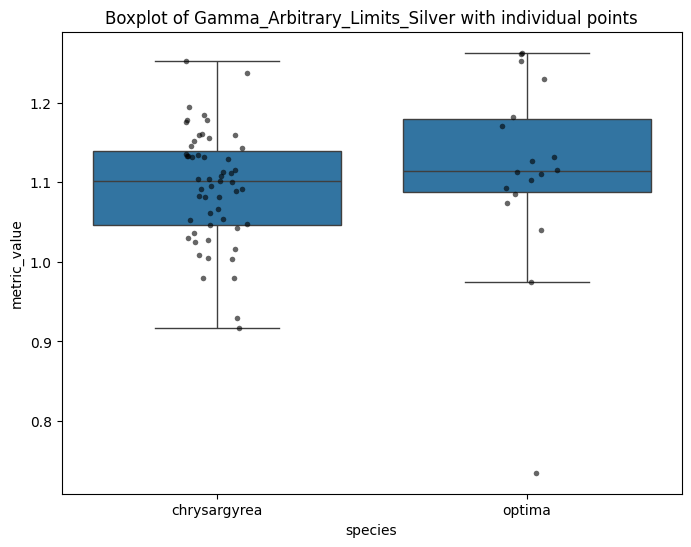

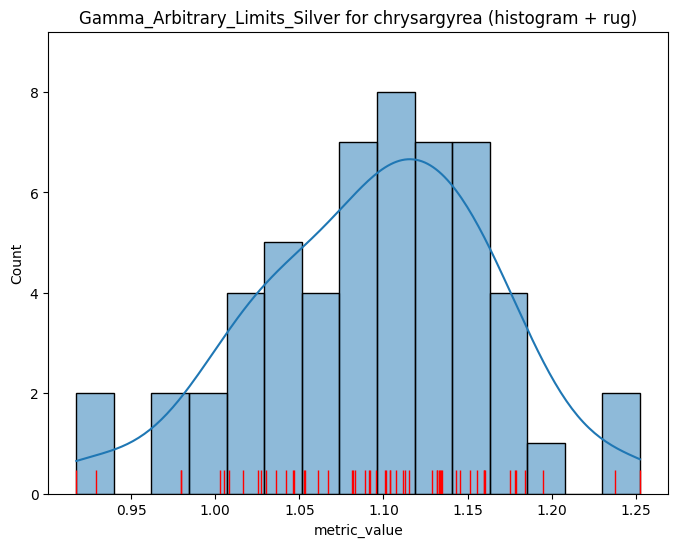

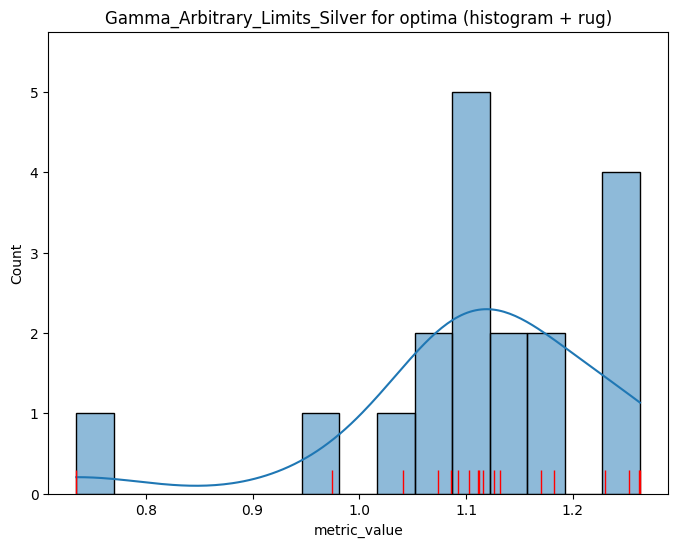

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
chrysargyrea,1.0946,0.0701,1.1015,0.9175,1.2524,55,0.0925,0.0640
optima,1.1145,0.1228,1.1141,0.7350,1.2630,18,0.0919,0.1102


In [19]:
get_aggregated_data(Gamma_Arbitrary_Limits_Silver,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list)

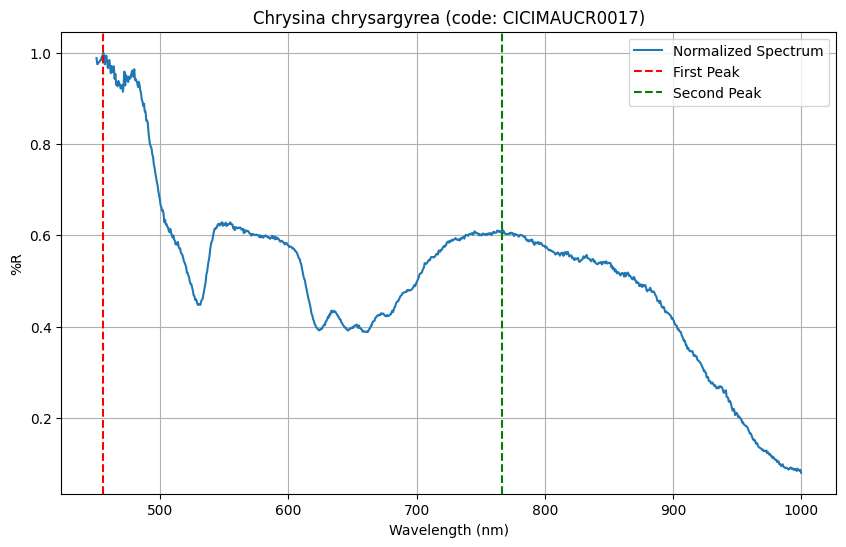

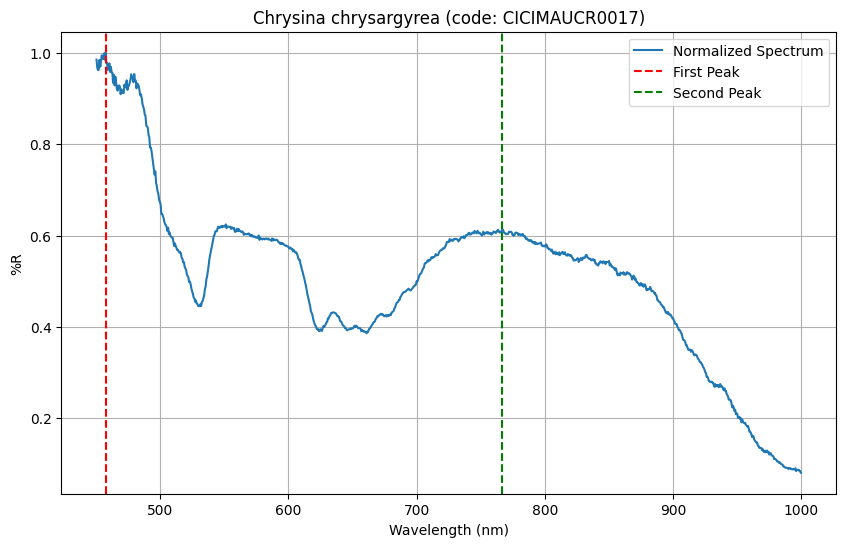

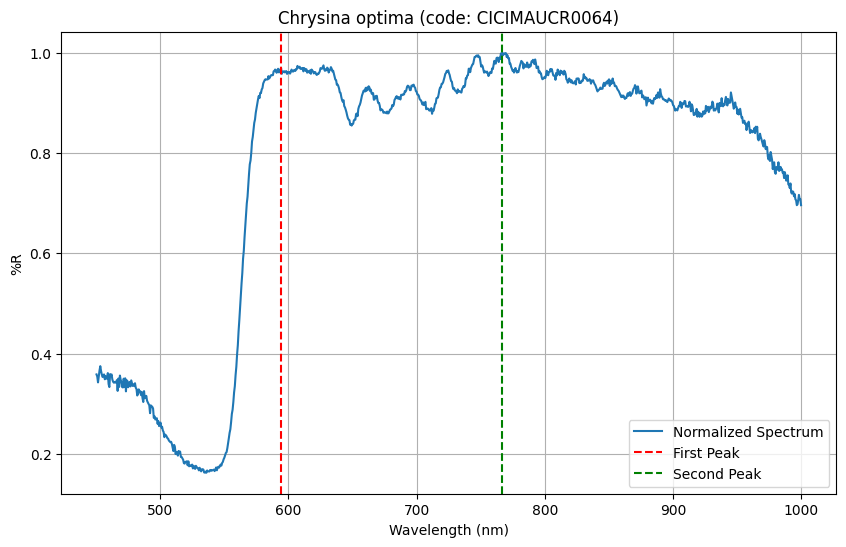

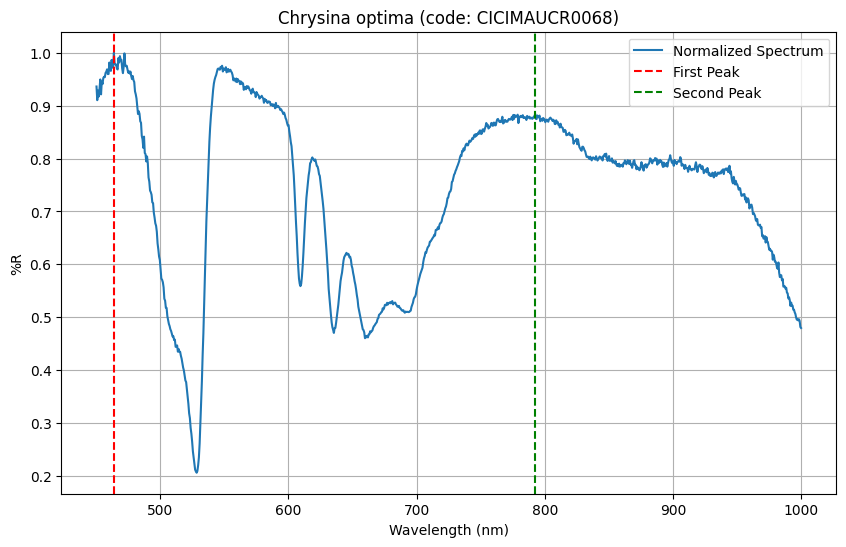

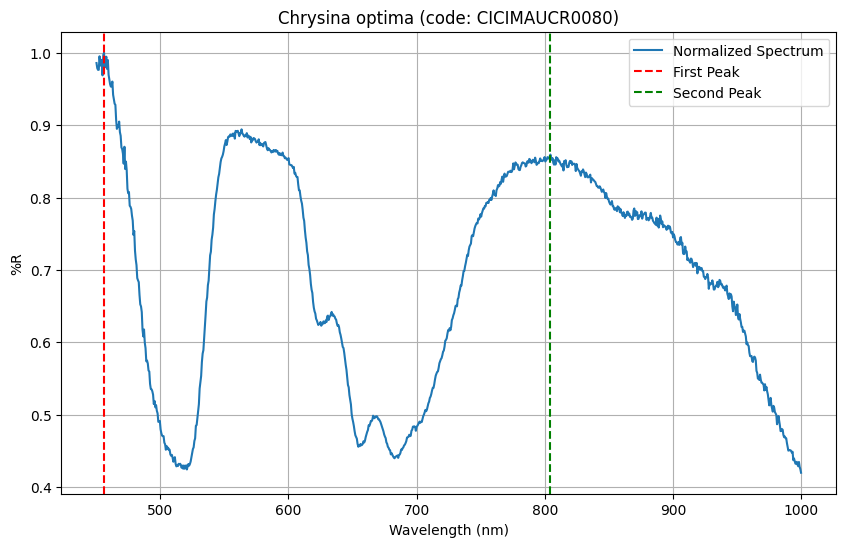

...

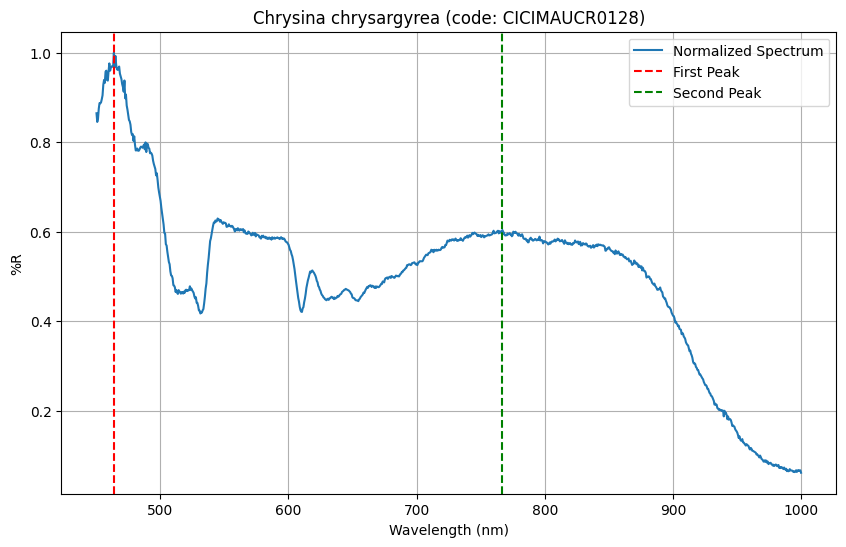

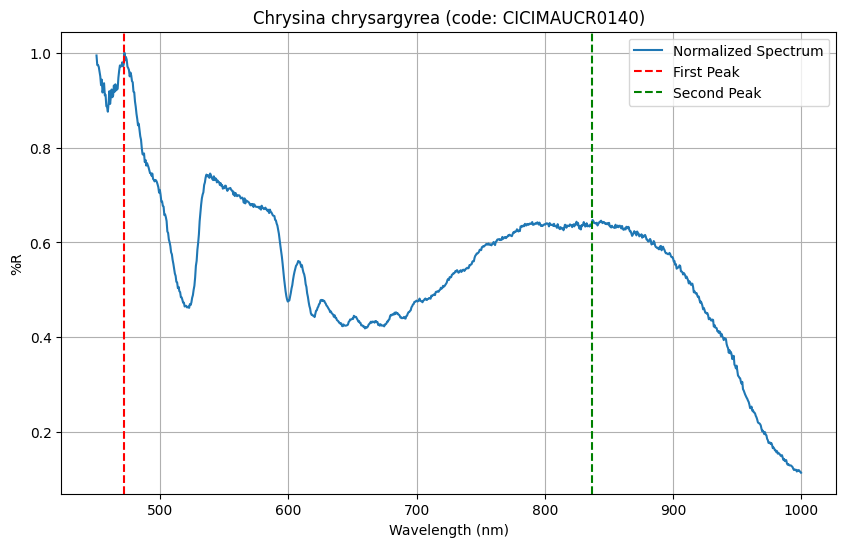

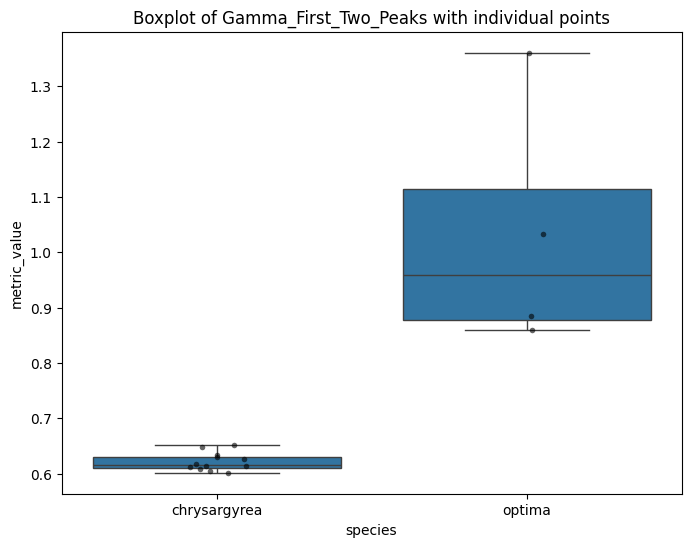

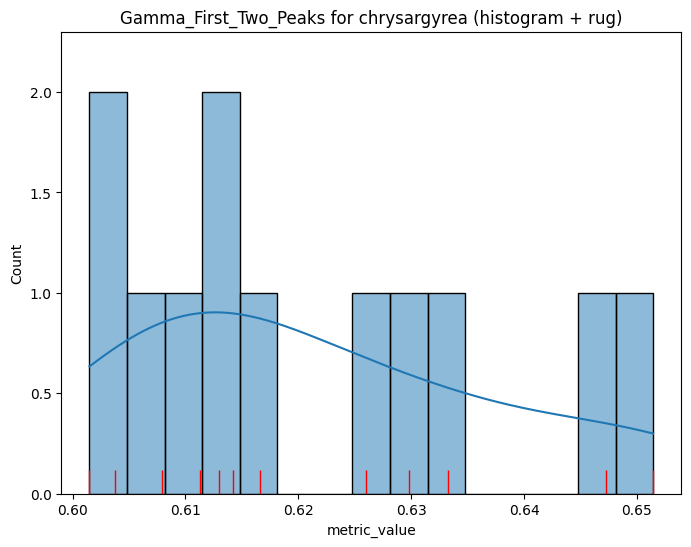

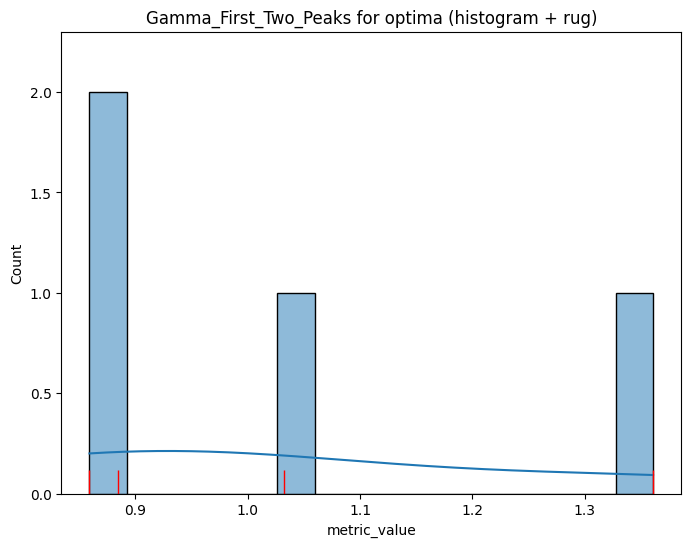

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
chrysargyrea,0.6213,0.0163,0.6154,0.6015,0.6514,12,NaN,0.0263
optima,1.0342,0.2306,0.9584,0.8594,1.3606,4,NaN,0.2229


In [20]:
get_aggregated_data(Gamma_First_Two_Peaks,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0016 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


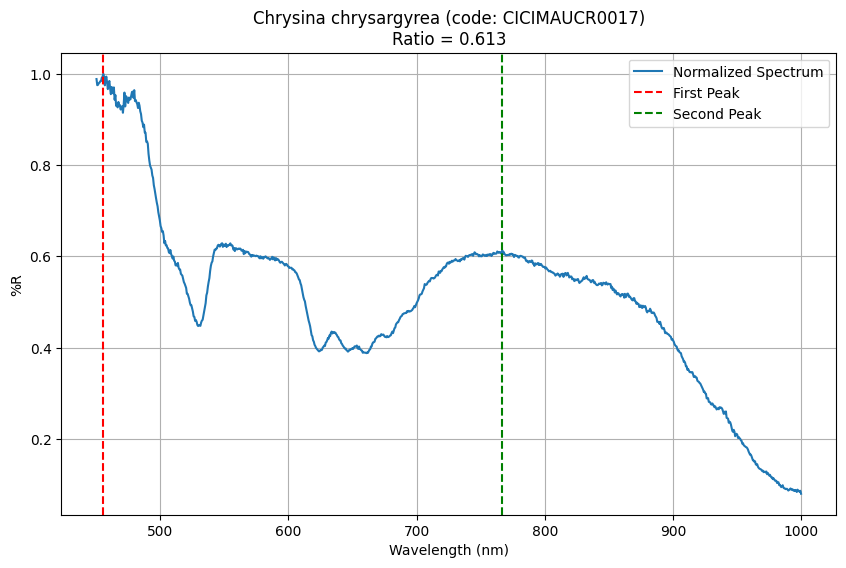

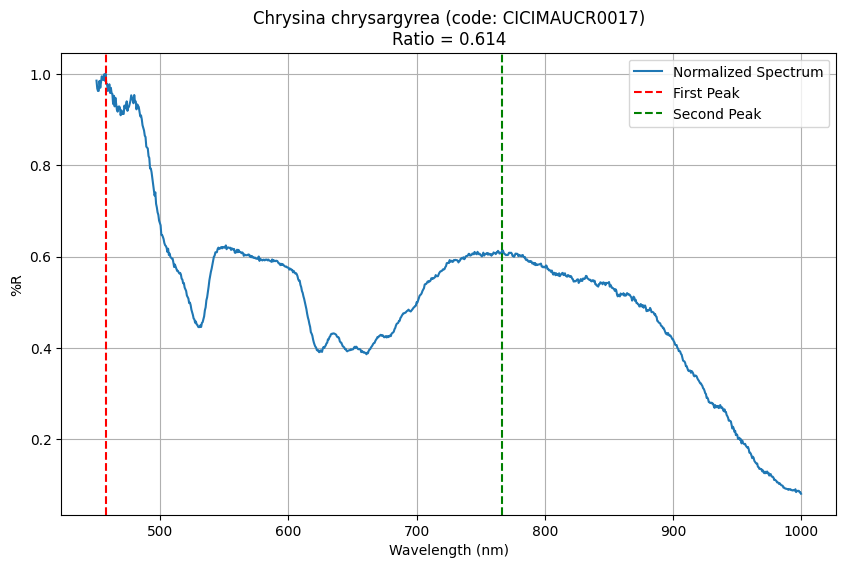

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0034 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0035 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0036 (Chrysina optima) — returning NaN.
  warnings.warn(


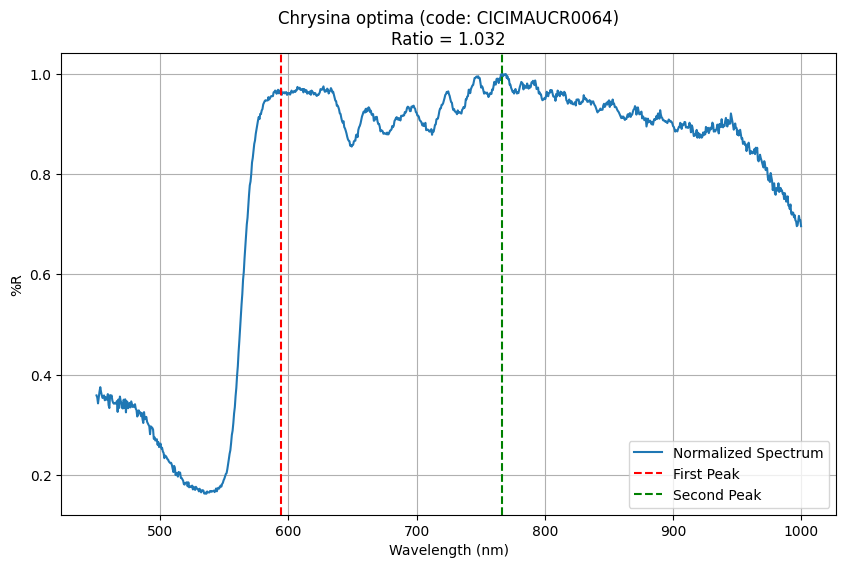

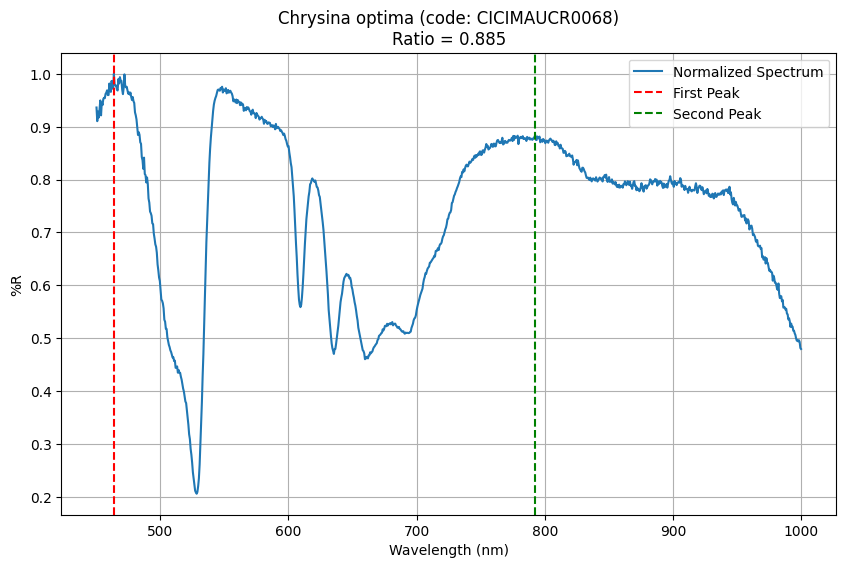

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0076 (Chrysina optima) — returning NaN.
  warnings.warn(


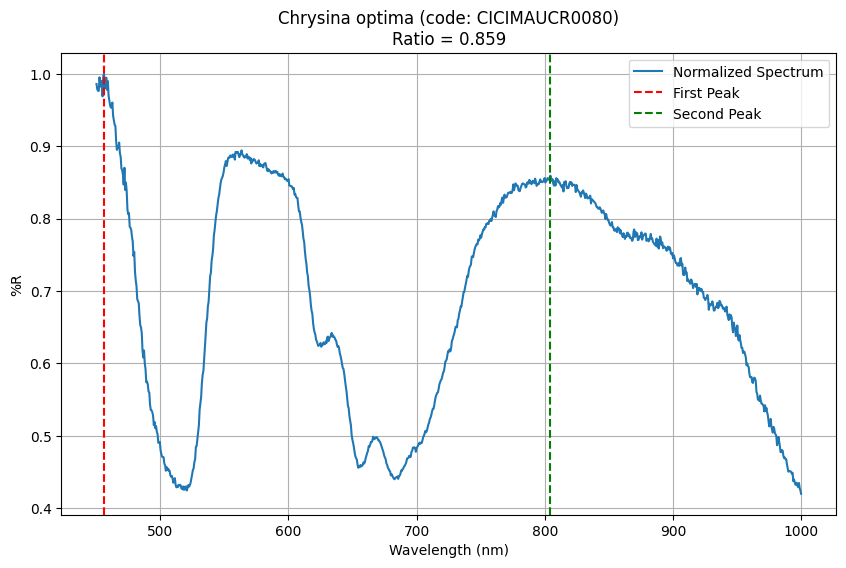

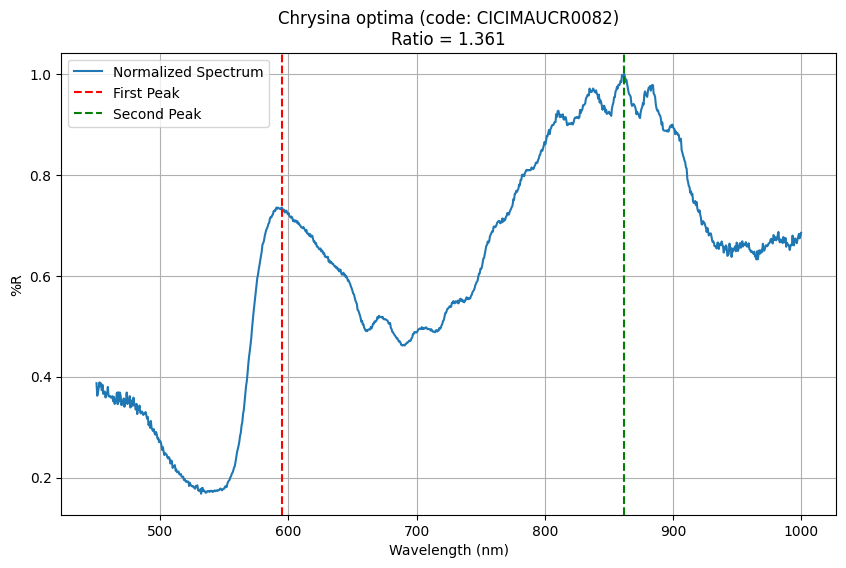

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0093 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0094 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0096 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0102 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0103 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\l

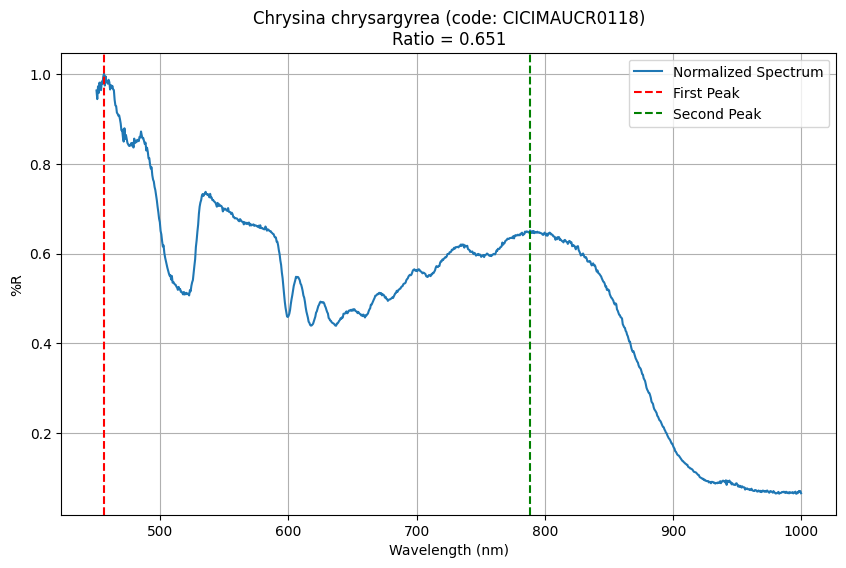

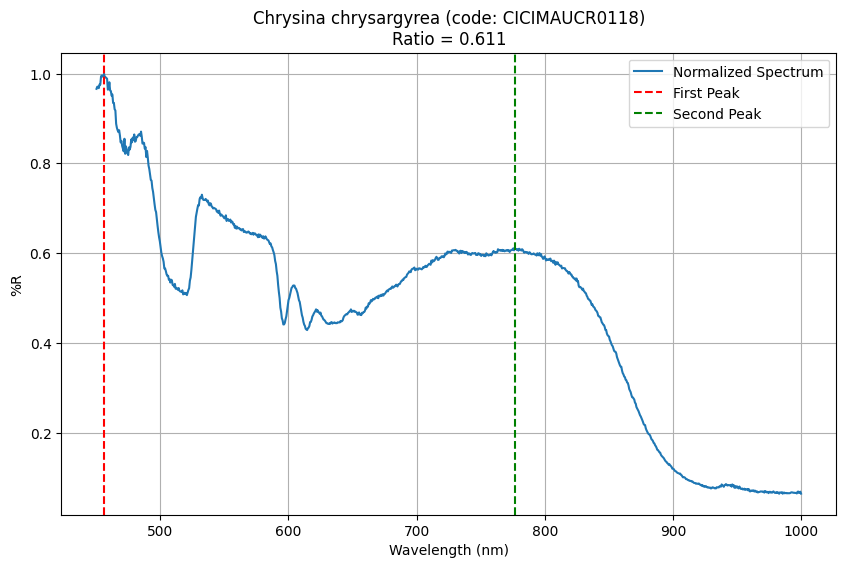

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0119 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


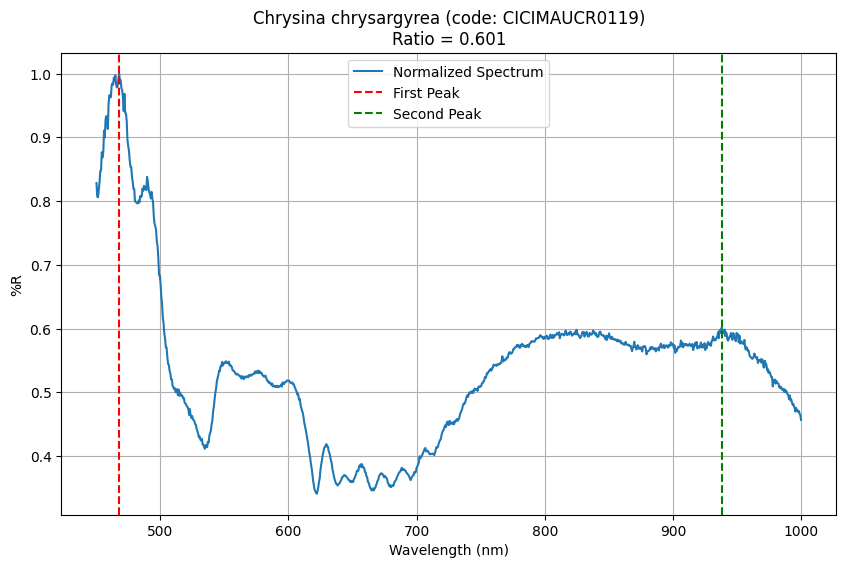

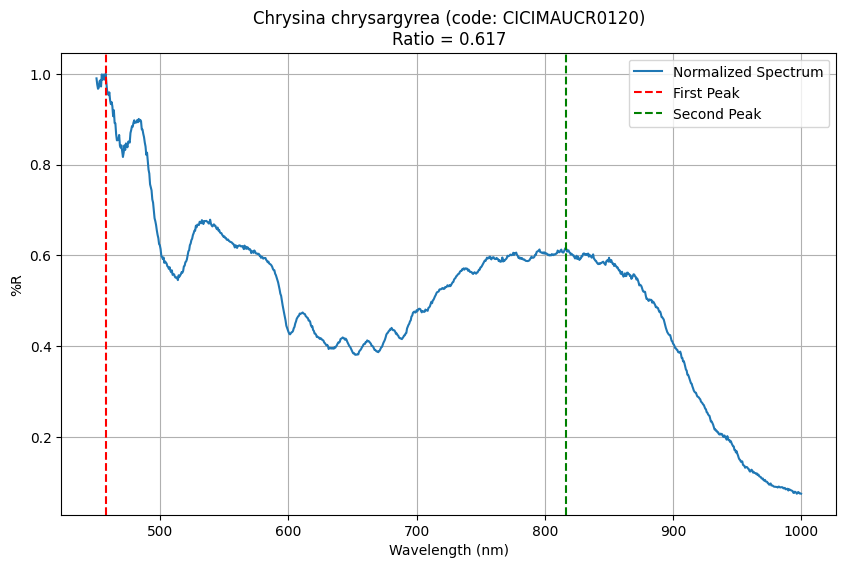

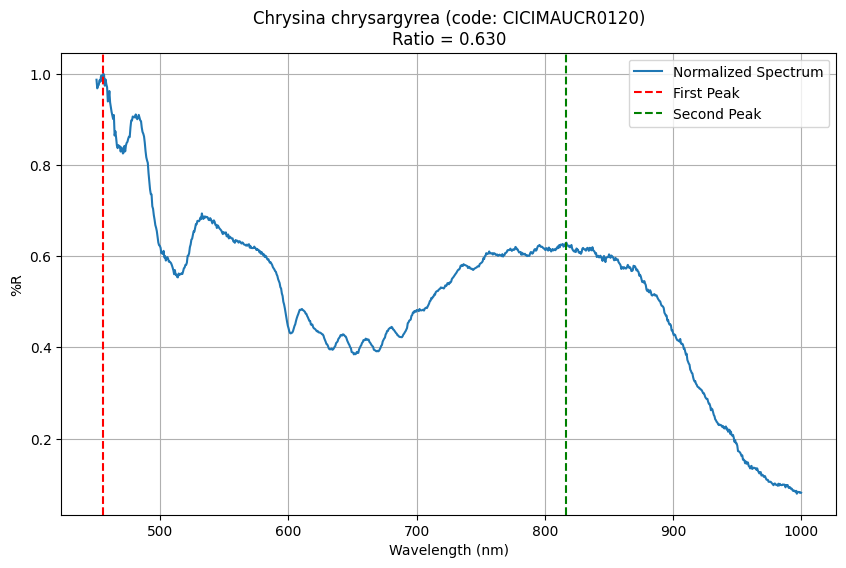

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0121 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0122 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0123 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


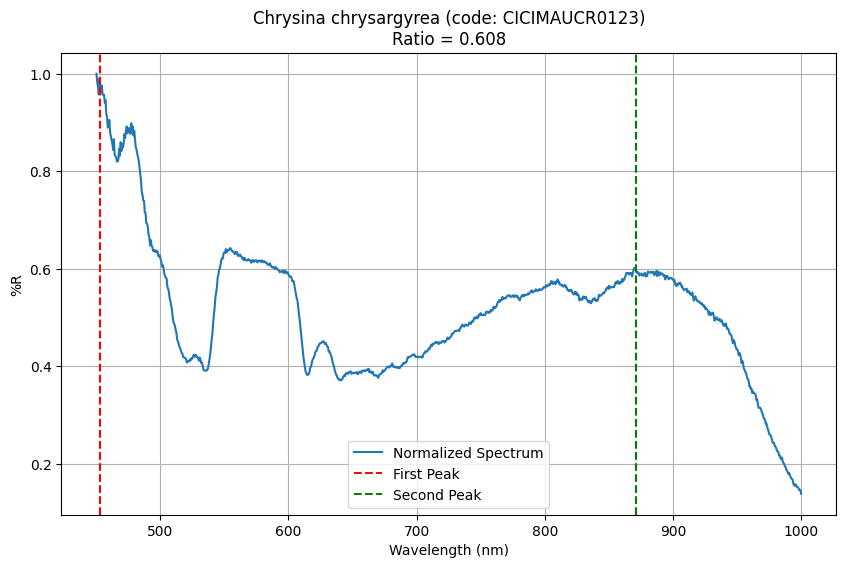

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0124 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


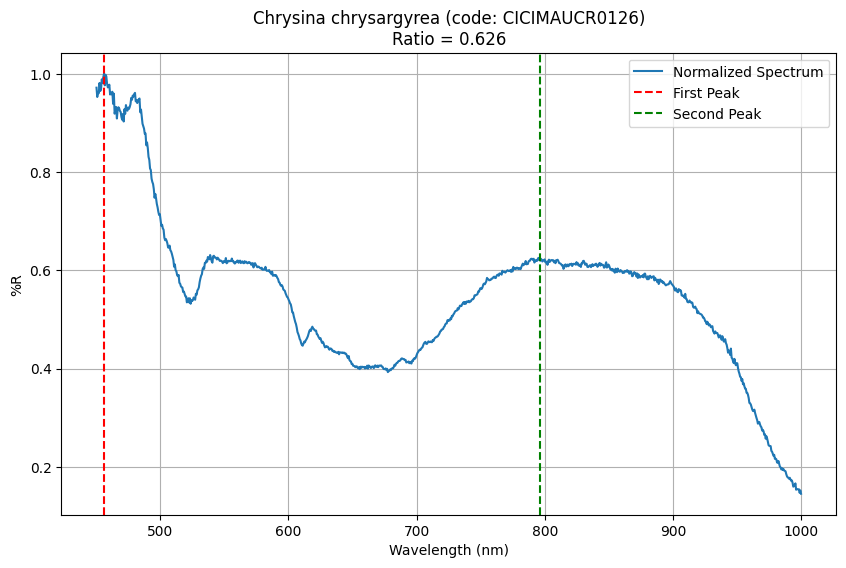

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0127 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


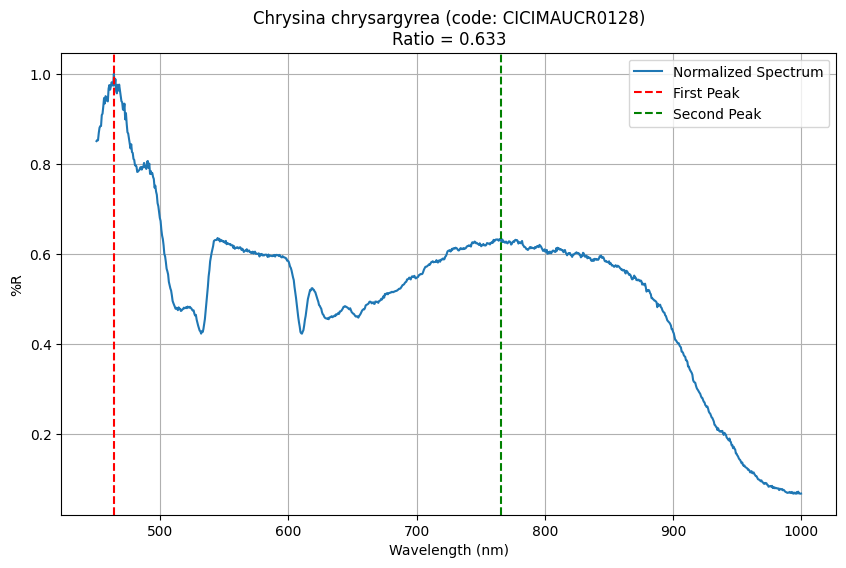

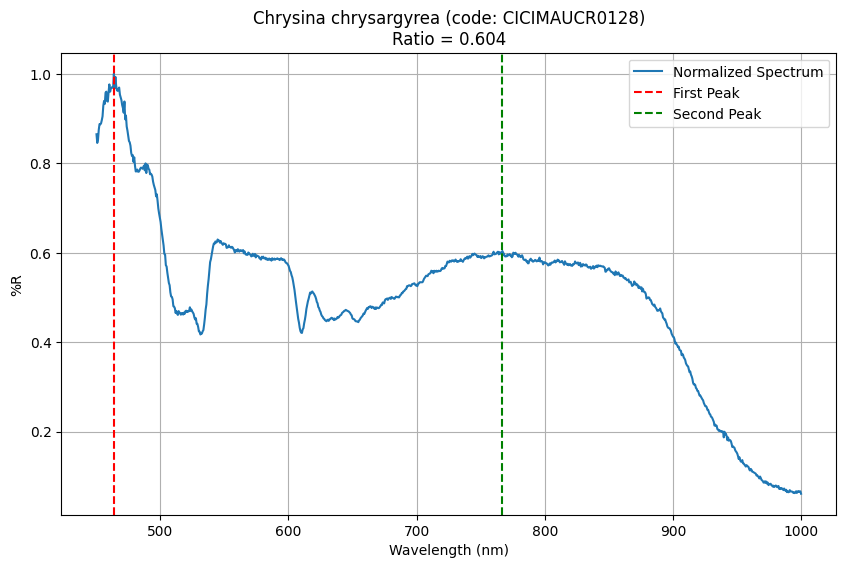

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0129 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0131 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0132 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0134 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0136 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\e

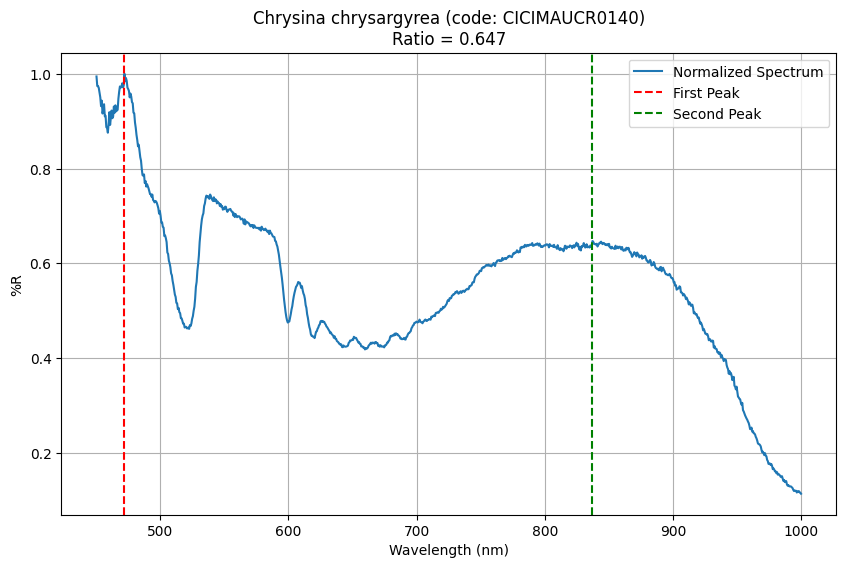

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0144 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0146 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0156 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


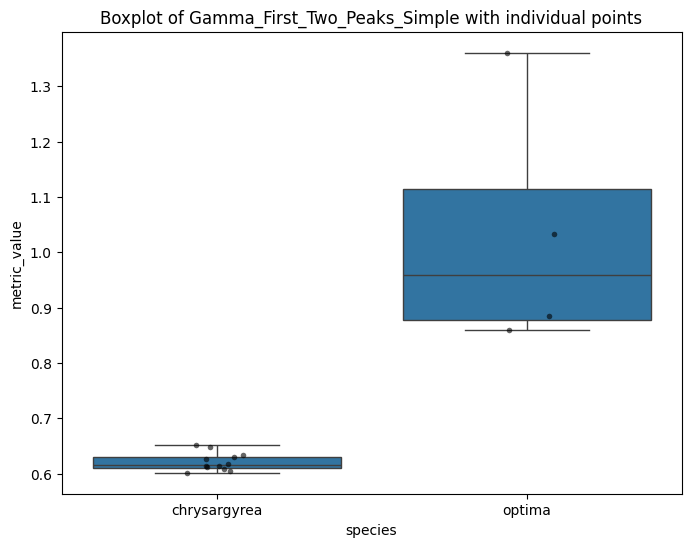

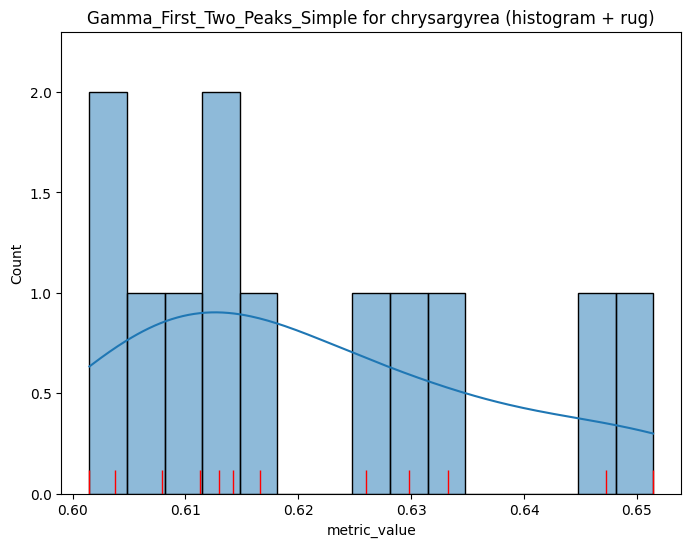

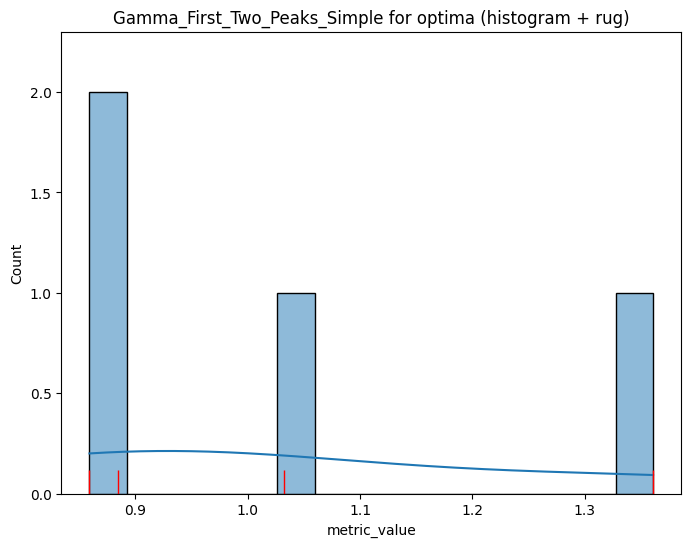

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
chrysargyrea,0.6213,0.0163,0.6154,0.6015,0.6514,12,NaN,0.0263
optima,1.0342,0.2306,0.9584,0.8594,1.3606,4,NaN,0.2229


In [21]:
get_aggregated_data(Gamma_First_Two_Peaks_Simple,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

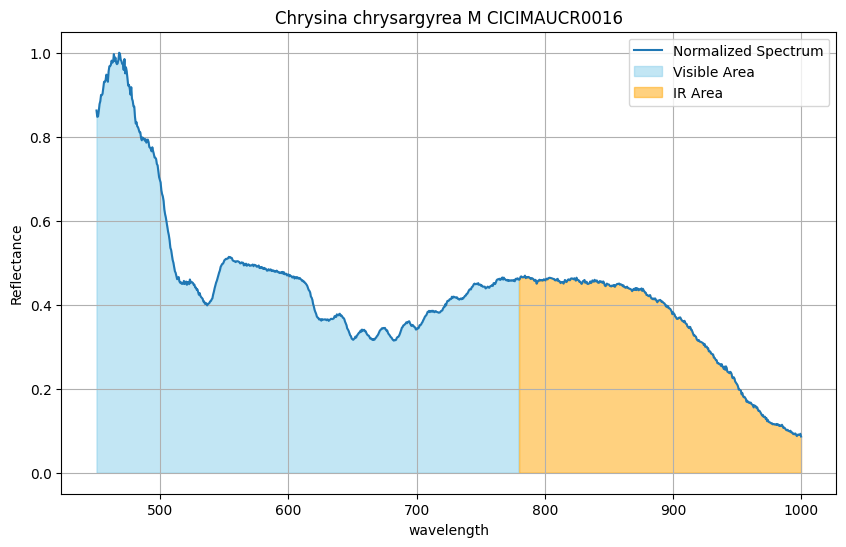

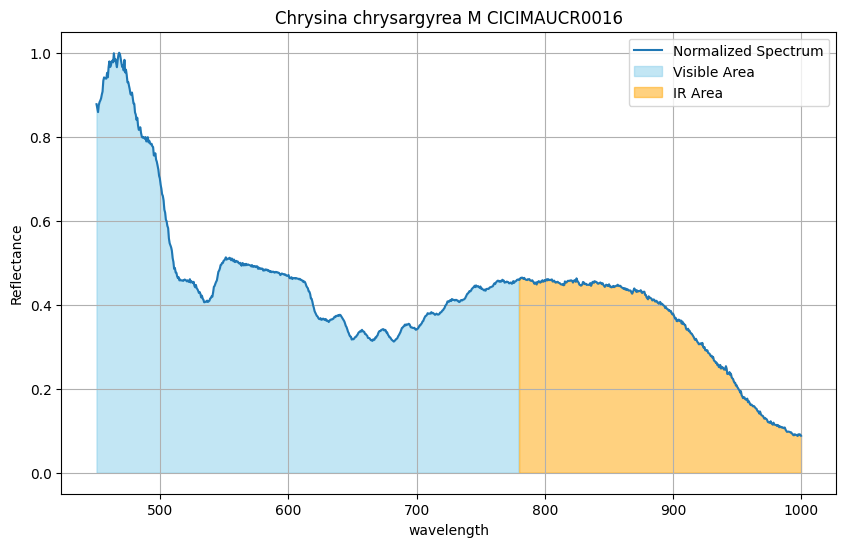

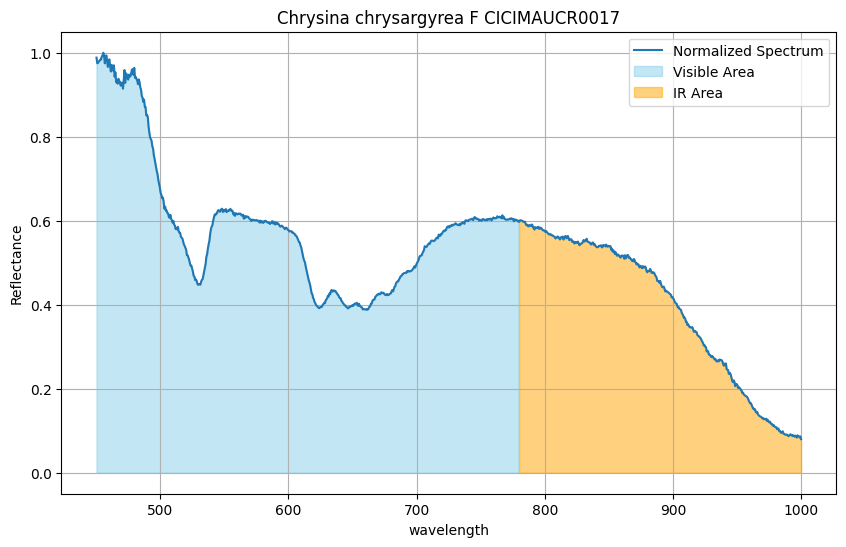

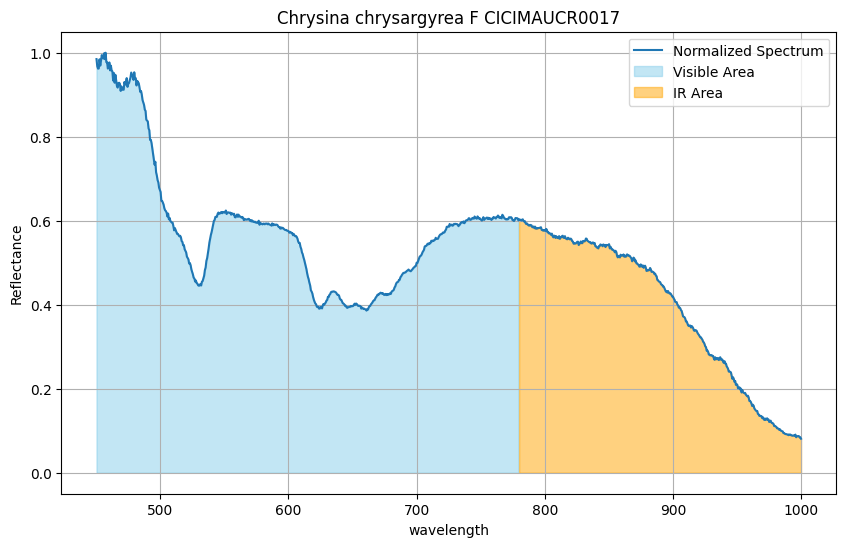

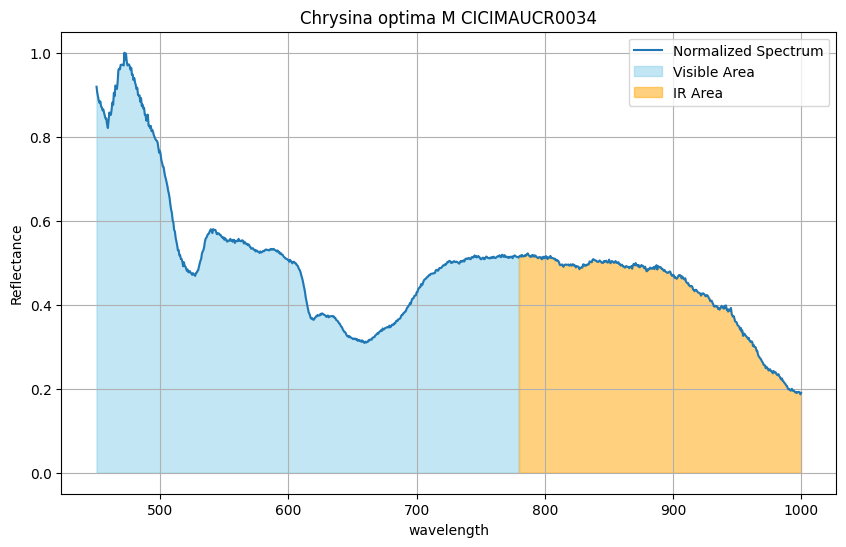

...

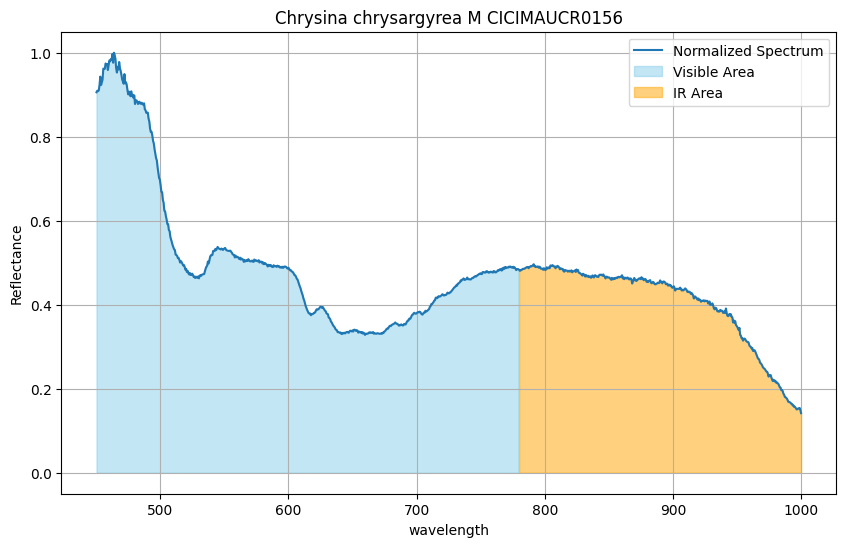

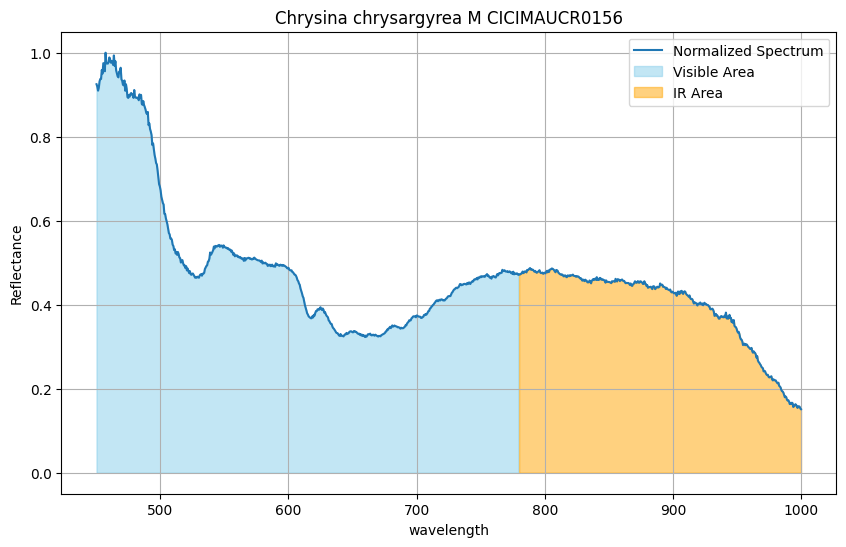

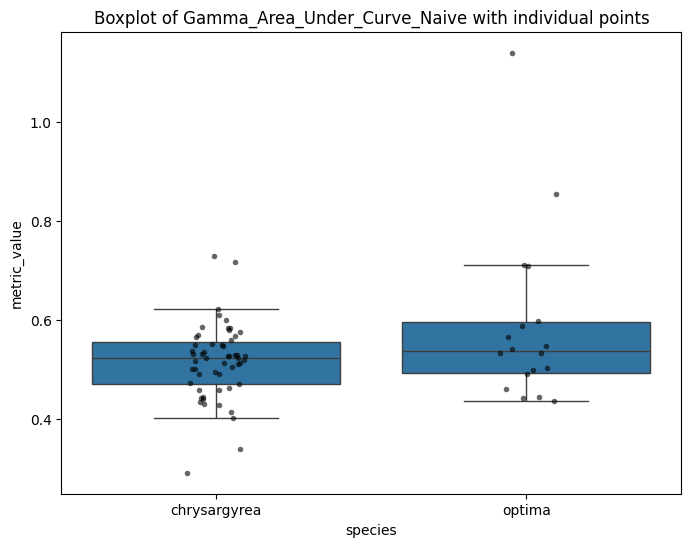

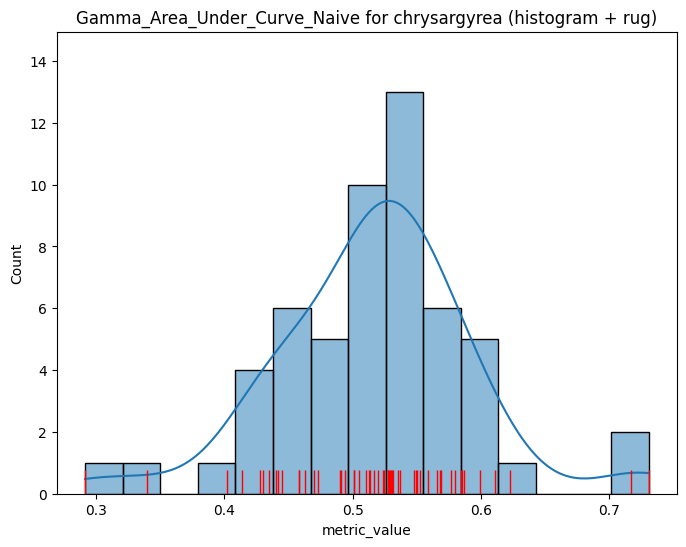

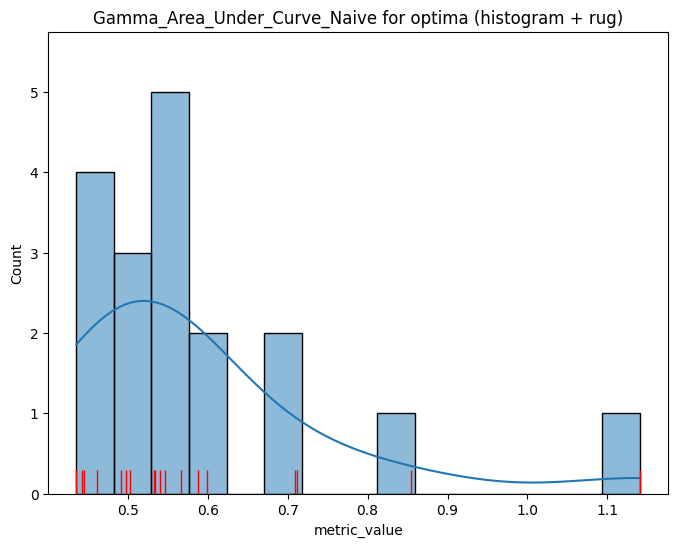

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
chrysargyrea,0.5168,0.0759,0.5241,0.2915,0.7307,55,0.0840,0.1469
optima,0.5891,0.1752,0.5376,0.4357,1.1407,18,0.1024,0.2975


In [22]:
get_aggregated_data(Gamma_Area_Under_Curve_Naive,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

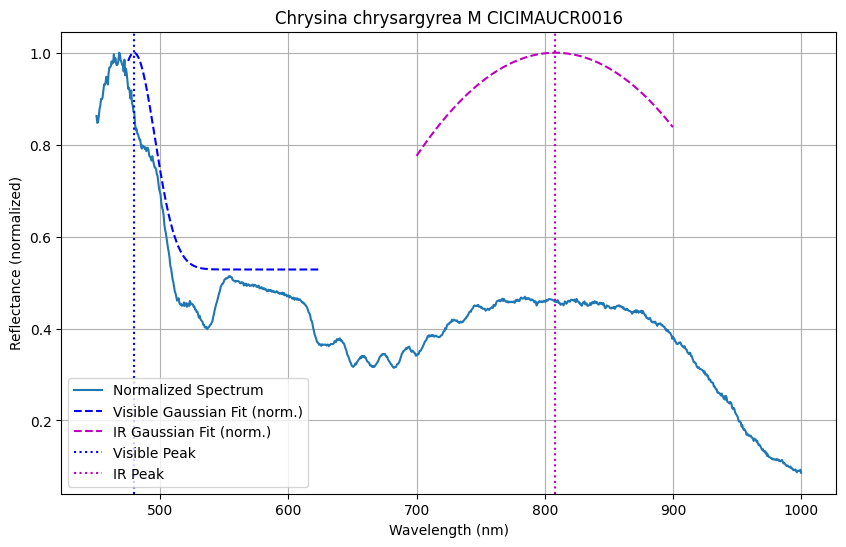

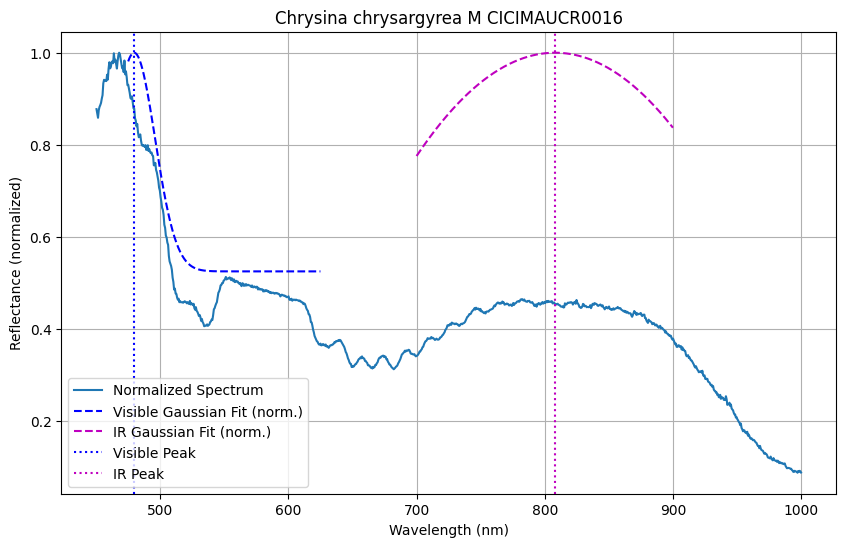

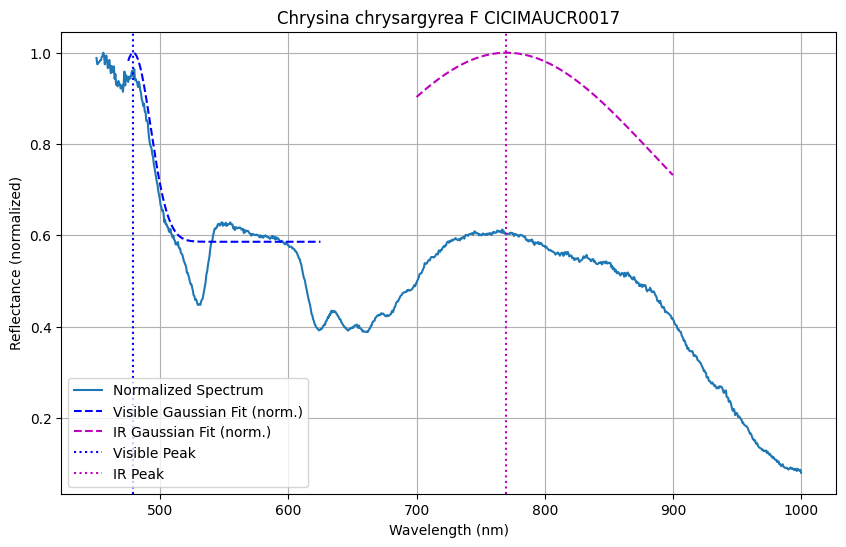

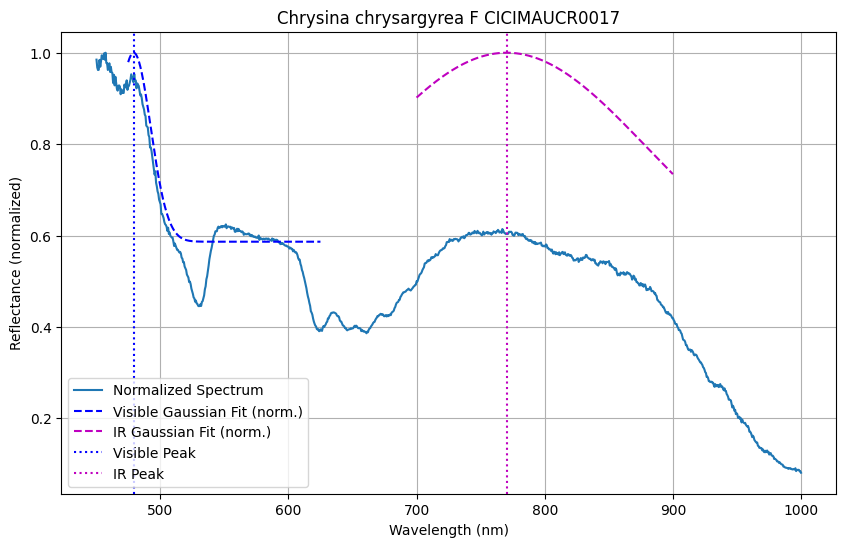

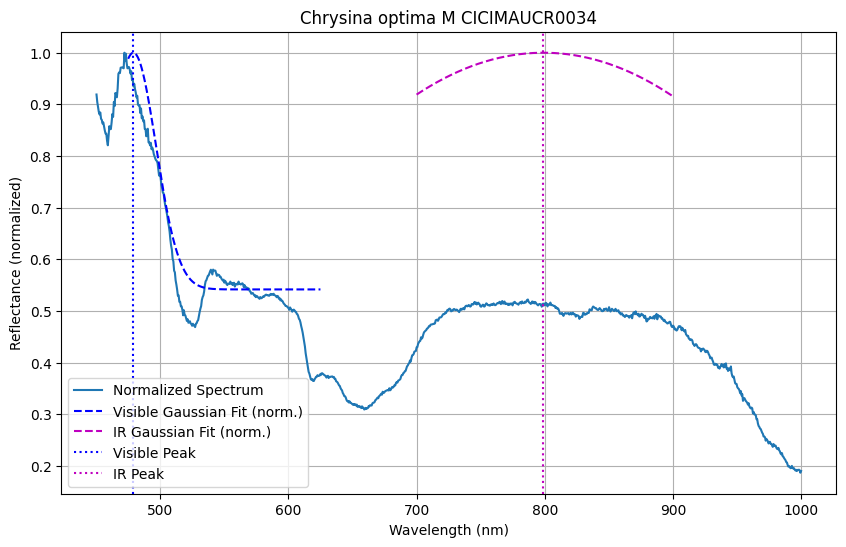

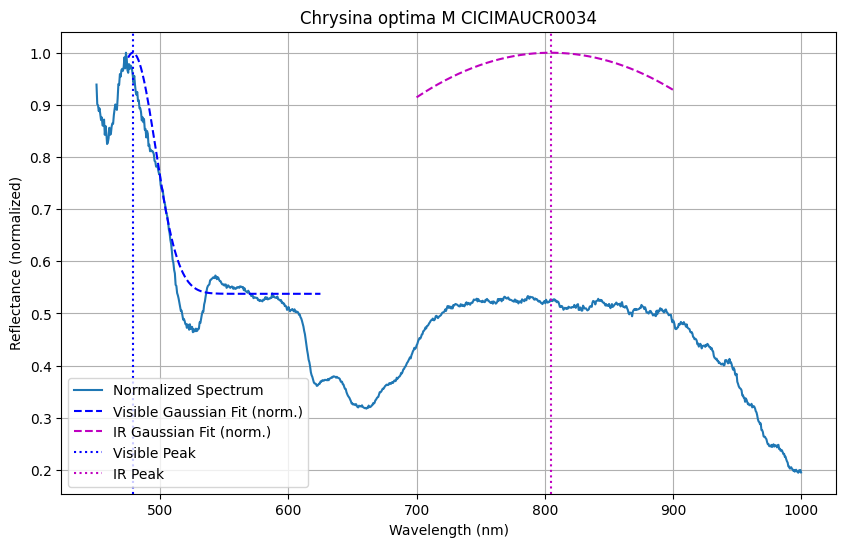

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0035 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


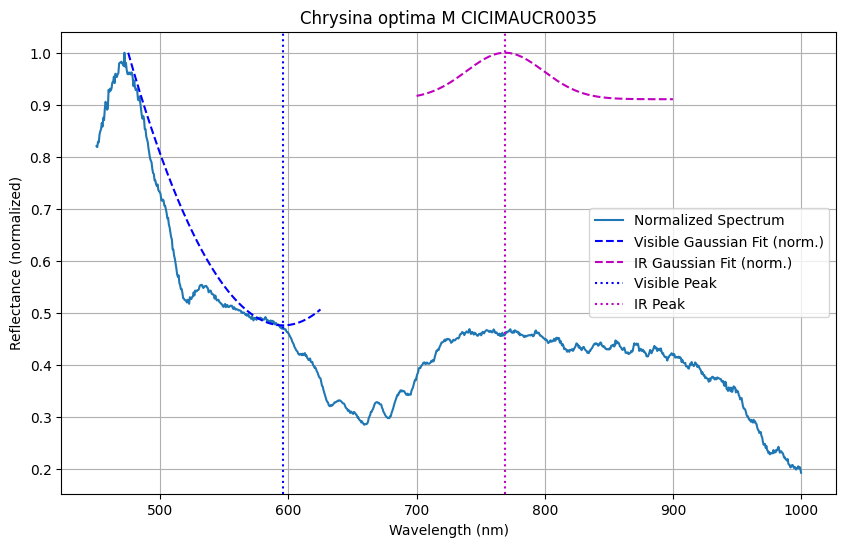

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0036 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


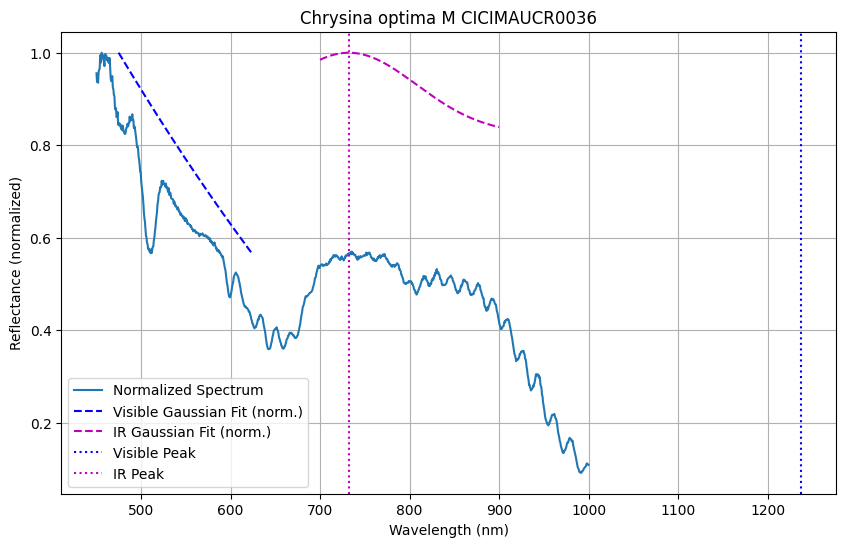

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0036 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


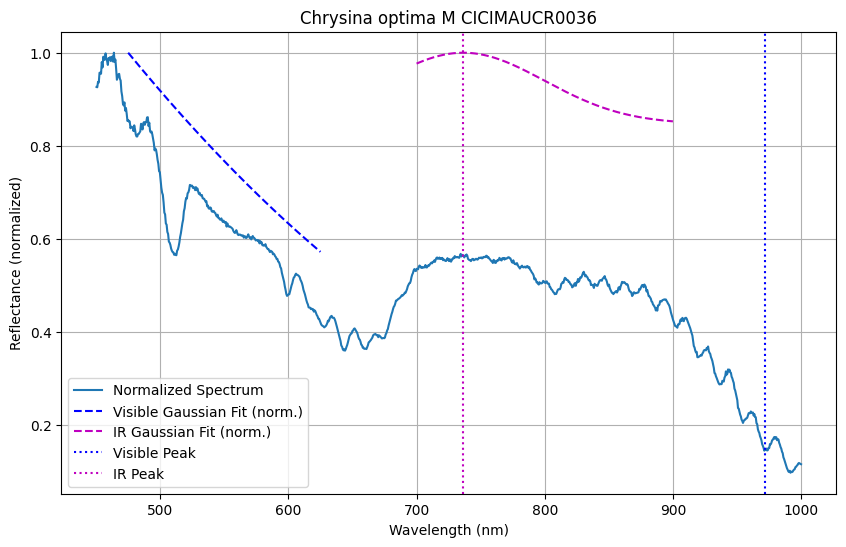

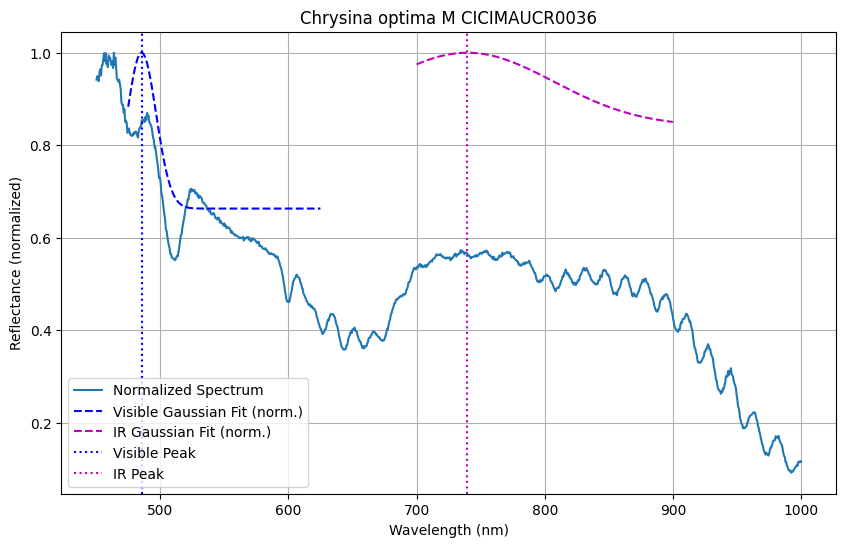

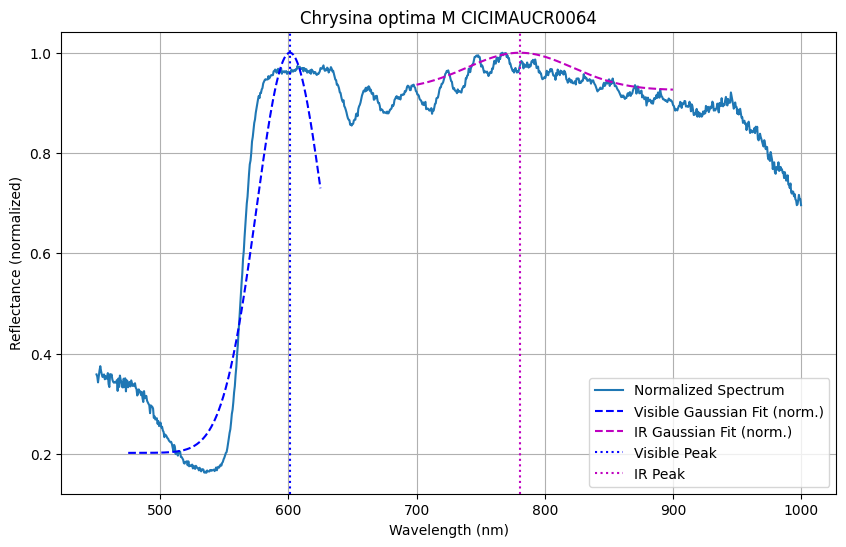

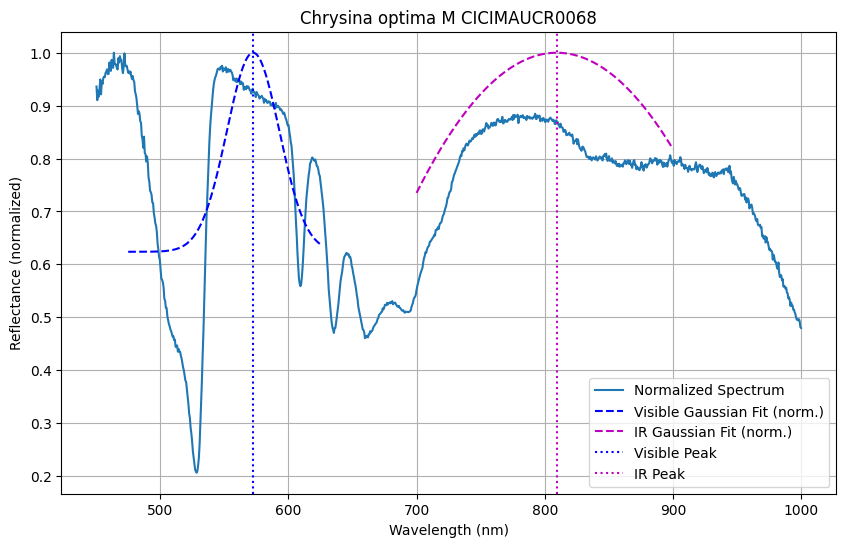

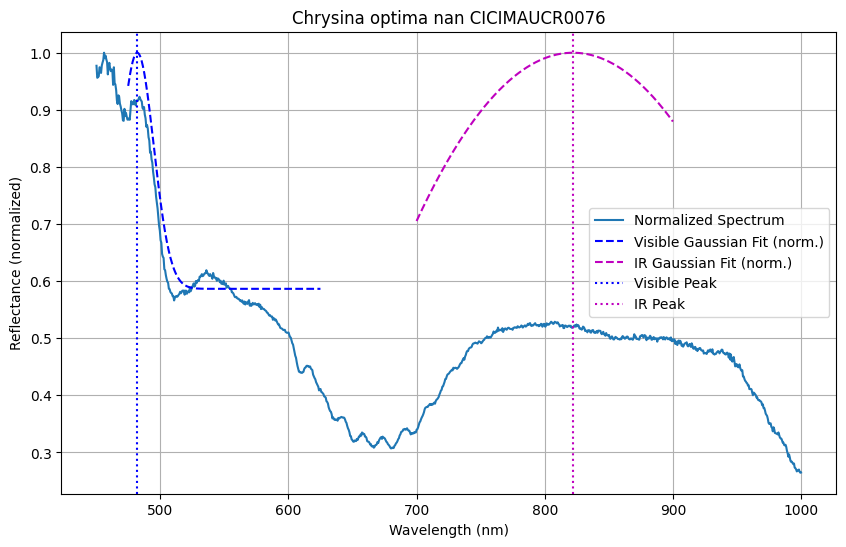

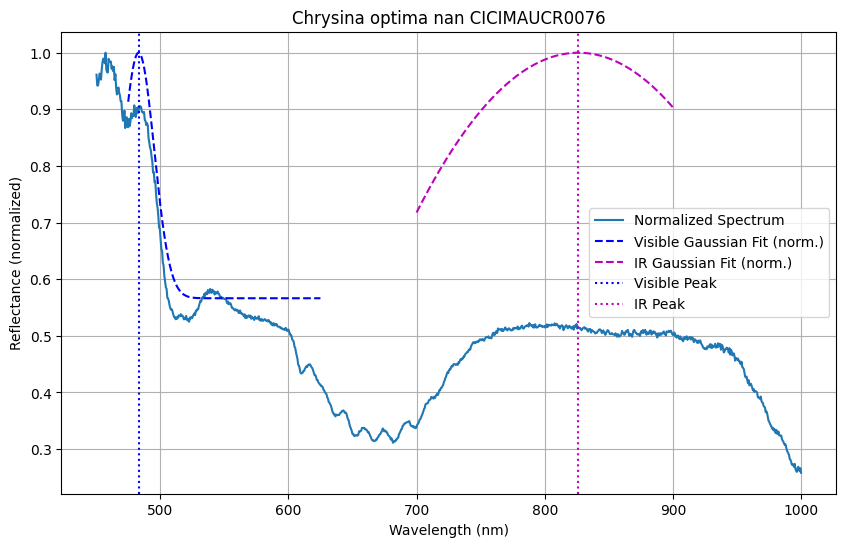

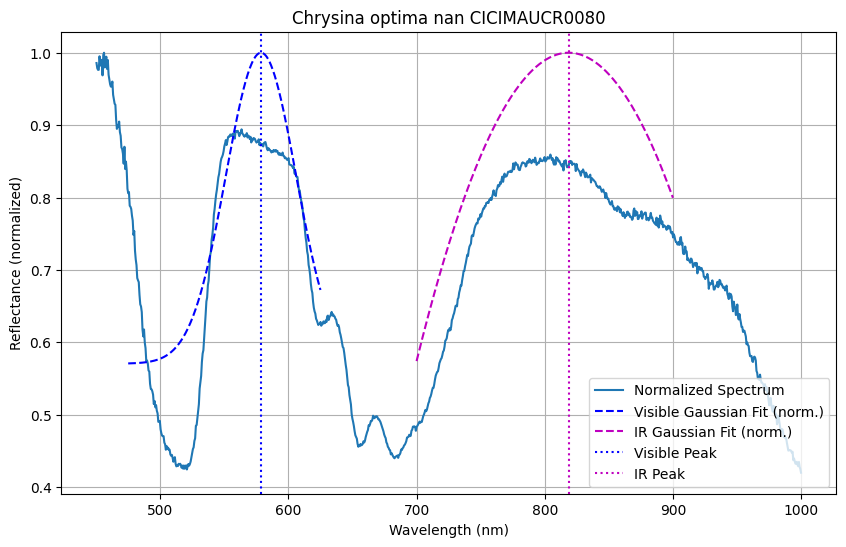

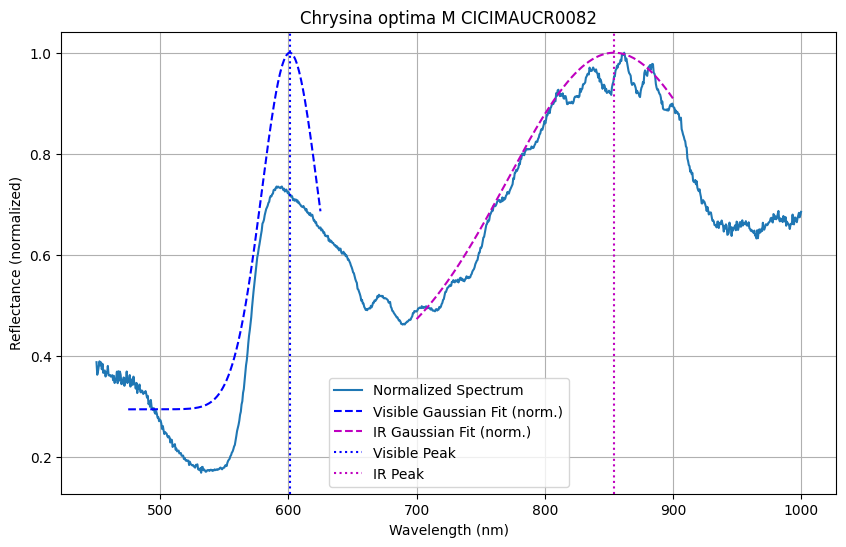

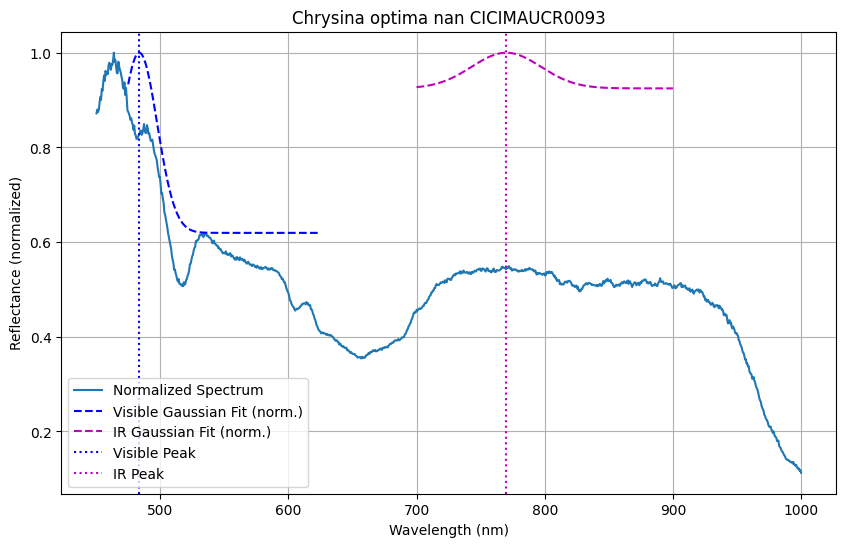

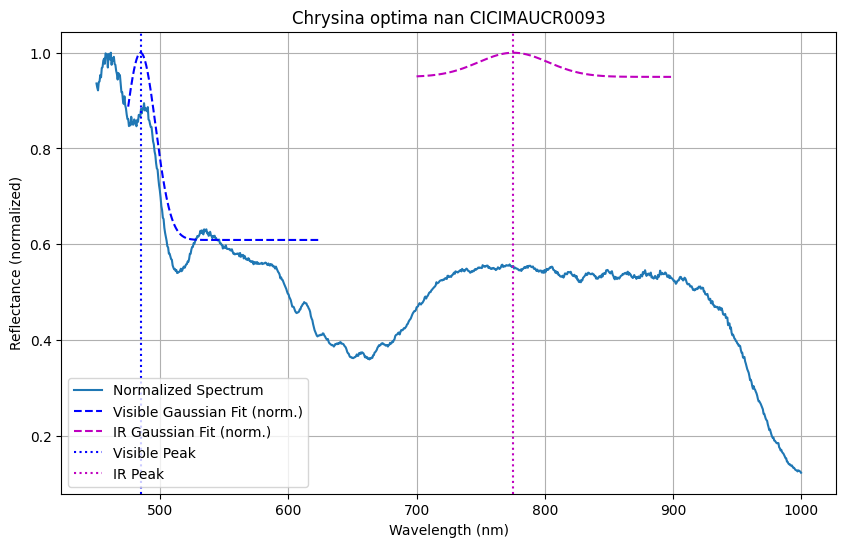

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0094 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


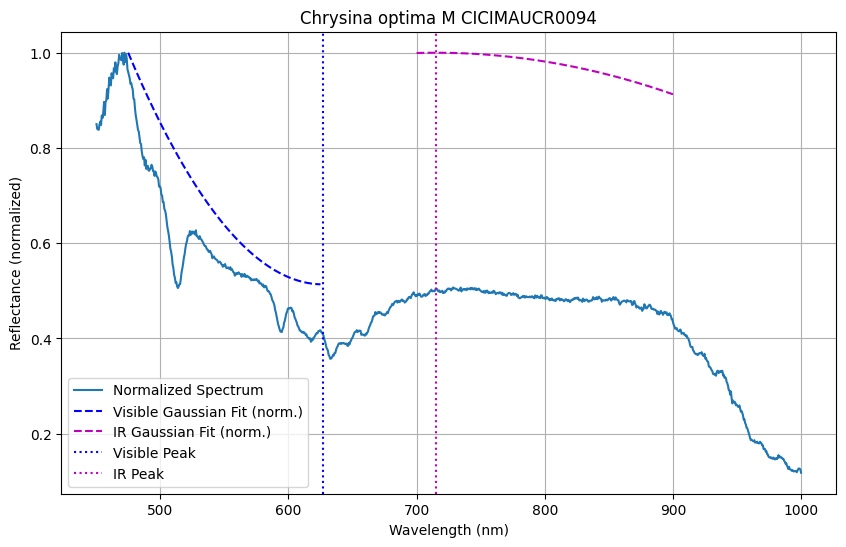

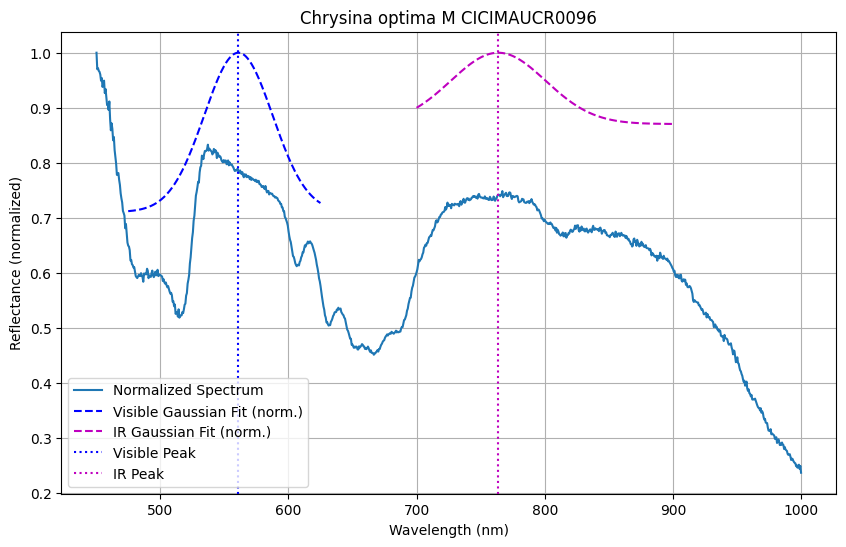

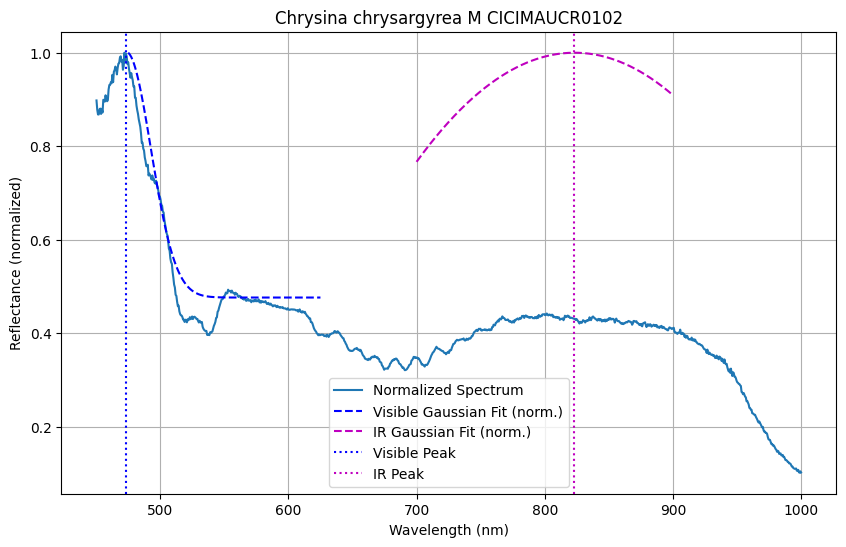

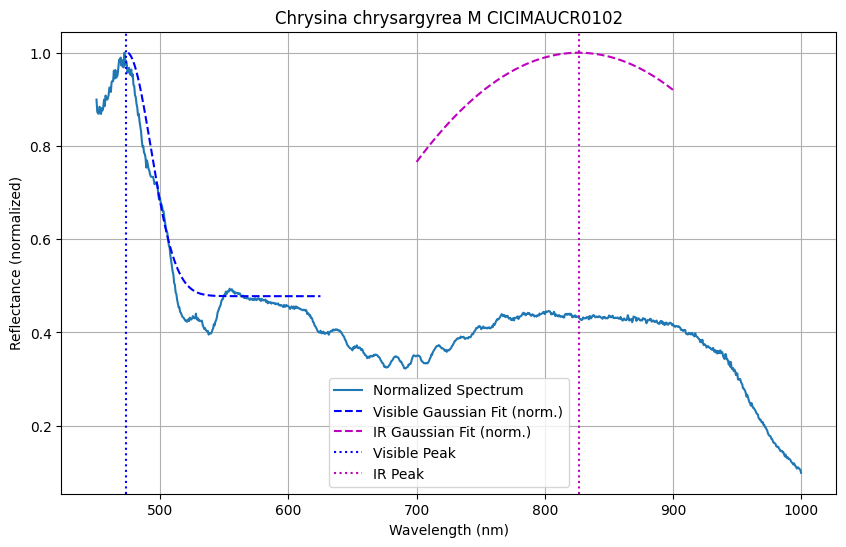

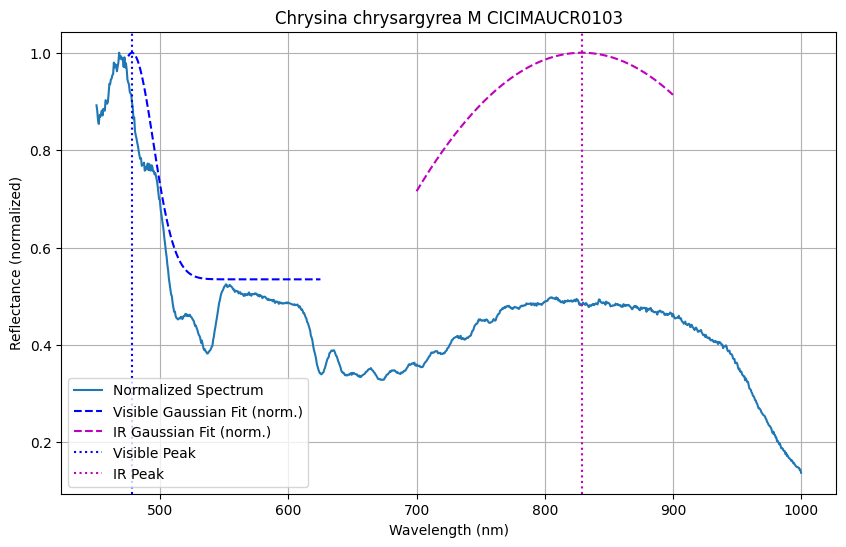

...

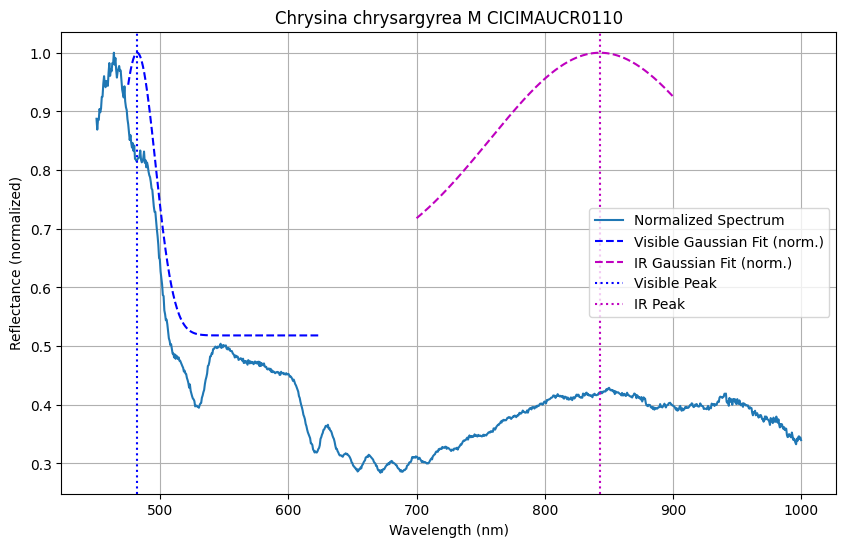

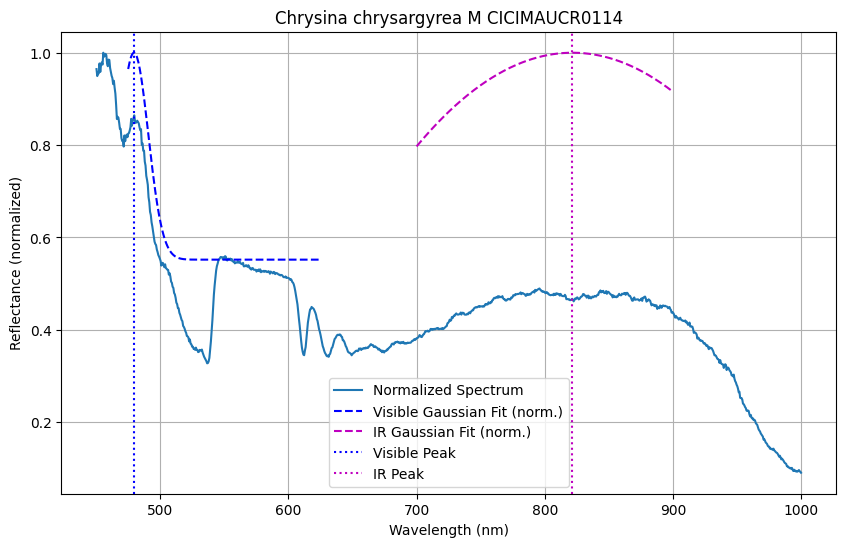

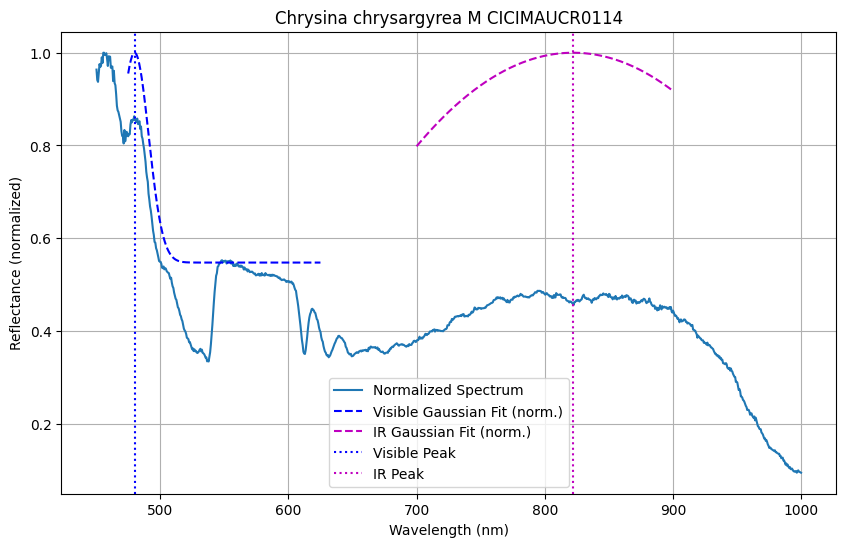

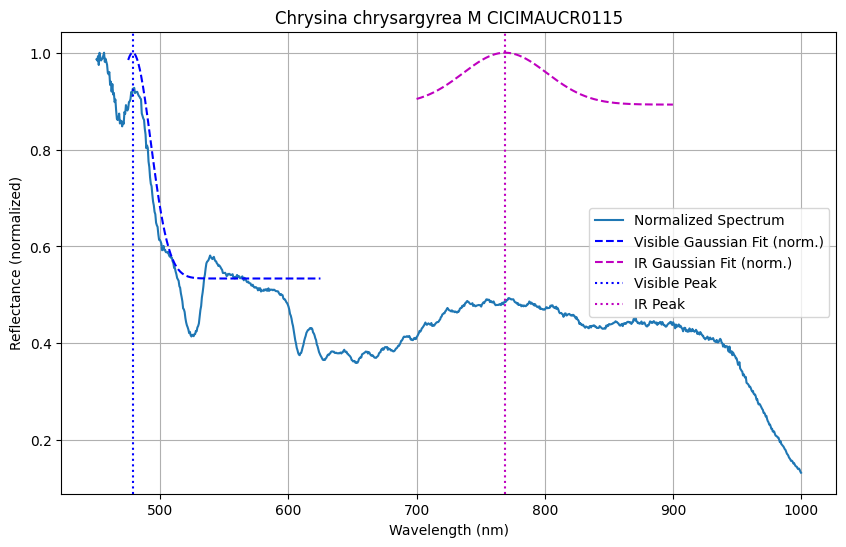

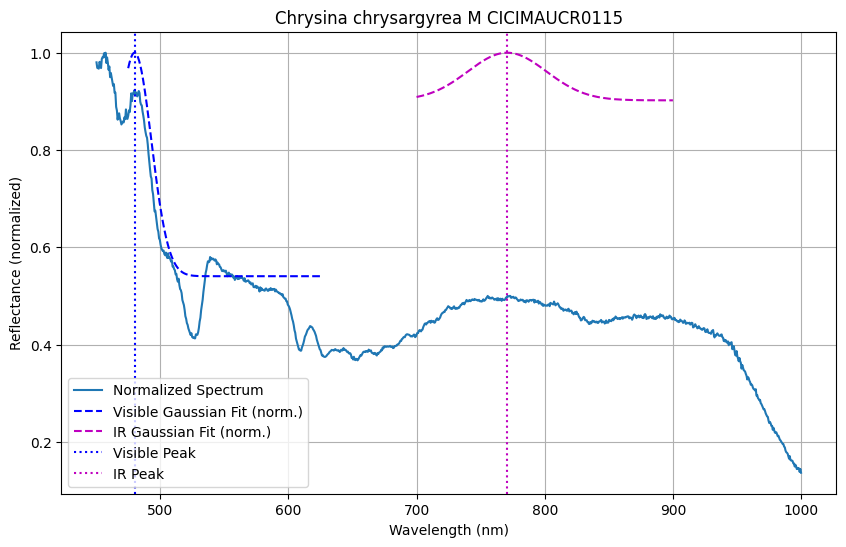

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0117 (Chrysina chrysargyrea): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


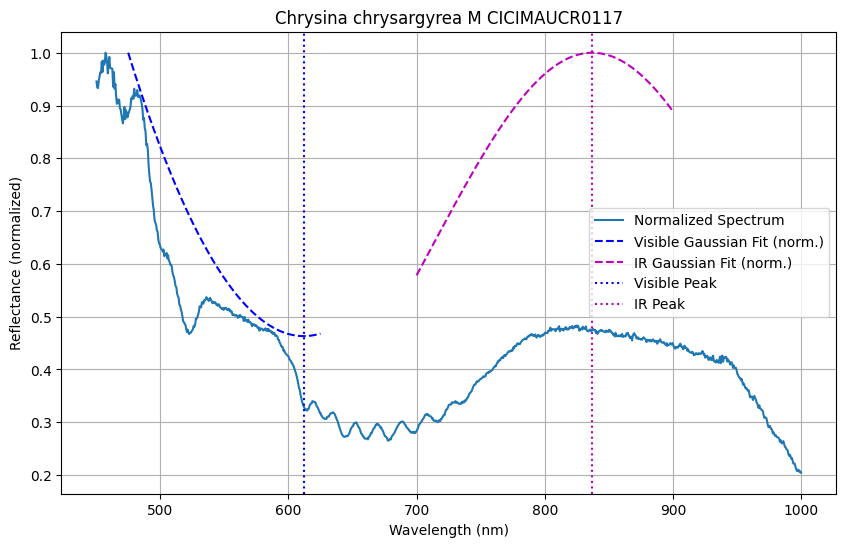

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0117 (Chrysina chrysargyrea): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


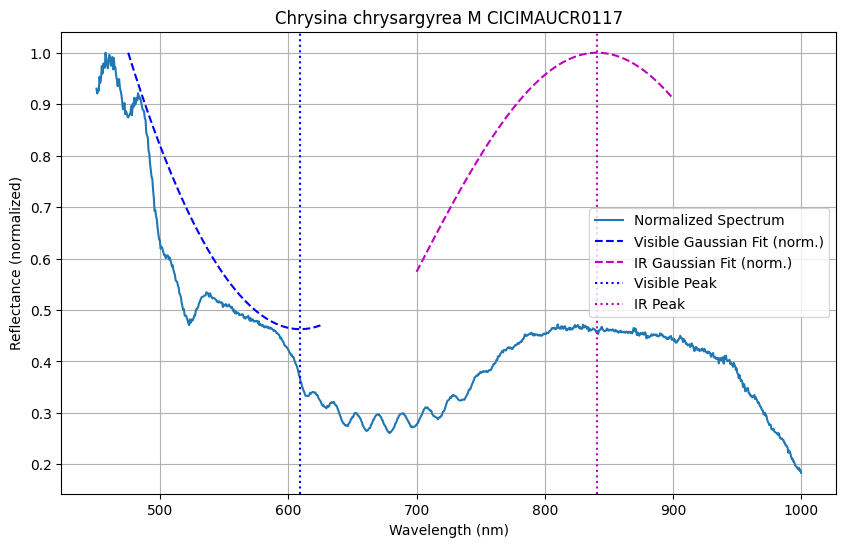

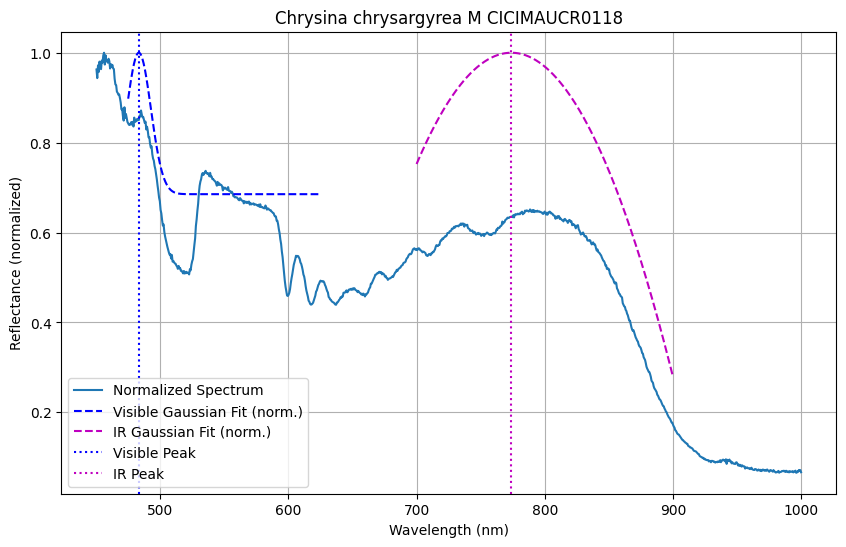

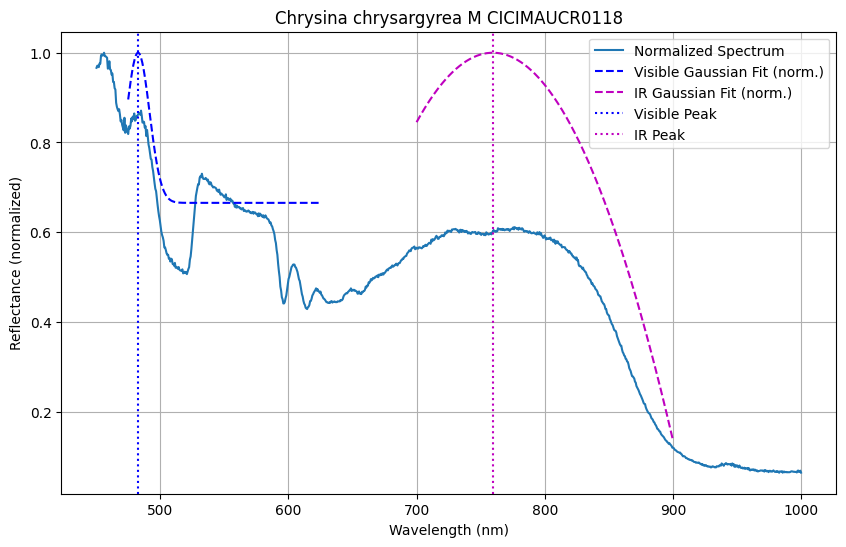

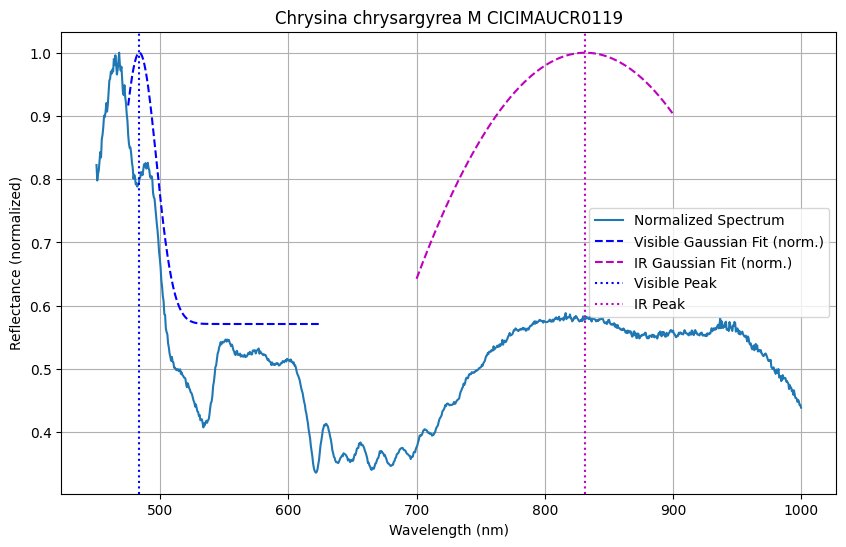

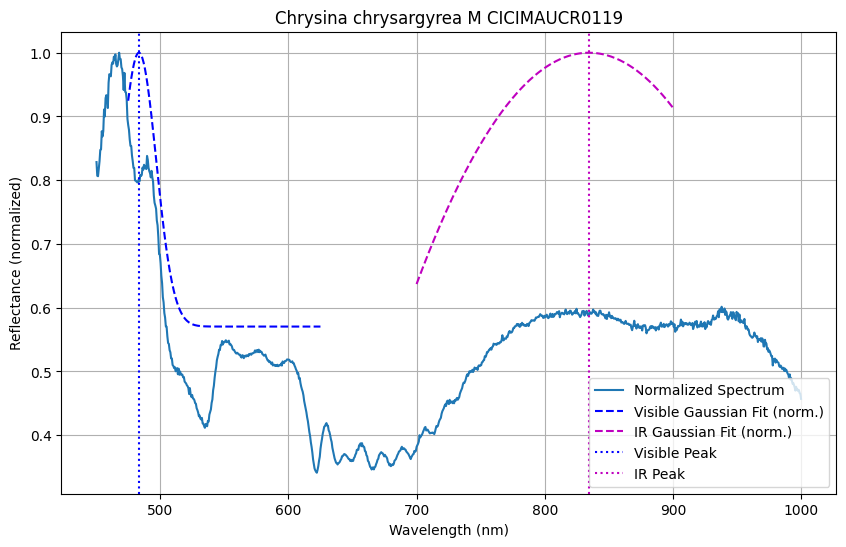

...

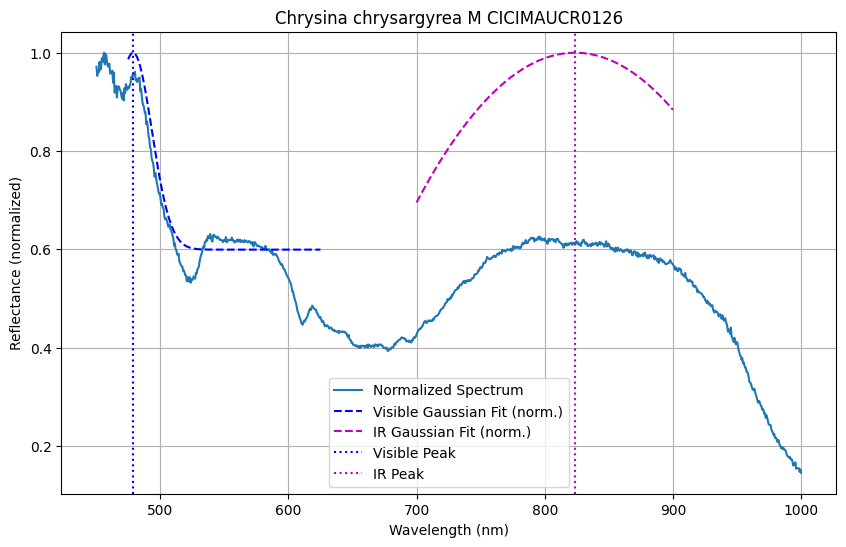

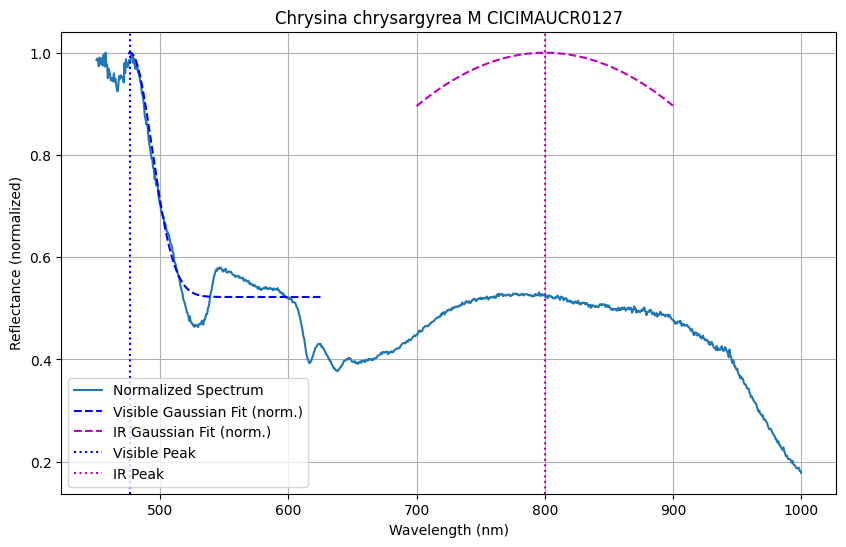

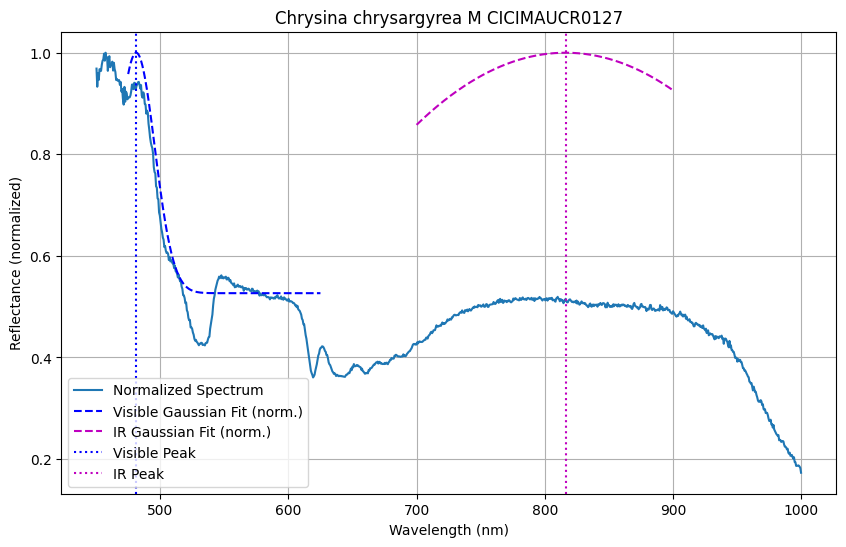

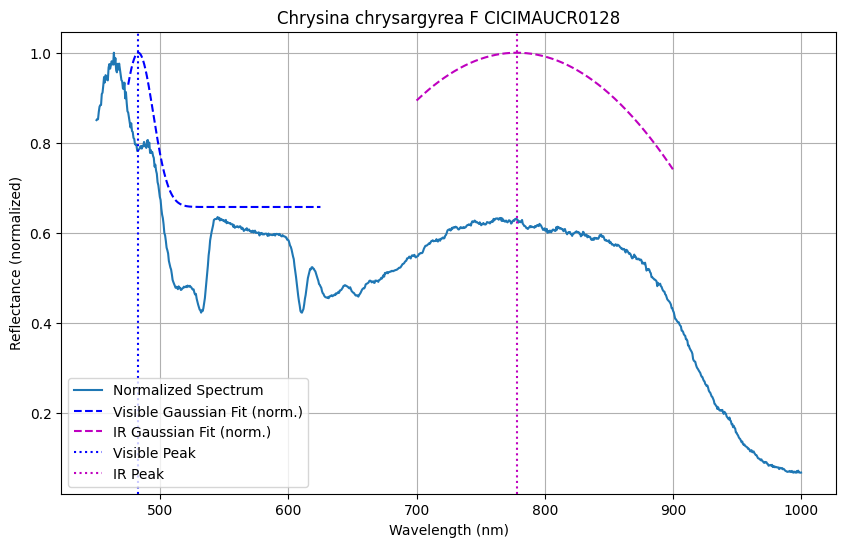

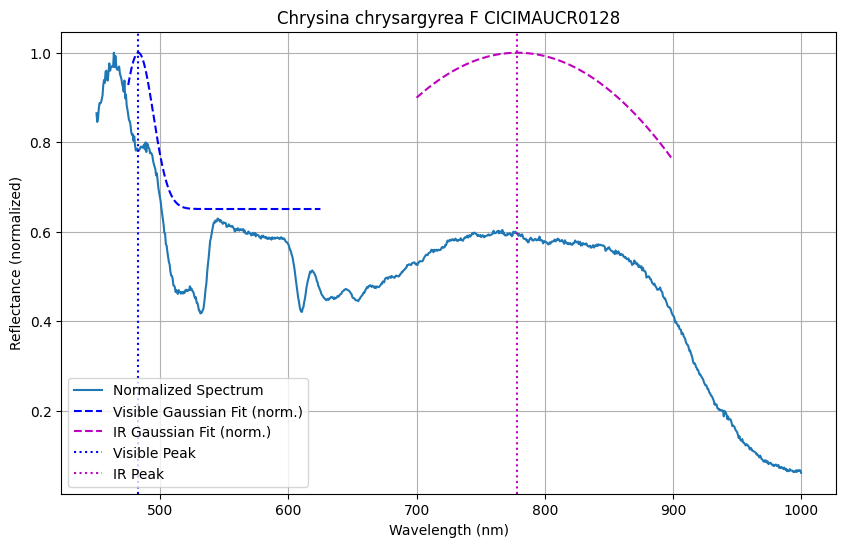

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0129 (Chrysina chrysargyrea): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


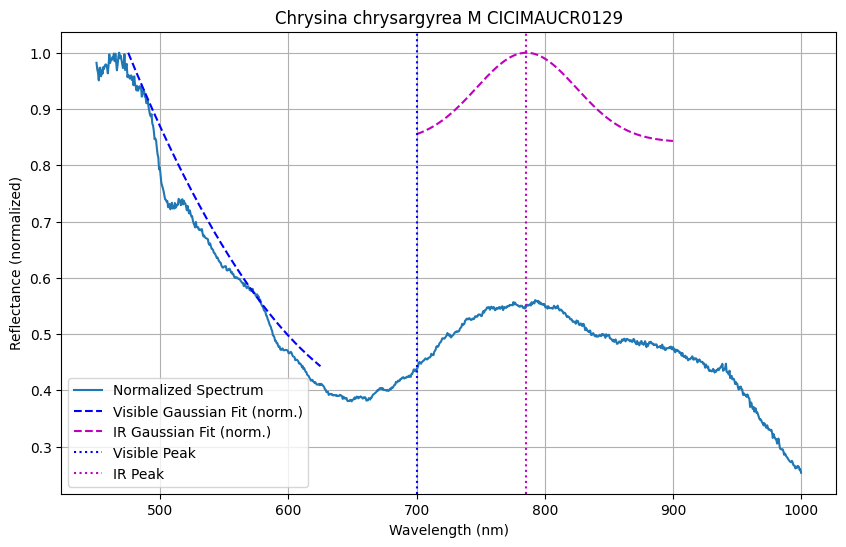

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0129 (Chrysina chrysargyrea): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


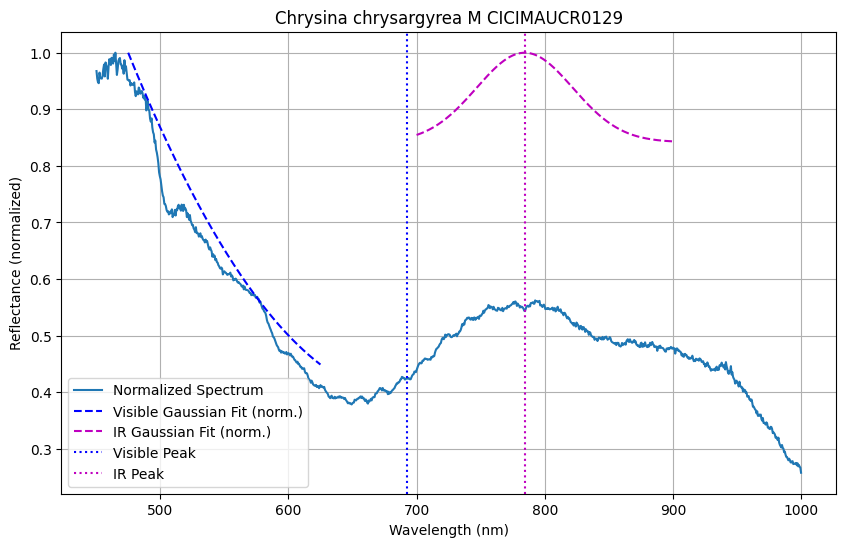

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0131 (Chrysina chrysargyrea): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(


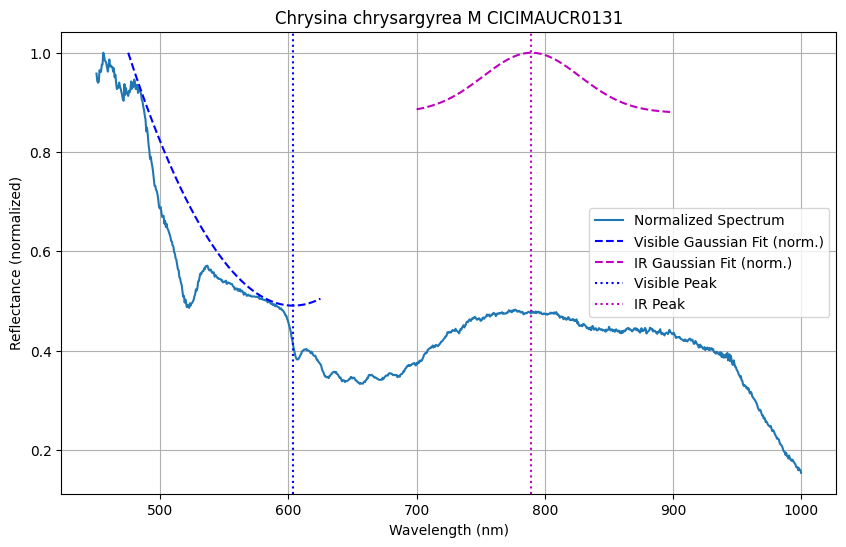

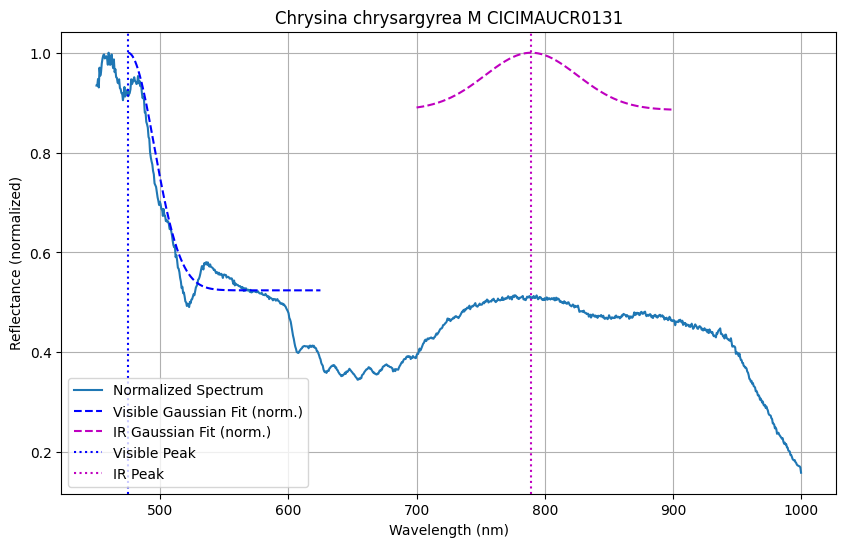

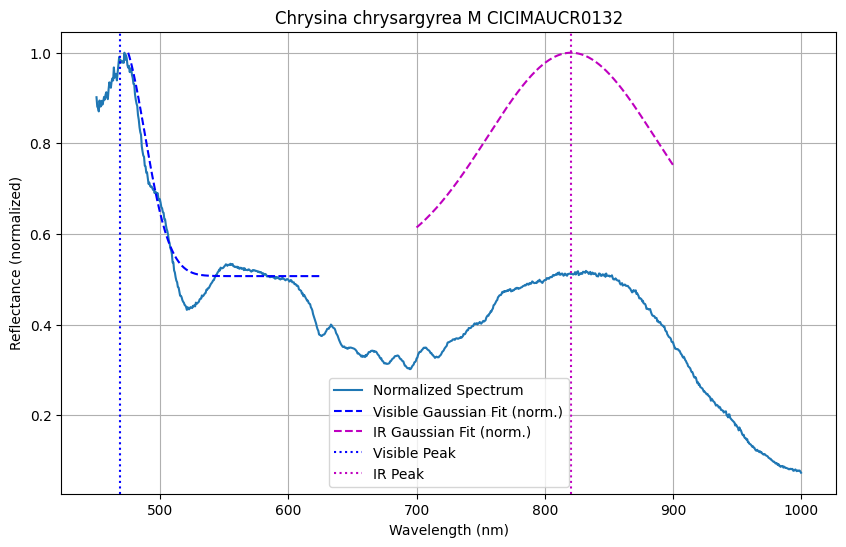

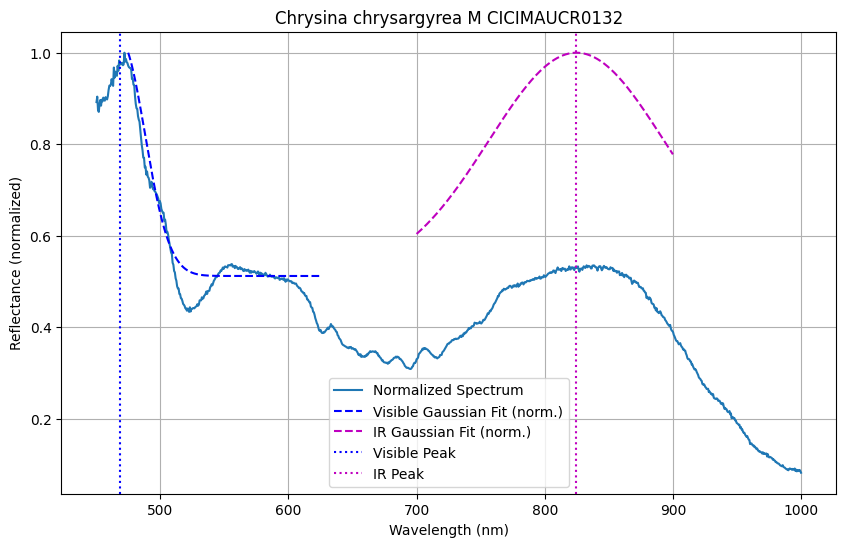

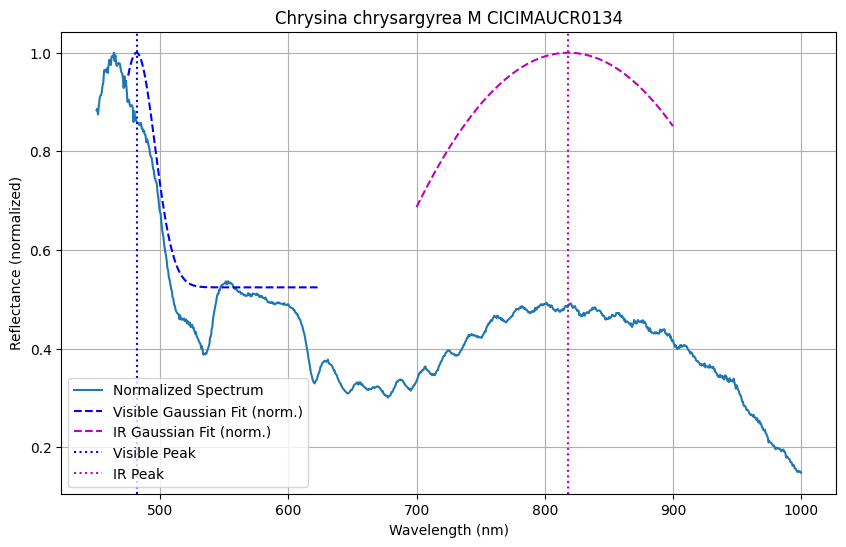

...

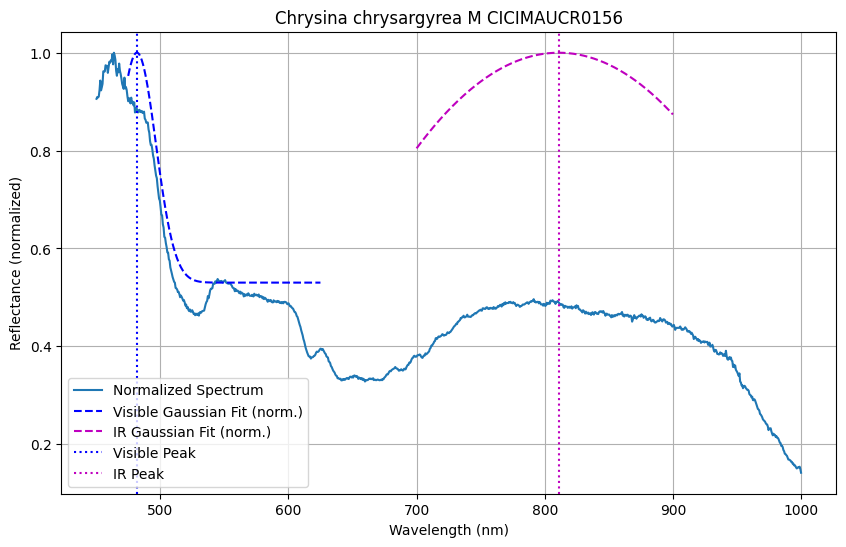

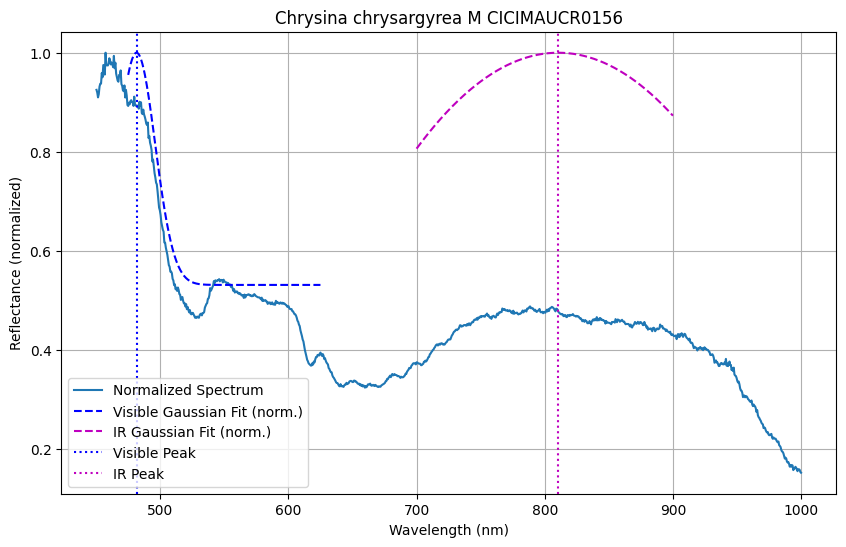

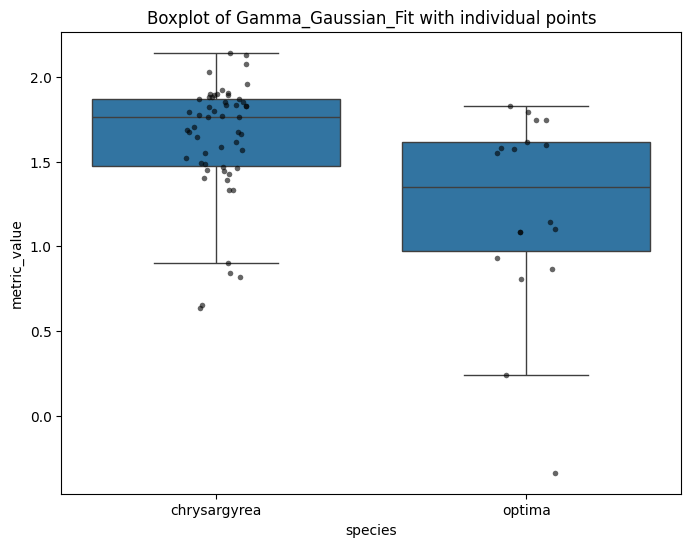

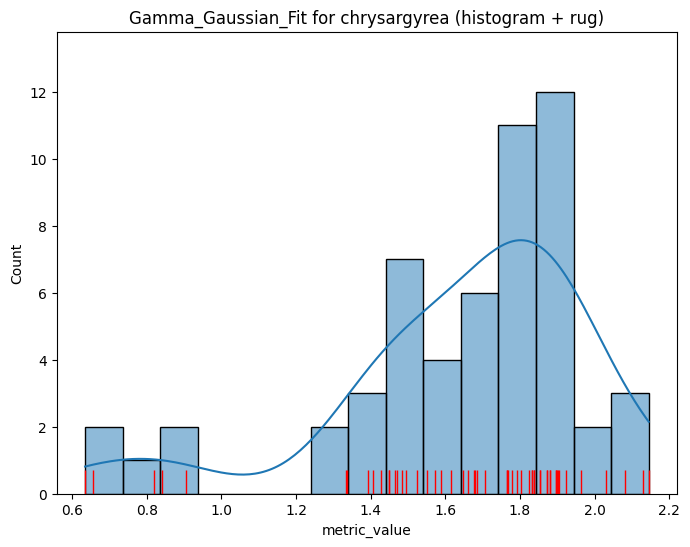

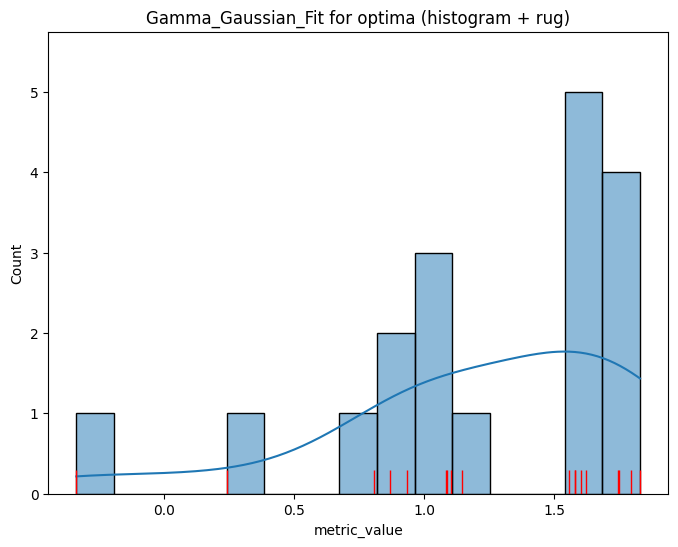

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
chrysargyrea,1.6417,0.3437,1.7651,0.6345,2.1451,55,0.3951,0.2094
optima,1.2206,0.5815,1.3489,-0.3382,1.8288,18,0.6442,0.4764


In [23]:
get_aggregated_data(Gamma_Gaussian_Fit,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

PLOTTING


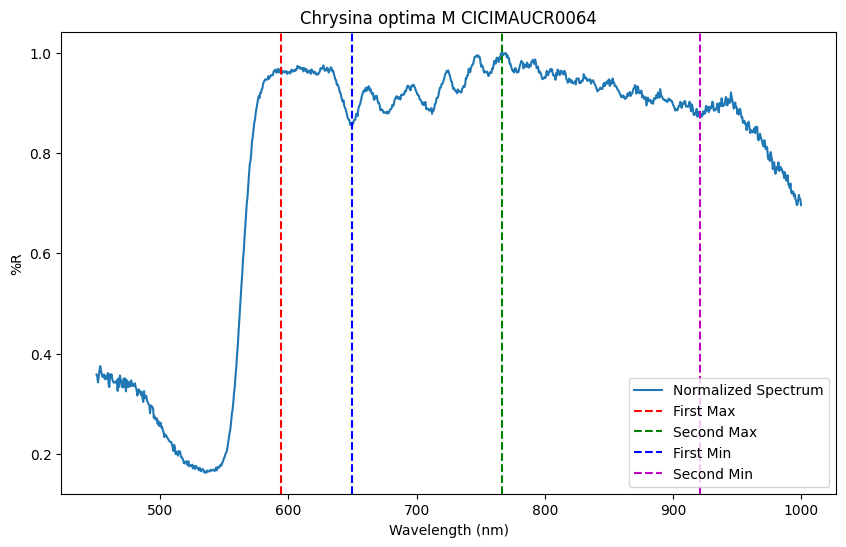

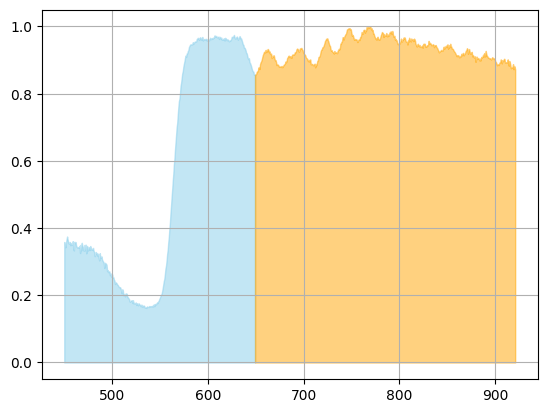

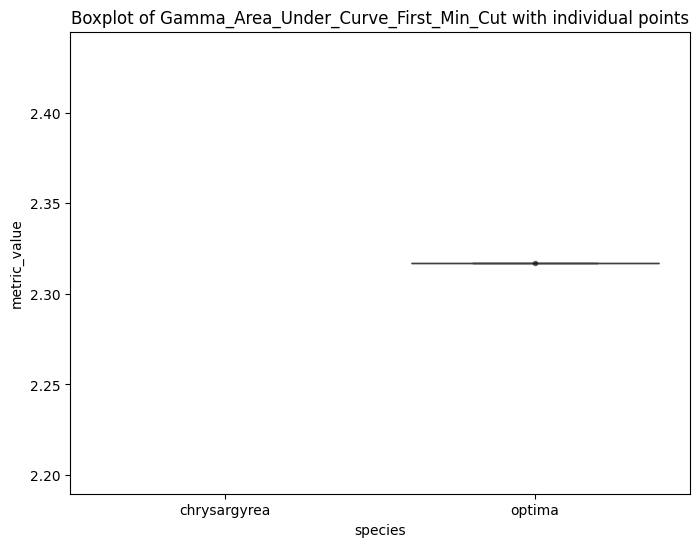

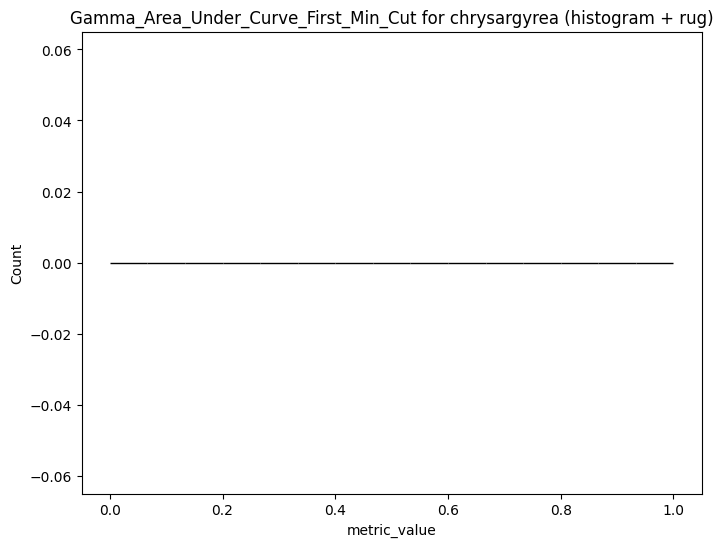

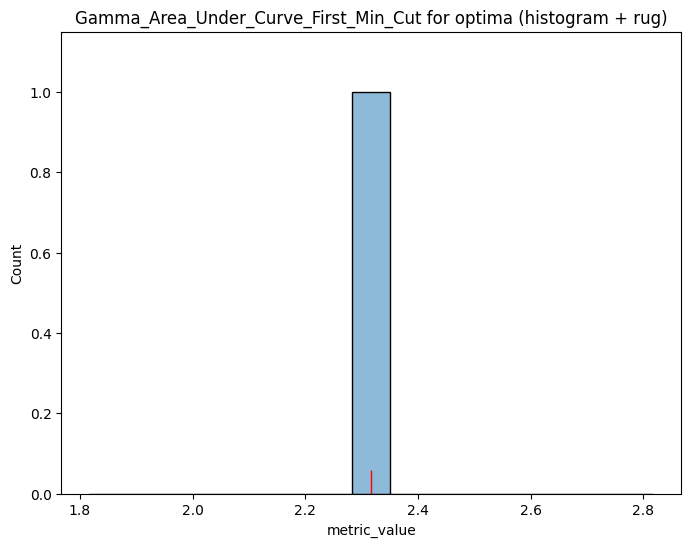

,mean,std,median,min,max,count,iqr,cv
species,,,,,,,,
chrysargyrea,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN
optima,2.3172,NaN,2.3172,2.3172,2.3172,1,NaN,NaN


In [24]:
get_aggregated_data(Gamma_Area_Under_Curve_First_Min_Cut,
                    config_file = metric_configuration_file, 
                    spectra =  train_spectra, 
                    collection_list = training_collection_list,
                    plot = True)

## Boxplots

C:\Users\esteb\escarabajos\libraries\metrics.py:980: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


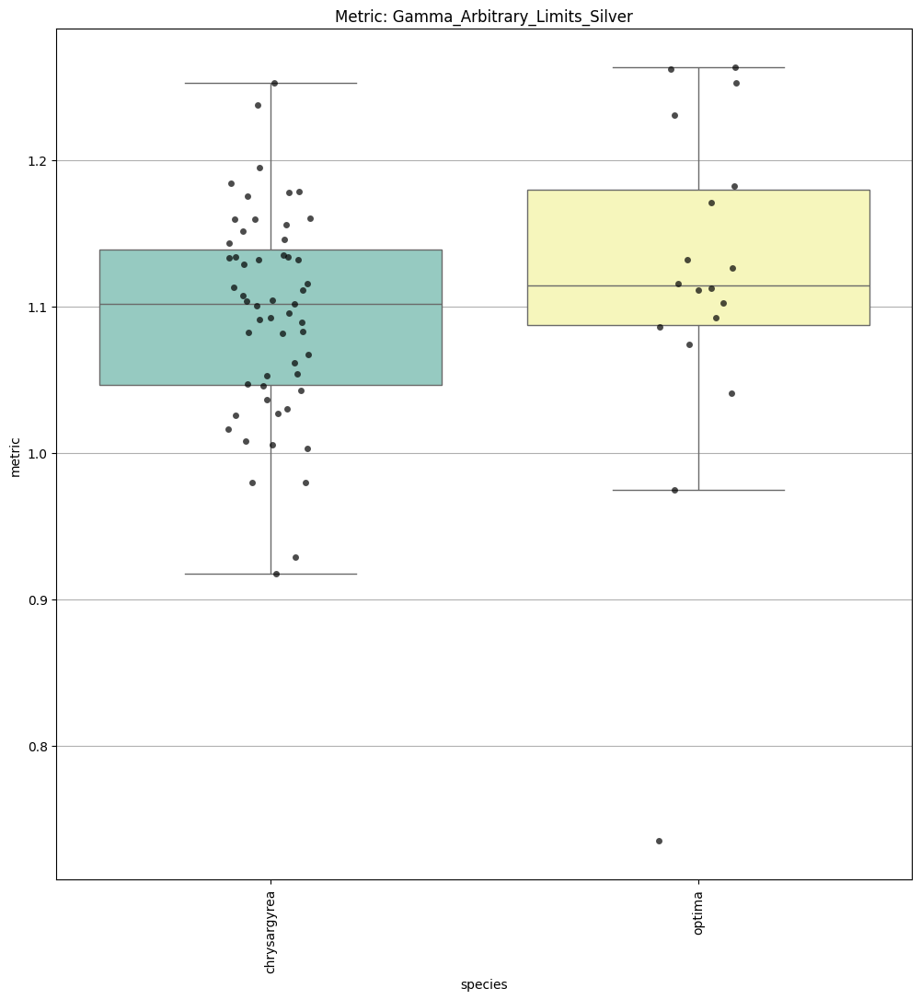

In [25]:
Metric_Testbench(Gamma_Arbitrary_Limits_Silver, spectra = train_spectra, config_file = metric_configuration_file, collection_list = training_collection_list)

C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR\CICIMAUCR0016 MAX_7314920SP.TXT — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR\CICIMAUCR0016_7314920SP.TXT — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR\CICIMAUCR0034 MAX_7314920SP.TXT — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\CO

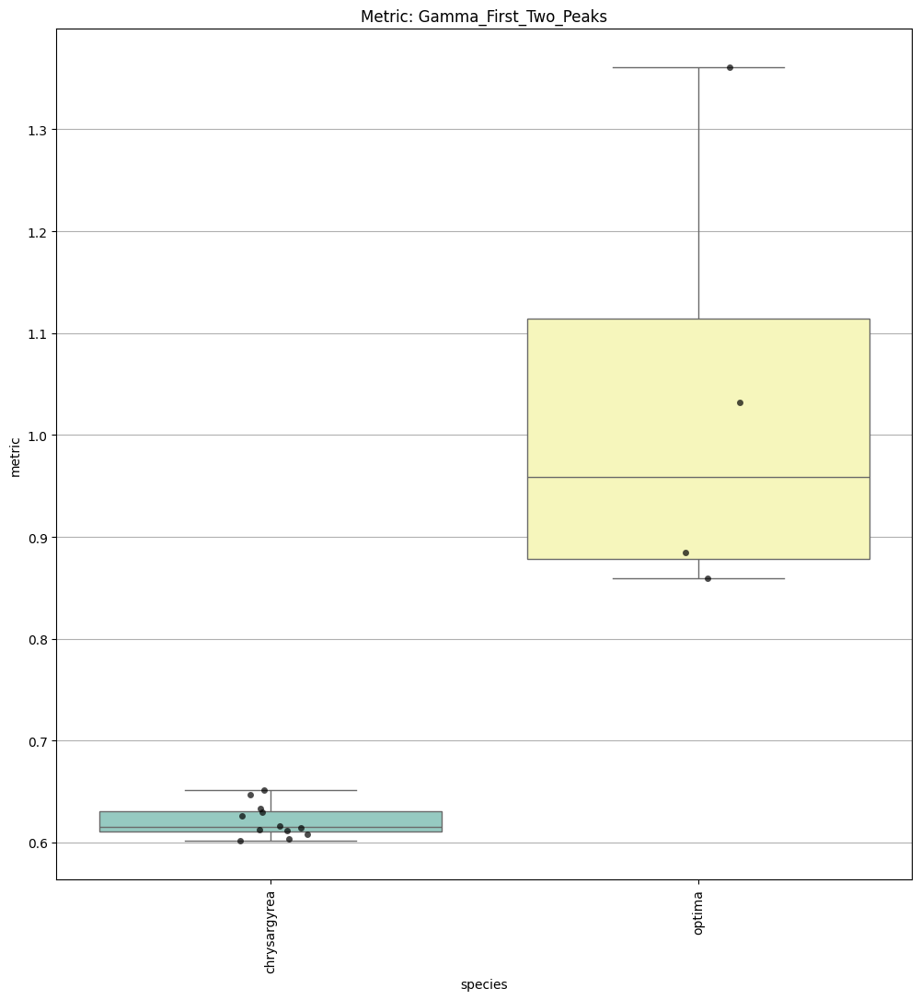

In [26]:
Metric_Testbench(Gamma_First_Two_Peaks, spectra = train_spectra, config_file = metric_configuration_file, collection_list = training_collection_list)

C:\Users\esteb\escarabajos\libraries\metrics.py:980: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


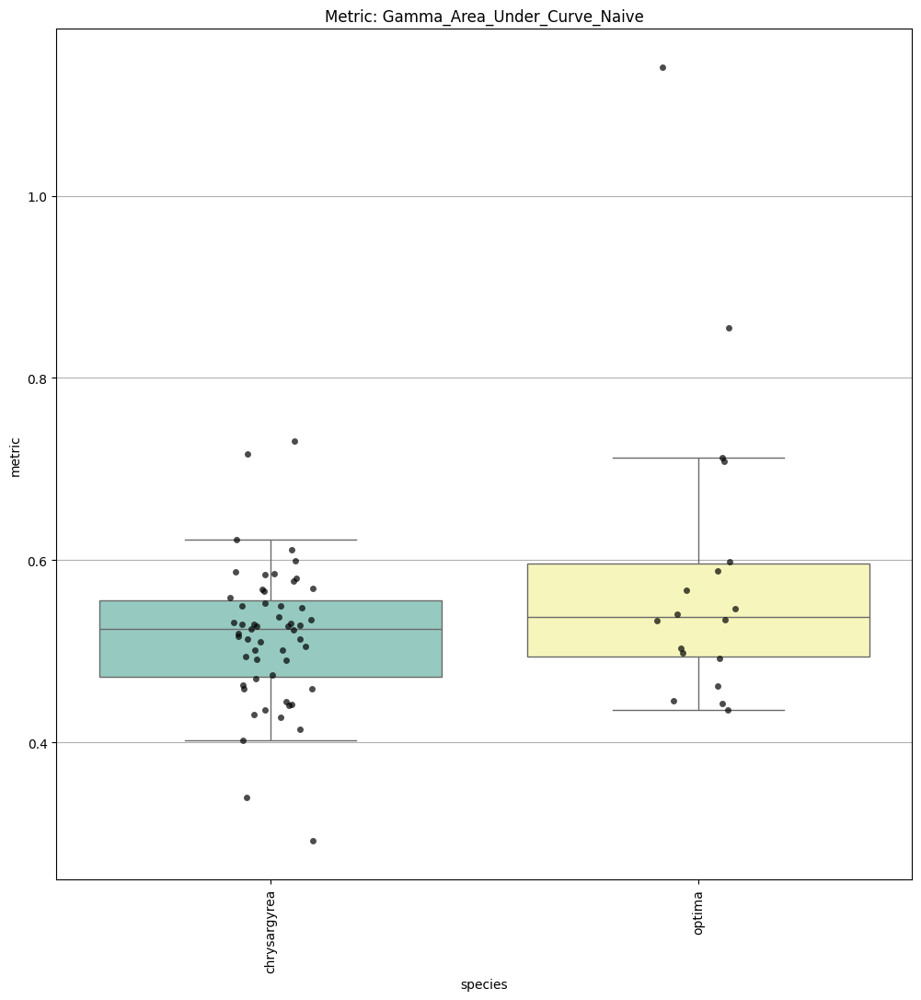

In [27]:
Metric_Testbench(Gamma_Area_Under_Curve_Naive, spectra = train_spectra, config_file = metric_configuration_file, collection_list = training_collection_list)

C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR\CICIMAUCR0016 MAX_7314920SP.TXT — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR\CICIMAUCR0016_7314920SP.TXT — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\COMPLETOS\20250829\CICIMAUCR\CICIMAUCR0017 MAX_7314920SP.TXT — metric value is NaN.
  warnings.warn(f"Skipping {spectrum.get_filename()} — metric value is NaN.")
C:\Users\esteb\escarabajos\libraries\metrics.py:947: UserWarning: Skipping C:\Users\esteb\escarabajos\avalight_spectrometer_data\CO

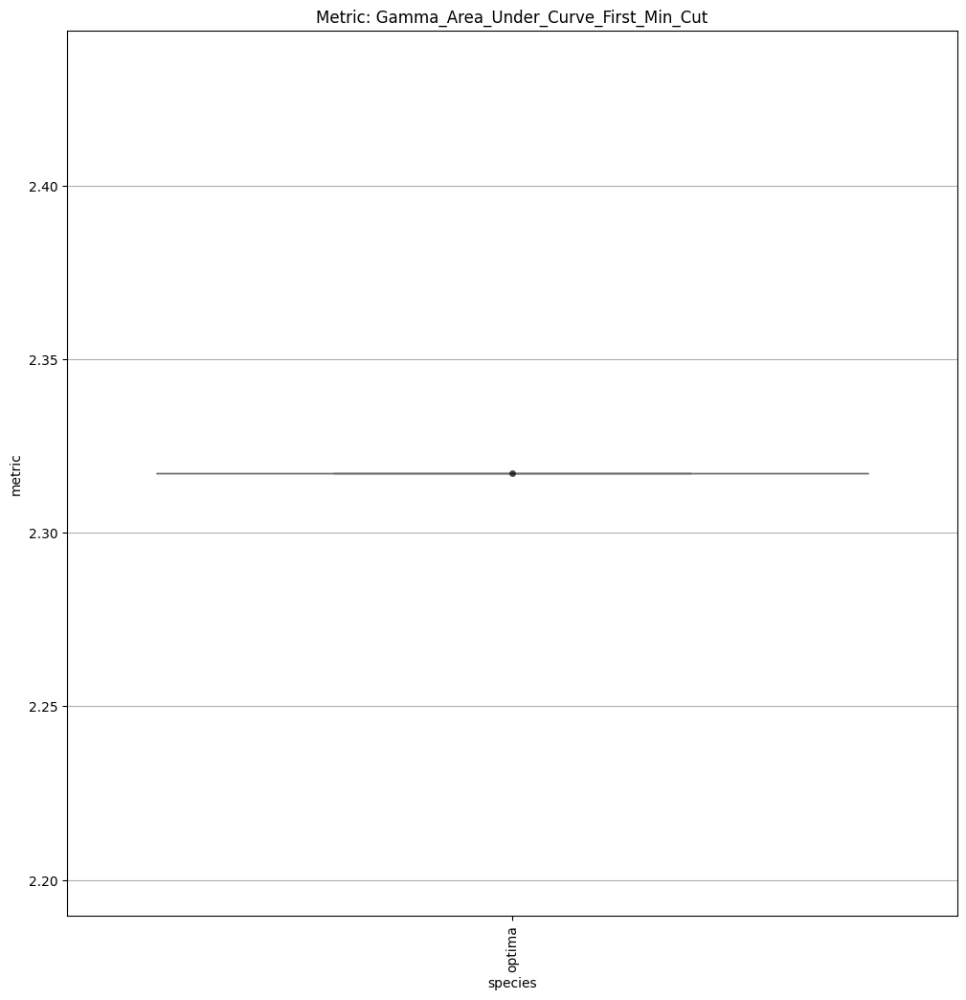

In [28]:
Metric_Testbench(Gamma_Area_Under_Curve_First_Min_Cut, 
                 spectra = train_spectra, 
                 config_file = metric_configuration_file, 
                 collection_list = training_collection_list)

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0035 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0036 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0094 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0117 (Chrysin

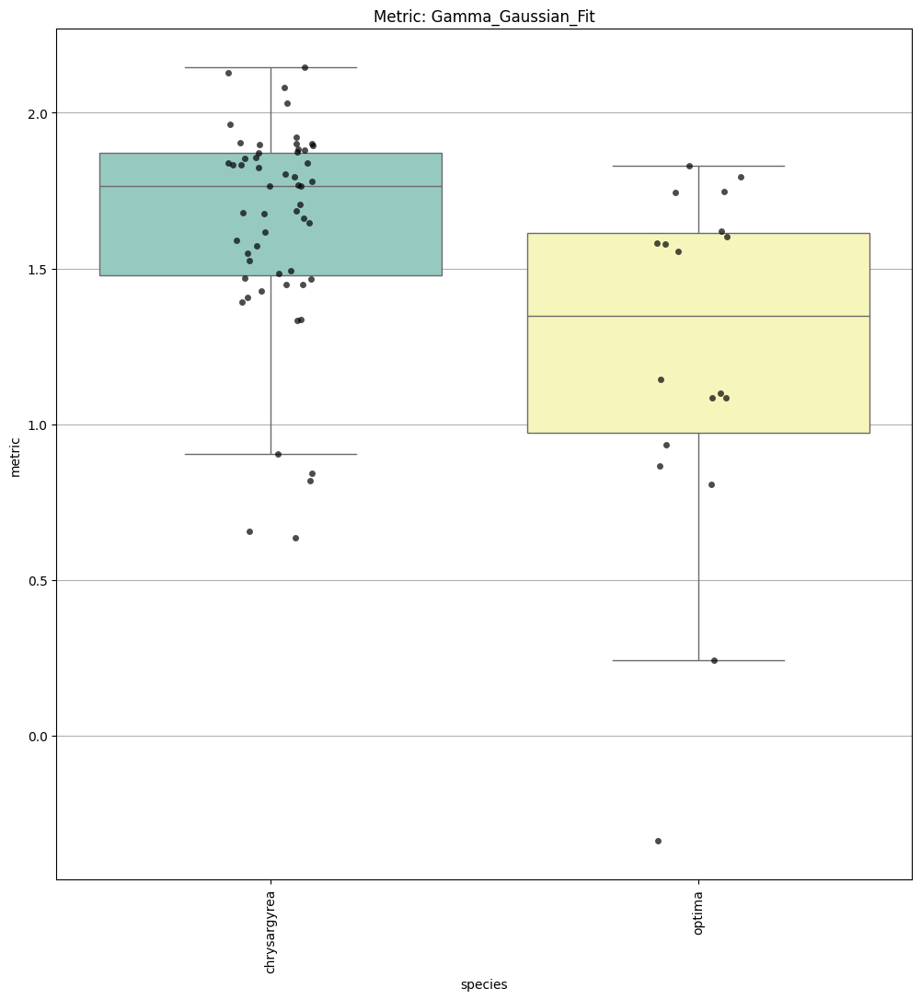

In [29]:
Metric_Testbench(Gamma_Gaussian_Fit, spectra = train_spectra, config_file = metric_configuration_file, collection_list = training_collection_list)

## Metric consolidation
### For each metric, saves the result on a single dataset, and liberates space. 
These metrics will be used one by one to train the neural network. This method will mark them as fit or unfit to be used in neural network training


📂 Using DB at C:\Users\esteb\escarabajos\gamma factor calculation and neural network training\metrics.sqlite
results {'metric': 'Gamma_First_Two_Peaks', 'train': [('CICIMAUCR0016', nan, 'chrysargyrea'), ('CICIMAUCR0016', nan, 'chrysargyrea'), ('CICIMAUCR0017', np.float64(0.6130197998740472), 'chrysargyrea'), ('CICIMAUCR0017', np.float64(0.61420894288518), 'chrysargyrea'), ('CICIMAUCR0034', nan, 'optima'), ('CICIMAUCR0034', nan, 'optima'), ('CICIMAUCR0035', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0064', np.float64(1.0322036351756128), 'optima'), ('CICIMAUCR0068', np.float64(0.8846805330013068), 'optima'), ('CICIMAUCR0076', nan, 'optima'), ('CICIMAUCR0076', nan, 'optima'), ('CICIMAUCR0080', np.float64(0.8593671517116087), 'optima'), ('CICIMAUCR0082', np.float64(1.3606244612231535), 'optima'), ('CICIMAUCR0093', nan, 'optima'), ('CICIMAUCR0093', nan, 'optima'), ('CICIMAUCR0094', nan, 'optima'), ('CICIM

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0016 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


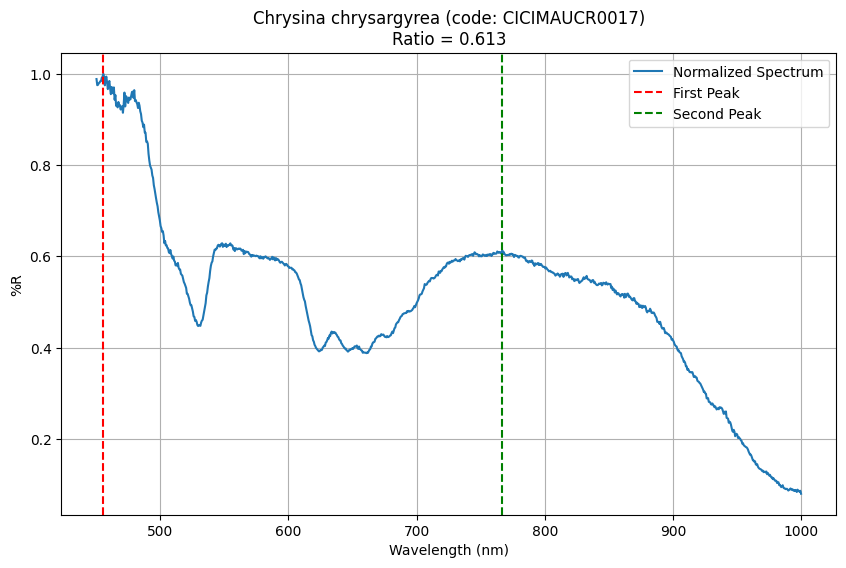

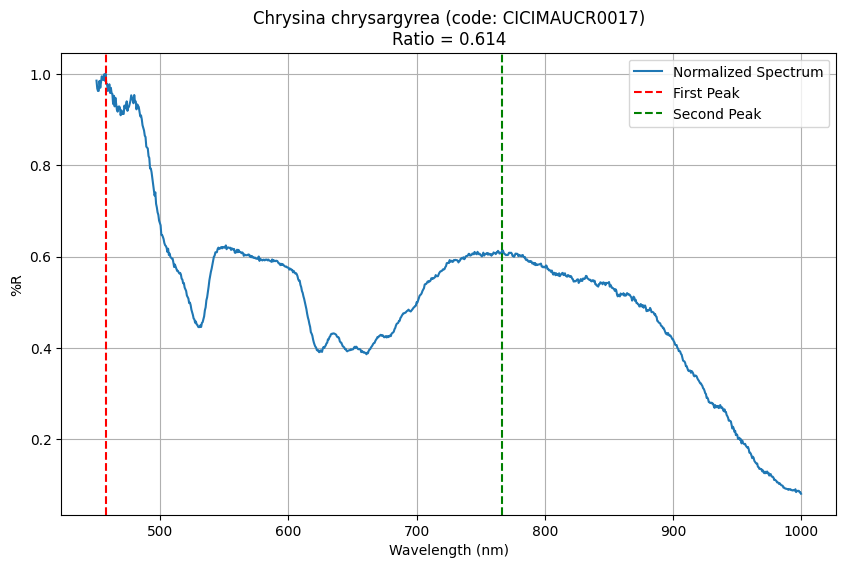

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0034 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0035 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0036 (Chrysina optima) — returning NaN.
  warnings.warn(


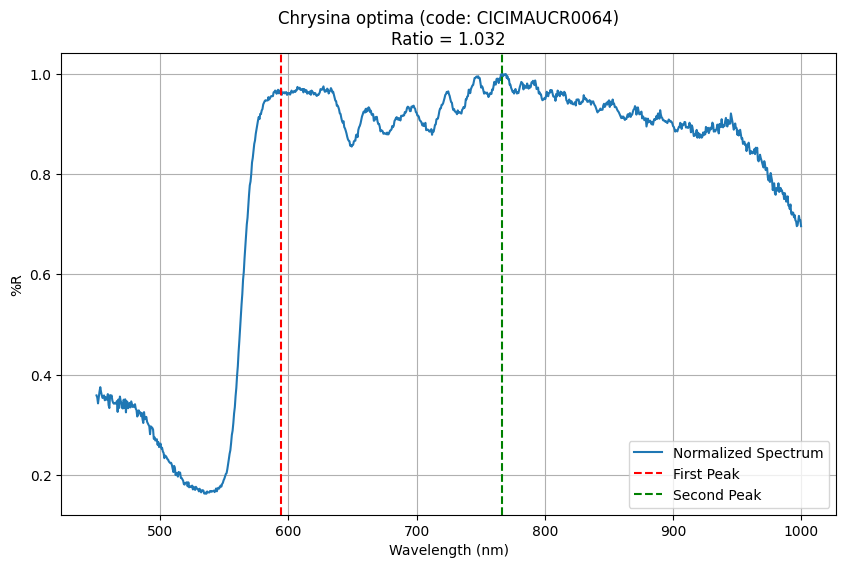

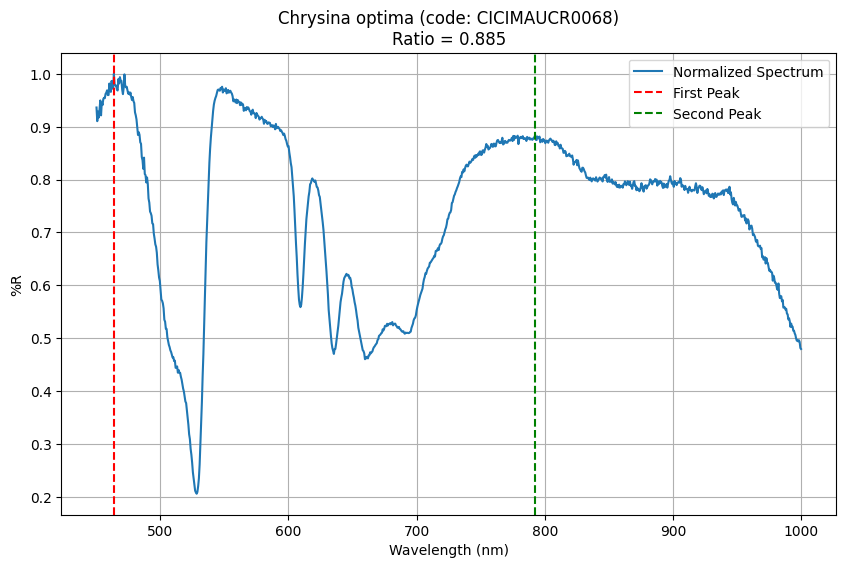

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0076 (Chrysina optima) — returning NaN.
  warnings.warn(


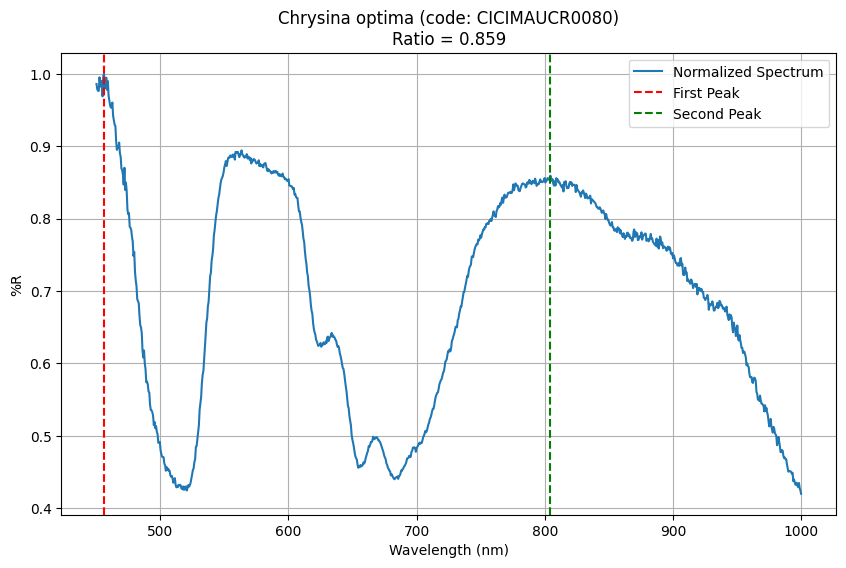

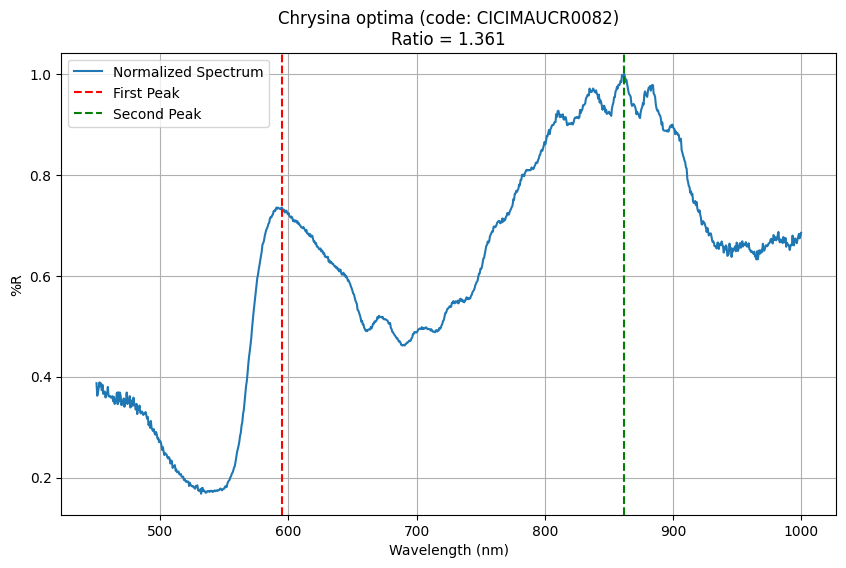

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0093 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0094 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0096 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0102 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0103 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\l

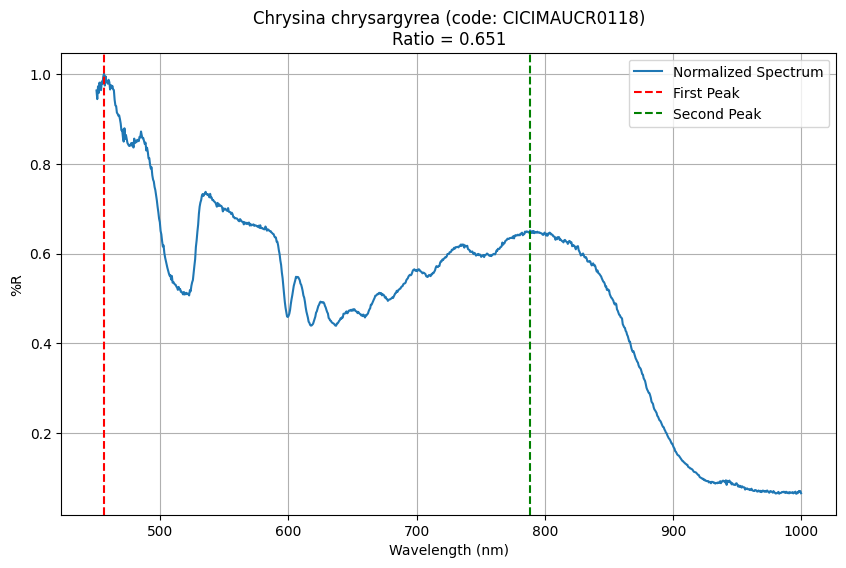

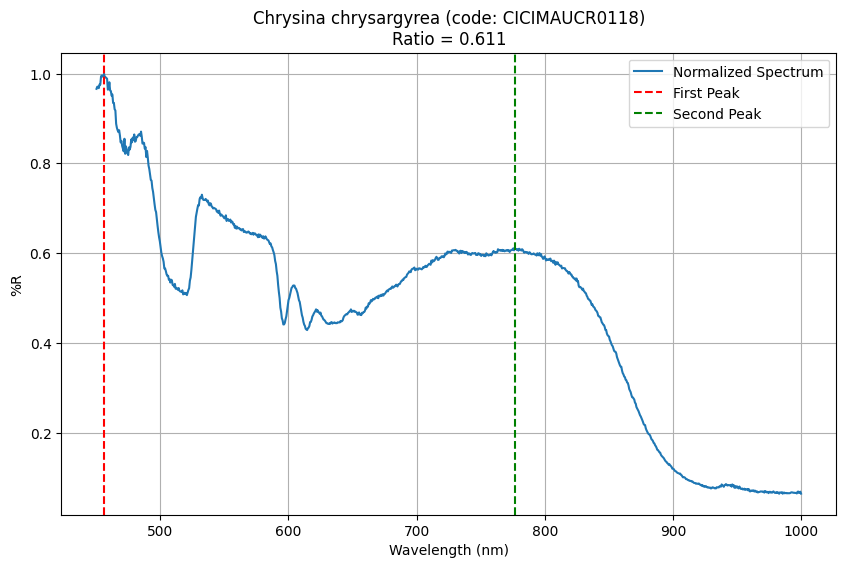

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0119 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


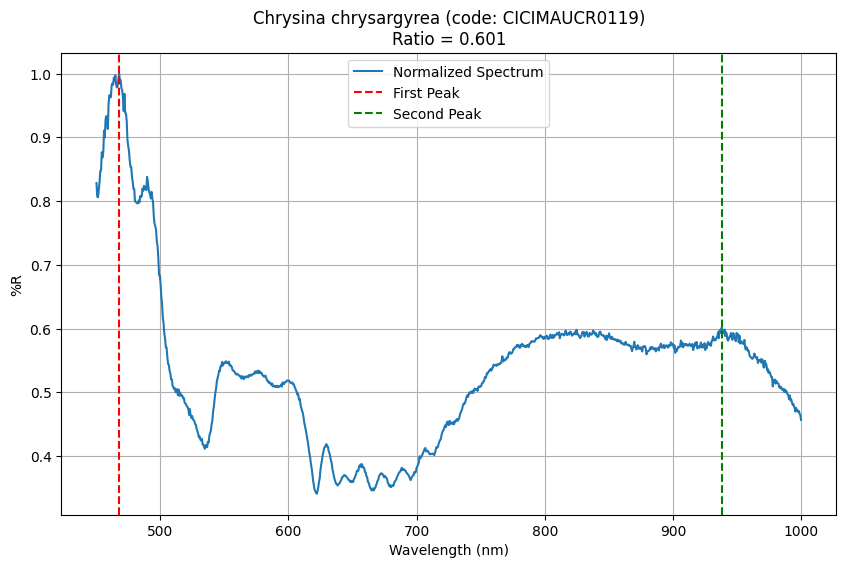

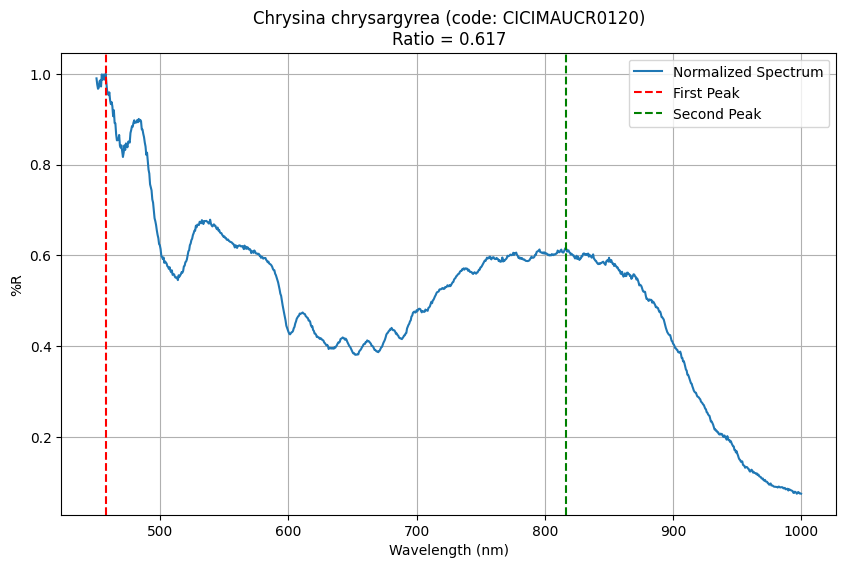

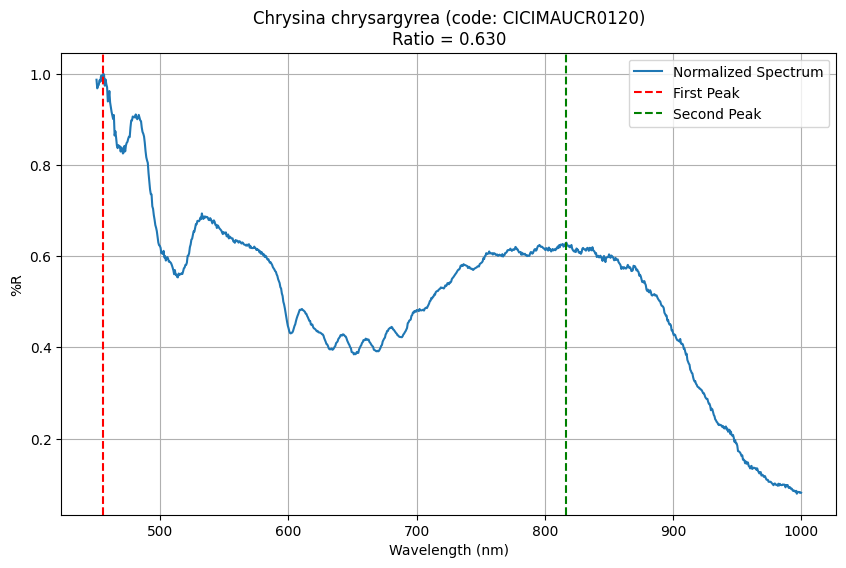

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0121 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0122 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0123 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


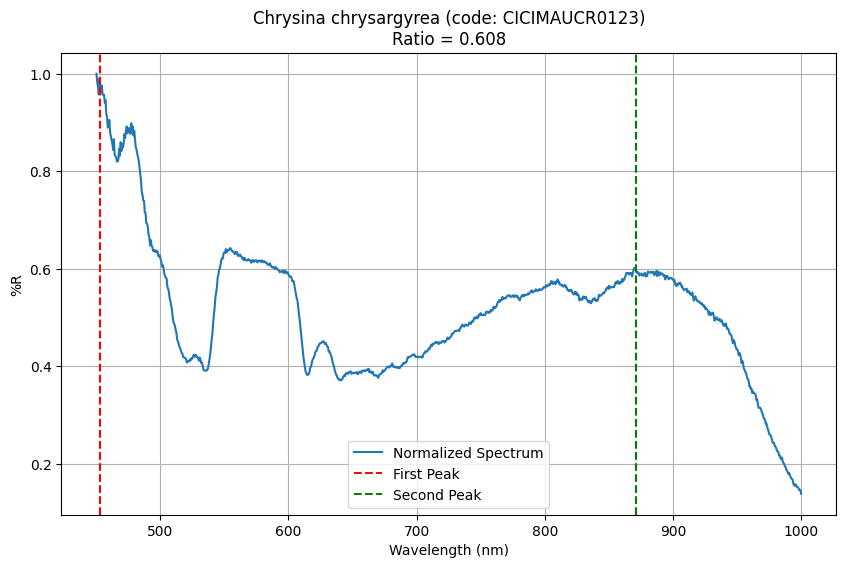

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0124 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


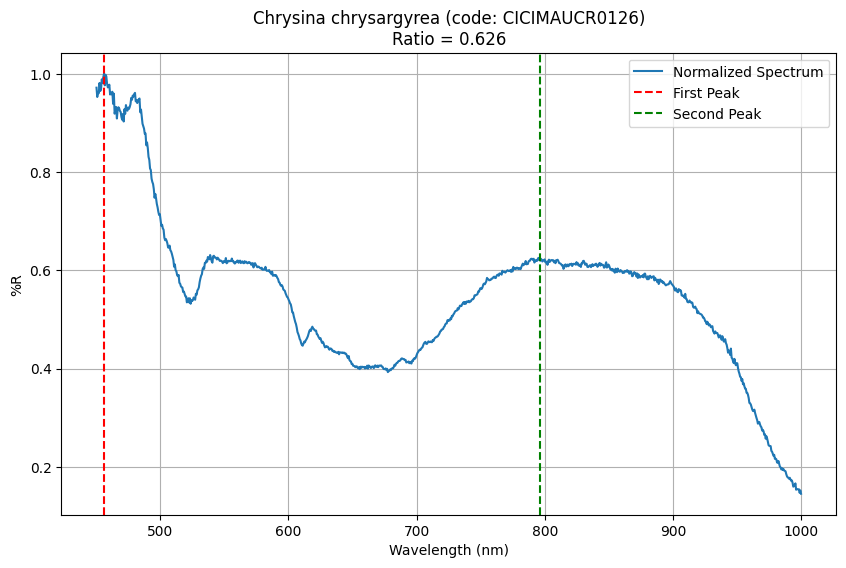

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0127 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


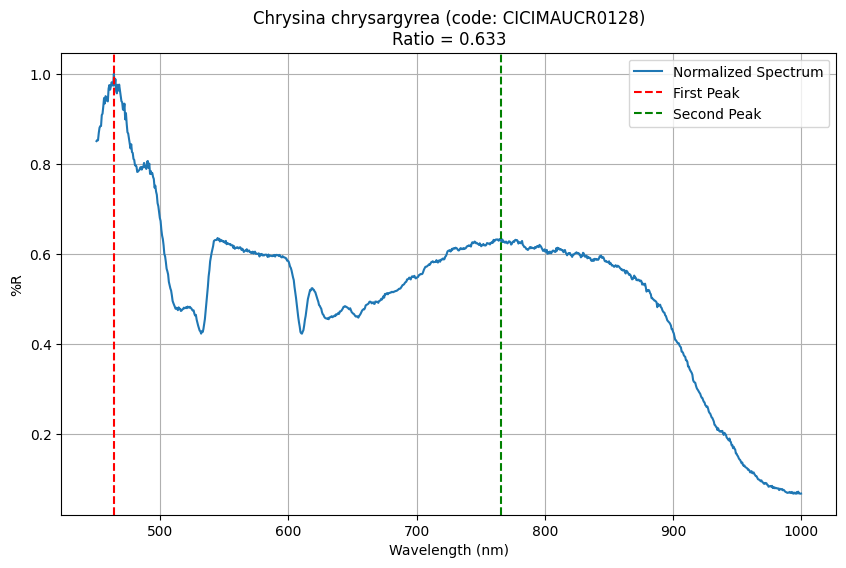

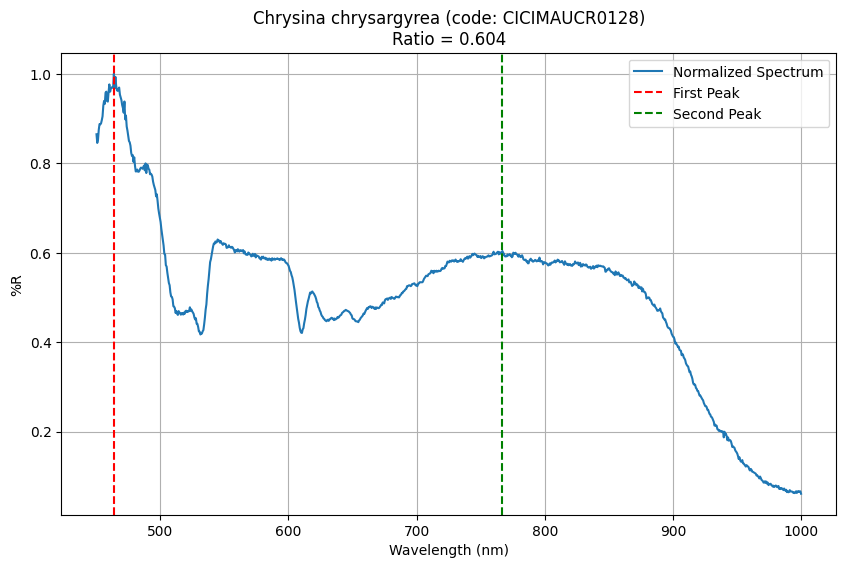

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0129 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0131 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0132 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0134 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0136 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\e

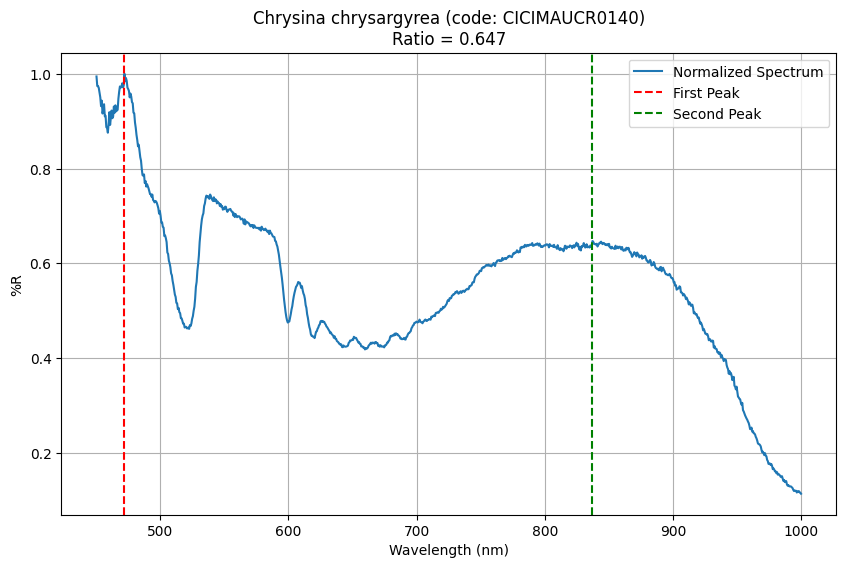

C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0144 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0146 (Chrysina optima) — returning NaN.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:170: UserWarning: Gamma_First_Two_Peaks_Simple: Less than two peaks found for CICIMAUCR0156 (Chrysina chrysargyrea) — returning NaN.
  warnings.warn(


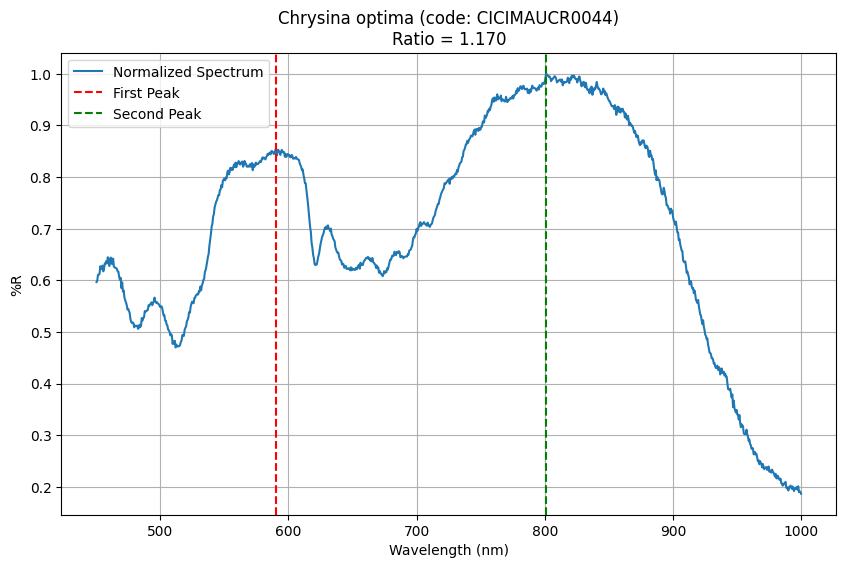

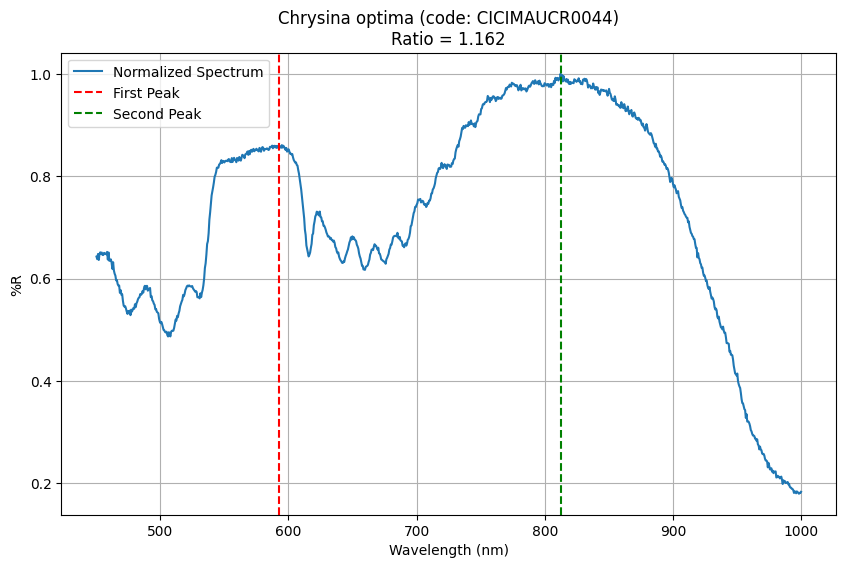

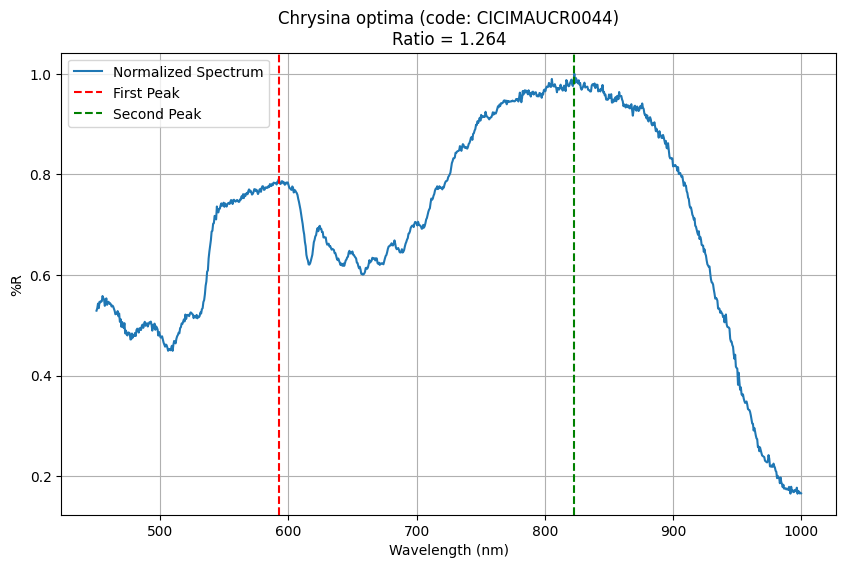

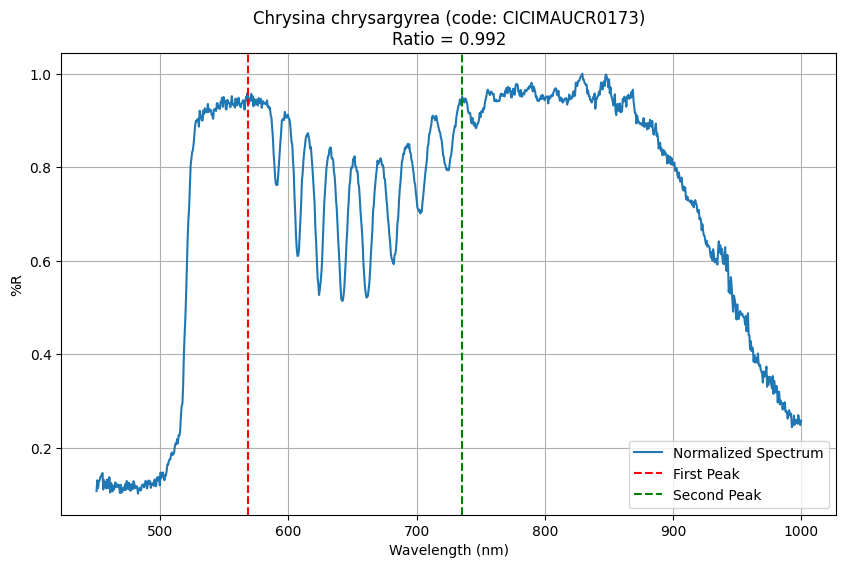

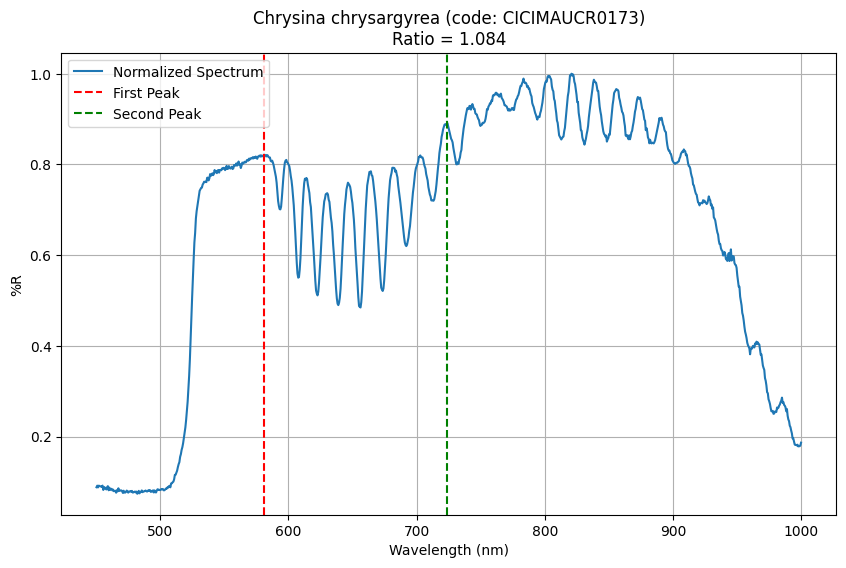

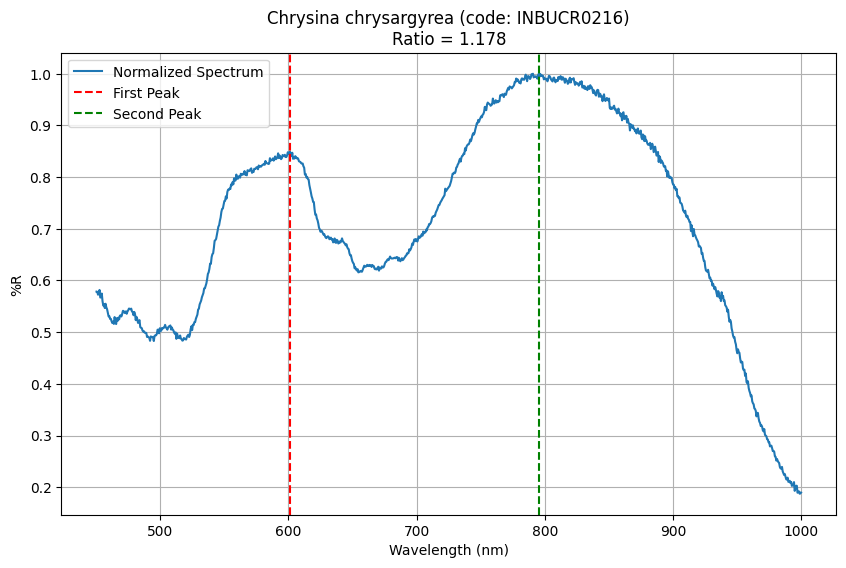

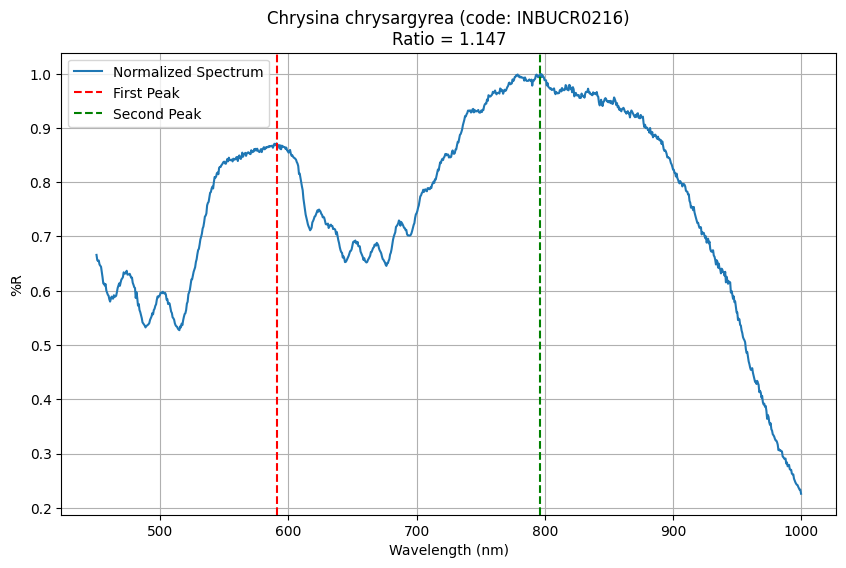

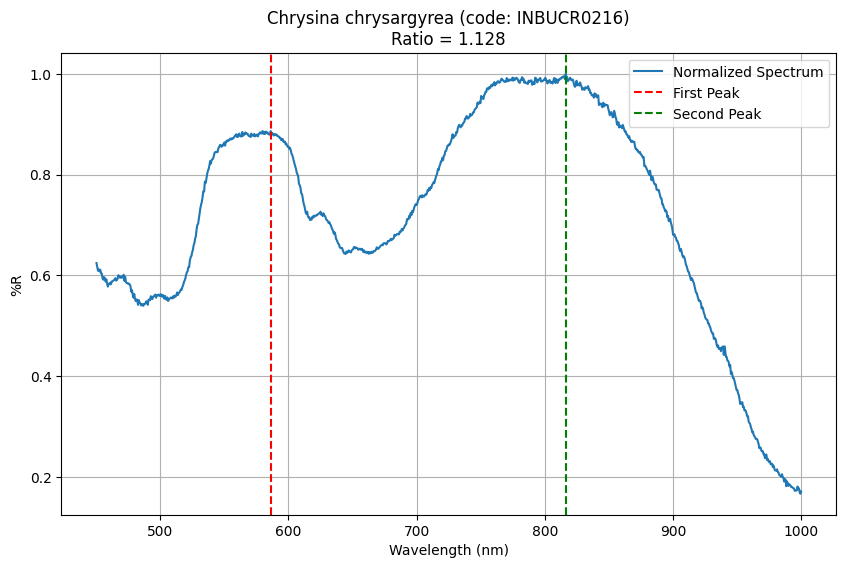

results {'metric': 'Gamma_First_Two_Peaks_Simple', 'train': [('CICIMAUCR0016', nan, 'chrysargyrea'), ('CICIMAUCR0016', nan, 'chrysargyrea'), ('CICIMAUCR0017', np.float64(0.6130197998740472), 'chrysargyrea'), ('CICIMAUCR0017', np.float64(0.61420894288518), 'chrysargyrea'), ('CICIMAUCR0034', nan, 'optima'), ('CICIMAUCR0034', nan, 'optima'), ('CICIMAUCR0035', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0064', np.float64(1.0322036351756128), 'optima'), ('CICIMAUCR0068', np.float64(0.8846805330013068), 'optima'), ('CICIMAUCR0076', nan, 'optima'), ('CICIMAUCR0076', nan, 'optima'), ('CICIMAUCR0080', np.float64(0.8593671517116087), 'optima'), ('CICIMAUCR0082', np.float64(1.3606244612231535), 'optima'), ('CICIMAUCR0093', nan, 'optima'), ('CICIMAUCR0093', nan, 'optima'), ('CICIMAUCR0094', nan, 'optima'), ('CICIMAUCR0096', nan, 'optima'), ('CICIMAUCR0102', nan, 'chrysargyrea'), ('CICIMAUCR0102', nan, 'chrysargyre

C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0035 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0036 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0094 (Chrysina optima): Optimal parameters not found: Number of calls to function has reached maxfev = 10000.. Falling back to quadratic approximation.
  warnings.warn(
C:\Users\esteb\escarabajos\libraries\metrics.py:503: UserWarning: Gaussian fit failed in range 475.0-625.0 for CICIMAUCR0117 (Chrysin

results {'metric': 'Gamma_Gaussian_Fit', 'train': [('CICIMAUCR0016', np.float64(1.8714379476634688), 'chrysargyrea'), ('CICIMAUCR0016', np.float64(1.9003273451192737), 'chrysargyrea'), ('CICIMAUCR0017', np.float64(1.5892298063914938), 'chrysargyrea'), ('CICIMAUCR0017', np.float64(1.5723048188257154), 'chrysargyrea'), ('CICIMAUCR0034', np.float64(1.8287513428394535), 'optima'), ('CICIMAUCR0034', np.float64(1.7936071395317368), 'optima'), ('CICIMAUCR0035', np.float64(0.9334176265158254), 'optima'), ('CICIMAUCR0036', np.float64(-0.3382365083791065), 'optima'), ('CICIMAUCR0036', np.float64(0.2414018175131511), 'optima'), ('CICIMAUCR0036', np.float64(1.554485829024187), 'optima'), ('CICIMAUCR0064', np.float64(1.0852939756921745), 'optima'), ('CICIMAUCR0068', np.float64(1.143357805346955), 'optima'), ('CICIMAUCR0076', np.float64(1.7462915240338468), 'optima'), ('CICIMAUCR0076', np.float64(1.7449754989059467), 'optima'), ('CICIMAUCR0080', np.float64(1.083608441637583), 'optima'), ('CICIMAUCR0

In [30]:
from metric_database import MetricDatabase
import os
import pprint

# Initialize database
db_path = os.path.abspath("metrics.sqlite")
db = MetricDatabase(db_path=db_path)
print(f"📂 Using DB at {db_path}")

# List of metrics to test
metrics_to_run = (
    Gamma_First_Two_Peaks,
    Gamma_First_Two_Peaks_Simple,
    Gamma_Arbitrary_Limits_Silver, 
    Gamma_Area_Under_Curve_Naive,
    Gamma_Area_Under_Curve_First_Min_Cut,
    Gamma_Vector_Relative_Reflectance,
    Wavelength_Vector,
    Critical_Points,
    Gamma_Gaussian_Fit
)

# Run metrics
report, nn_training_bundle = db.add_multiple_metrics(
    metrics_to_run,
    config_file=metric_configuration_file,
    train_spectra=train_spectra,
    test_spectra=test_spectra,
    collection_list=training_collection_list
)

# Pretty print summary
pprint.pprint(report)

print("\n✅ All metrics processed and results saved in the database.")


In [31]:
print(nn_training_bundle)

{'Gamma_First_Two_Peaks': {'metric_name': 'Gamma_First_Two_Peaks', 'metric': 'Gamma_First_Two_Peaks', 'train': [('CICIMAUCR0016', nan, 'chrysargyrea'), ('CICIMAUCR0016', nan, 'chrysargyrea'), ('CICIMAUCR0017', np.float64(0.6130197998740472), 'chrysargyrea'), ('CICIMAUCR0017', np.float64(0.61420894288518), 'chrysargyrea'), ('CICIMAUCR0034', nan, 'optima'), ('CICIMAUCR0034', nan, 'optima'), ('CICIMAUCR0035', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0036', nan, 'optima'), ('CICIMAUCR0064', np.float64(1.0322036351756128), 'optima'), ('CICIMAUCR0068', np.float64(0.8846805330013068), 'optima'), ('CICIMAUCR0076', nan, 'optima'), ('CICIMAUCR0076', nan, 'optima'), ('CICIMAUCR0080', np.float64(0.8593671517116087), 'optima'), ('CICIMAUCR0082', np.float64(1.3606244612231535), 'optima'), ('CICIMAUCR0093', nan, 'optima'), ('CICIMAUCR0093', nan, 'optima'), ('CICIMAUCR0094', nan, 'optima'), ('CICIMAUCR0096', nan, 'optima'), ('CICIMAUCR0102', nan, '

In [32]:
import os
import datetime
import pprint
import numpy as np
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle
from reportlab.lib.pagesizes import letter
from reportlab.lib.styles import getSampleStyleSheet
from reportlab.lib import colors

# Helper function to convert complex objects to strings
def to_string(obj):
    if isinstance(obj, (np.ndarray, list)):
        return str(obj)
    elif isinstance(obj, (np.int64, np.float64)):
        return str(obj)
    elif isinstance(obj, dict):
        return "\n".join([f"{k}: {to_string(v)}" for k, v in obj.items()])
    elif isinstance(obj, (tuple, list)):
        return str([to_string(item) for item in obj])
    return str(obj)

# Pretty print to console
pprint.pprint(nn_training_bundle)

# Ensure report directory
report_dir = report_location
os.makedirs(report_dir, exist_ok=True)

# File name with today's date
today_str = datetime.date.today().strftime("%Y-%m-%d")
report_filename = f"silvery_beetle_classification_neural_network_{today_str}.pdf"
report_path = os.path.join(report_dir, report_filename)

styles = getSampleStyleSheet()
doc = SimpleDocTemplate(report_path, pagesize=letter)
story = [Paragraph("Silvery Beetle Classification Neural Network Report", styles['Title']),
         Spacer(1, 12)]

# Loop over all metrics
for metric, details in nn_training_bundle.items():
    story.append(Paragraph(f"<b>{metric}</b>", styles['Heading2']))
    story.append(Paragraph(to_string(details), styles['Code']))
    story.append(Spacer(1, 12))

    # Aggregated Data
    if "aggregated" in details and details["aggregated"]:
        story.append(Paragraph("Aggregated Data:", styles['Heading3']))
        table_data = [["Metric", "chrysargyrea", "optima"]]
        for key, values in details["aggregated"].items():
            row = [key, to_string(values.get("chrysargyrea", "N/A")), to_string(values.get("optima", "N/A"))]
            table_data.append(row)
        table = Table(table_data)
        table.setStyle(TableStyle([
            ("BACKGROUND", (0, 0), (-1, 0), colors.grey),
            ("TEXTCOLOR", (0, 0), (-1, 0), colors.whitesmoke),
            ("ALIGN", (0, 0), (-1, -1), "CENTER"),
            ("GRID", (0, 0), (-1, -1), 0.5, colors.black)
        ]))
        story.append(table)
        story.append(Spacer(1, 12))

    # Train/Test datapoints summary
    train_count = len(details.get("train", []))
    test_count = len(details.get("test", []))
    if train_count > 0 or test_count > 0:
        story.append(Paragraph("Datapoints Summary:", styles['Heading3']))
        summary = {"train": train_count, "test": test_count}
        story.append(Paragraph(to_string(summary), styles['Code']))
        story.append(Spacer(1, 12))

    # Recommendation
    if "recommendation" in details and details["recommendation"]:
        story.append(Paragraph("Recommendation:", styles['Heading3']))
        story.append(Paragraph(to_string(details["recommendation"]), styles['Code']))
        story.append(Spacer(1, 12))

# Build PDF
doc.build(story)
print(f"\n✅ Report saved at: {os.path.abspath(report_path)}")

{'Critical_Points': {'aggregated': {},
                     'metric': 'Critical_Points',
                     'metric_name': 'Critical_Points',
                     'recommendation': {'class_distribution': {},
                                        'fit_for_training': False,
                                        'n_classes': 0,
                                        'n_invalid_metrics': np.int64(73),
                                        'n_samples': np.int64(0),
                                        'reason': ['Found 73 invalid (NaN or '
                                                   'infinite) metric values',
                                                   'Too few valid samples (0 < '
                                                   '30)',
                                                   'Too few classes (0 < 2)']},
                     'test': [('CICIMAUCR0044',
                               array([[673.57   , 590.24   , 801.02   ],
       [ 13.81237,  19.41638,

## 

## Neural network training

### One variable approach

#### In this section, for every metric which is fit for training, we separate train data into a train and validation subgroups 
Then, we feed them into a neural network, and train it. Finally, we test the neural network with the test data and finally we return a dataframe
with the stats for each NN, true positives/negatives, false positives/negatives. 

In [64]:
import traceback
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import random

# Ensure Matplotlib backend for JupyterLab to prevent black cells
%matplotlib inline


import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder

def fit_label_encoder(df, label_col="species"):
    """Fit LabelEncoder on the whole dataset."""
    encoder = LabelEncoder()
    encoder.fit(df[label_col])
    print("Global classes:", encoder.classes_)
    return encoder

def get_x_y(df, encoder):
    """Extract features and labels from DataFrame using a pre-fitted encoder."""
    print("=== get_x_y called ===")
    print("DataFrame shape:", df.shape)
    print("Columns:", list(df.columns))

    x_column_name_lst = [x for x in df.columns if x not in ["code", "species"]]
    if not x_column_name_lst:
        raise ValueError("No feature columns found")
    x_column_name = x_column_name_lst[0]
    print("Selected feature column:", x_column_name)

    # Features
    x = pd.to_numeric(df[x_column_name], errors="coerce").values.astype(np.float32)
    print("First 10 feature values:", x[:10])

    # Labels
    y = encoder.transform(df["species"].values)
    print("First 10 labels (encoded):", y[:10])

    return x, y


def permute_lists(list1, list2):
    """Permute two lists with the same random order."""
    random.seed(42)  # For reproducibility
    permutation_index = list(range(len(list1)))
    random.shuffle(permutation_index)
    permuted_list1 = [list1[i] for i in permutation_index]
    permuted_list2 = [list2[i] for i in permutation_index]
    return permuted_list1, permuted_list2

def partition_lists(list1, list2, train_frac=0.7, val_frac=0.2):
    """Partition two lists into train, validation, and test sets."""
    if train_frac + val_frac >= 1:
        raise ValueError("Sum of train_frac and val_frac must be less than 1")
    if train_frac < 0 or val_frac < 0:
        raise ValueError("Fractions must be positive")
    
    n_total = len(list1)
    n_train = int(n_total * train_frac)
    n_val = int(n_total * val_frac)
    
    train_list1 = list1[:n_train]
    train_list2 = list2[:n_train]
    val_list1 = list1[n_train:n_train + n_val]
    val_list2 = list2[n_train:n_train + n_val]
    test_list1 = list1[n_train + n_val:]
    test_list2 = list2[n_train + n_val:]
    
    return (train_list1, train_list2, val_list1, val_list2, test_list1, test_list2)

def create_model(my_learning_rate, x_train, y_train, hidden_units=[20, 20, 20], dropout_rate=0.2):
    """Create and compile a deep neural net."""
    if np.any(np.isnan(x_train)) or np.any(np.isinf(x_train)):
        raise ValueError("x_train contains NaN or infinite values")
    
    input_shape = (x_train.shape[1],) if len(x_train.shape) > 1 else (1,)
    num_classes = len(np.unique(y_train))
    if num_classes < 2:
        raise ValueError("y_train must contain at least 2 classes.")
    
    model = tf.keras.models.Sequential()
    if len(input_shape) > 1:
        model.add(tf.keras.layers.Flatten(input_shape=input_shape))
    else:
        model.add(tf.keras.layers.Input(shape=input_shape))
    
    for units in hidden_units:
        model.add(tf.keras.layers.Dense(units=units, activation="relu"))
    model.add(tf.keras.layers.Dropout(rate=dropout_rate))
    model.add(tf.keras.layers.Dense(units=num_classes, activation="softmax"))
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=my_learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )
    return model

def train_model(model, train_features, train_label, val_features, val_label, epochs, batch_size, encoder=None):
    """Train the model with validation data."""
    if isinstance(train_features, pd.DataFrame):
        train_features = train_features.values
    if isinstance(train_label, (pd.Series, pd.DataFrame)):
        train_label = train_label.values.ravel()
    if isinstance(val_features, pd.DataFrame):
        val_features = val_features.values
    if isinstance(val_label, (pd.Series, pd.DataFrame)):
        val_label = val_label.values.ravel()
    
    if encoder is not None and train_label.dtype.kind in {"U", "S", "O"}:
        train_label = encoder.transform(train_label)
        val_label = encoder.transform(val_label)
    
    train_features = np.array(train_features, dtype=np.float32)
    train_label = np.array(train_label, dtype=np.int32)
    val_features = np.array(val_features, dtype=np.float32)
    val_label = np.array(val_label, dtype=np.int32)
    
    print(f"Training features shape: {train_features.shape}")
    print(f"Training labels shape: {train_label.shape}")
    print(f"Validation features shape: {val_features.shape}")
    print(f"Validation labels shape: {val_label.shape}")
    
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=10,
        restore_best_weights=True
    )
    
    history = model.fit(
        x=train_features,
        y=train_label,
        validation_data=(val_features, val_label),
        batch_size=batch_size,
        epochs=epochs,
        shuffle=True,
        verbose=1,
        callbacks=[early_stopping]
    )
    
    return history.epoch, pd.DataFrame(history.history)

from sklearn.metrics import classification_report, confusion_matrix

def evaluate_model_old(model, x_test, y_test, encoder, batch_size, labels=None):
    """Evaluate model and return metrics dictionary.
    
    Patches: tolerant of missing labels in y_test.
    """
    # Predict
    y_pred = model.predict(x_test, batch_size=batch_size)
    y_pred = np.argmax(y_pred, axis=1)

    # Always use the full label set from encoder
    all_labels = list(range(len(encoder.classes_))) if labels is None else labels

    # But limit to only those labels actually present in y_test ∪ y_pred
    present_labels = np.unique(np.concatenate([y_test, y_pred]))
    safe_labels = [l for l in all_labels if l in present_labels]

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=safe_labels)

    # Classification report
    report = classification_report(
        y_test,
        y_pred,
        labels=safe_labels,
        target_names=[encoder.classes_[i] for i in safe_labels],
        output_dict=True,
        zero_division=0  # avoids NaN when a class has no predictions
    )

    # Extract metrics
    test_loss, test_accuracy = model.evaluate(x_test, y_test, batch_size=batch_size, verbose=0)

    # Pull out TP, TN, FP, FN if binary
    if cm.shape == (2, 2):
        tn, fp, fn, tp = cm.ravel()
    else:
        tn = fp = fn = tp = 0  # multi-class or single-class fallback

    return {
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "true_positives": int(tp),
        "true_negatives": int(tn),
        "false_positives": int(fp),
        "false_negatives": int(fn),
        "precision": report["weighted avg"]["precision"],
        "recall": report["weighted avg"]["recall"],
        "f1_score": report["weighted avg"]["f1-score"]
    }

import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_model(model, x_test, y_test, encoder, batch_size, labels=None):
    """Evaluate model and return metrics dictionary.
    
    Patches: tolerant of missing labels in y_test.
    Adds: 'proba_df' key with per-sample softmax probabilities.
    """
    # Predict (keep softmax for the proba table; top-1 for metrics)
    y_proba = model.predict(x_test, batch_size=batch_size)
    # If model is binary with sigmoid output, convert to 2-class proba
    if y_proba.ndim == 1:
        y_proba = np.vstack([1.0 - y_proba, y_proba]).T
    elif y_proba.shape[1] == 1:
        y_proba = np.hstack([1.0 - y_proba, y_proba])
    y_pred = np.argmax(y_proba, axis=1)

    # Always use the full label set from encoder
    all_labels = list(range(len(encoder.classes_))) if labels is None else labels

    # But limit to only those labels actually present in y_test ∪ y_pred
    present_labels = np.unique(np.concatenate([y_test, y_pred])) if len(y_test) else np.unique(y_pred)
    safe_labels = [l for l in all_labels if l in present_labels] or all_labels[:1]

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=safe_labels)

    # Classification report
    report = classification_report(
        y_test,
        y_pred,
        labels=safe_labels,
        target_names=[encoder.classes_[i] for i in safe_labels],
        output_dict=True,
        zero_division=0  # avoids NaN when a class has no predictions
    )

    # Extract metrics
    test_loss, test_accuracy = model.evaluate(x_test, y_test, batch_size=batch_size, verbose=0)

    # Pull out TP, TN, FP, FN if binary
    if cm.shape == (2, 2):
        tn, fp, fn, tp = cm.ravel()
    else:
        tn = fp = fn = tp = 0  # multi-class or single-class fallback

    # ---- NEW SECTION: build per-sample probability dataframe (softmax) ----
    class_names = list(encoder.classes_)
    proba_cols = [f"p({cls})" for cls in class_names]
    proba_df = pd.DataFrame(y_proba, columns=proba_cols)
    proba_df.insert(0, "true_label_id", y_test.astype(int))
    proba_df.insert(1, "true_label", encoder.inverse_transform(y_test))
    proba_df["pred_label_id"] = y_pred.astype(int)
    proba_df["pred_label"] = [class_names[i] for i in y_pred]
    proba_df["pred_confidence"] = y_proba[np.arange(len(y_proba)), y_pred]
    proba_df["correct"] = proba_df["true_label_id"] == proba_df["pred_label_id"]
    # ----------------------------------------------------------------------

    return {
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "true_positives": int(tp),
        "true_negatives": int(tn),
        "false_positives": int(fp),
        "false_negatives": int(fn),
        "precision": report["weighted avg"]["precision"],
        "recall": report["weighted avg"]["recall"],
        "f1_score": report["weighted avg"]["f1-score"],
        "proba_df": proba_df,  # <- added here without changing the signature
    }



def plot_curve(epochs, hist, list_of_metrics_to_plot):
    """Plot metrics vs epochs with safety checks."""
    if hist.empty or not epochs:
        print("⚠️ No valid history to plot")
        return
    plt.figure(figsize=(12, 6))
    for m in list_of_metrics_to_plot:
        if m in hist:
            plt.plot(epochs, hist[m], label=m)
        else:
            print(f"⚠️ Warning: metric '{m}' not in history")
    plt.xlabel("Epochs")
    plt.ylabel("Metric Value")
    plt.legend()
    plt.grid(True)
    plt.show()




In [78]:
debug = True
import numpy as np
import pandas as pd
import traceback
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

debug = True

def neural_network_training(nn_training_bundle):
    """Train a neural network for a single metric and return statistics."""
    metric = nn_training_bundle["metric_name"]
    train_data = nn_training_bundle["train"]
    test_data = nn_training_bundle["test"]
    recommendation = nn_training_bundle["recommendation"]

    # Early exit if dataset unsuitable
    if not recommendation["fit_for_training"]:
        print(f"❌ Dataset for {metric} unsuitable: {recommendation['reason']}")
        return pd.DataFrame({
            "metric": [metric],
            "fit_for_training": [False],
            "reason": [recommendation["reason"]]
        })

    # Convert train/test into DataFrames
    train_df = pd.DataFrame(train_data, columns=["code", "metric", "species"])
    test_df = pd.DataFrame(test_data, columns=["code", "metric", "species"])

    # Join train+test so encoder knows all possible labels
    full_df = pd.concat([train_df, test_df], ignore_index=True)

    try:
        if debug:
            print(f"{type(train_df)=}")
            print("train_df.info():")
            print(train_df.info())

        # Fit encoder globally
        encoder = LabelEncoder()
        encoder.fit(full_df["species"])
        print("Global classes:", encoder.classes_)

        # Transform train/test using same encoder
        x_train_full, y_train_full = get_x_y(train_df, encoder=encoder)
        x_test, y_test = get_x_y(test_df, encoder=encoder)

    except Exception as e:
        traceback.print_exc()
        print(f"❌ Failed to extract features/labels for {metric}: {e}")
        return pd.DataFrame({
            "metric": [metric],
            "fit_for_training": [False],
            "reason": [str(e)]
        })

    # Stratified train/val split
    try:
        x_train, x_val, y_train, y_val = train_test_split(
            x_train_full, y_train_full,
            test_size=0.2, stratify=y_train_full, random_state=42
        )

        x_train = np.array(x_train, dtype=np.float32)
        y_train = np.array(y_train, dtype=np.int32)
        x_val = np.array(x_val, dtype=np.float32)
        y_val = np.array(y_val, dtype=np.int32)

        if debug:
            print("Training features shape:", x_train.shape)
            print("Training labels shape:", y_train.shape)
            print("Validation features shape:", x_val.shape)
            print("Validation labels shape:", y_val.shape)
            print("Test features shape:", x_test.shape)
            print("Test labels shape:", y_test.shape)

    except Exception as e:
        print(f"❌ Failed to split data for {metric}: {e}")
        return pd.DataFrame({
            "metric": [metric],
            "fit_for_training": [False],
            "reason": [str(e)]
        })

    # Hyperparameters
    learning_rate = 0.008
    epochs = 200
    batch_size = 32
    list_of_metrics_to_plot = ["accuracy", "val_accuracy", "loss", "val_loss"]

    # Train model
    try:
        print(f"Training model for {metric}...")
        model = create_model(learning_rate, x_train, y_train)
        epochs_run, hist = train_model(
            model, x_train, y_train, x_val, y_val,
            epochs, batch_size, encoder
        )
        print(f"Training completed for {metric}.")
    except Exception as e:
        print(f"❌ Training failed for {metric}: {e}")
        traceback.print_exc()
        return pd.DataFrame({
            "metric": [metric],
            "fit_for_training": [False],
            "reason": [str(e)]
        })

    # Plot curves
    try:
        plot_curve(epochs_run, hist, list_of_metrics_to_plot)
    except Exception as e:
        print(f"⚠️ Plotting failed for {metric}: {e}")
        traceback.print_exc()

    # Evaluate model
    try:
        print(f"Evaluating model for {metric}...")
        metrics = evaluate_model(model, x_test, y_test, encoder, batch_size)
        print(
            f"✅ Test metrics for {metric}: "
            f"Loss={metrics['test_loss']:.4f}, Accuracy={metrics['test_accuracy']:.4f}"
        )

        # === NEW: print comparison table for test samples ===
        proba_df = metrics["proba_df"].copy()
        proba_df.insert(0, "code", test_df["code"].values)

        # Rename columns to match required names
        if "optima" in encoder.classes_ and "chrysargyrea" in encoder.classes_:
            proba_df = proba_df.rename(columns={
                f"p({cls})": f"probability_{cls}" for cls in encoder.classes_
            })

        comparison = proba_df[[
            "code",
            "true_label",
            "pred_label",
            "probability_optima",
            "probability_chrysargyrea"
        ]]

        print("\nComparison table:")
        print(comparison.to_string(index=False))
        # metrics is a dict, possibly containing 'proba_df'
        metrics_filtered = {k: v for k, v in metrics.items() if k != "proba_df"}
        
        # Convert to DataFrame
        metrics_df = pd.DataFrame([metrics_filtered])

        return metrics_df, proba_df
        # ================================================

    except Exception as e:
        print(f"❌ Evaluation failed for {metric}: {e}")
        traceback.print_exc()
        metrics = {
            "test_loss": np.nan,
            "test_accuracy": np.nan,
            "true_positives": 0,
            "true_negatives": 0,
            "false_positives": 0,
            "false_negatives": 0,
            "precision": np.nan,
            "recall": np.nan,
            "f1_score": np.nan
        }





Metric: Gamma_Arbitrary_Limits_Silver
type(train_df)=<class 'pandas.core.frame.DataFrame'>
train_df.info():
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73 entries, 0 to 72
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   code     73 non-null     object 
 1   metric   73 non-null     float64
 2   species  73 non-null     object 
dtypes: float64(1), object(2)
memory usage: 1.8+ KB
None
Global classes: ['chrysargyrea' 'optima']
=== get_x_y called ===
DataFrame shape: (73, 3)
Columns: ['code', 'metric', 'species']
Selected feature column: metric
First 10 feature values: [1.0954235 1.1036474 1.0254357 1.0164603 1.1108538 1.073779  1.1822494 1.2629637 1.2616569 1.2303365]
First 10 labels (encoded): [0 0 0 0 1 1 1 1 1 1]
=== get_x_y called ===
DataFrame shape: (8, 3)
Columns: ['code', 'metric', 'species']
Selected feature column: metric
First 10 feature values: [0.85455585 0.86073136 0.7909001  0.9586522  0.8213936  0.849

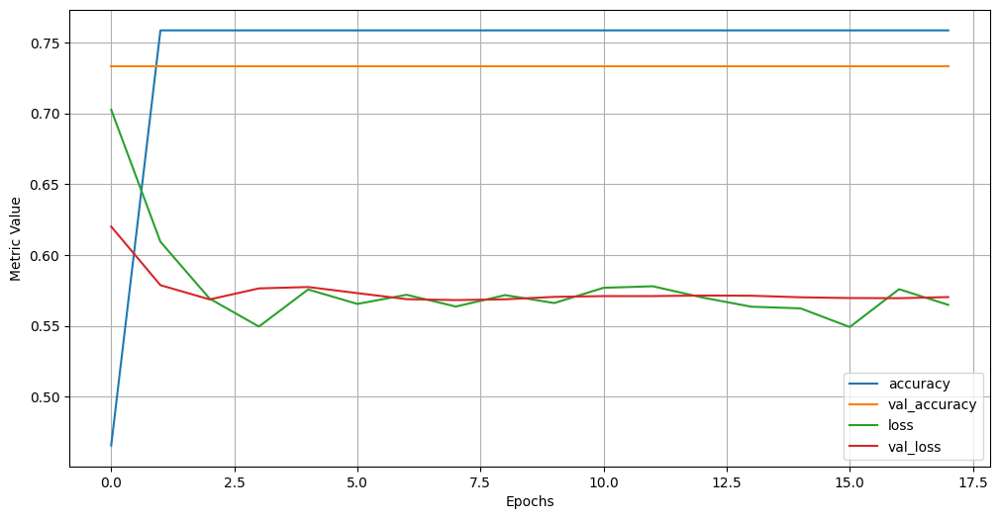

Evaluating model for Gamma_Arbitrary_Limits_Silver...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
✅ Test metrics for Gamma_Arbitrary_Limits_Silver: Loss=0.6775, Accuracy=0.6250

Comparison table:
         code   true_label   pred_label  probability_optima  probability_chrysargyrea
CICIMAUCR0044       optima chrysargyrea                 0.3                       0.7
CICIMAUCR0044       optima chrysargyrea                 0.3                       0.7
CICIMAUCR0044       optima chrysargyrea                 0.3                       0.7
CICIMAUCR0173 chrysargyrea chrysargyrea                 0.3                       0.7
CICIMAUCR0173 chrysargyrea chrysargyrea                 0.3                       0.7
   INBUCR0216 chrysargyrea chrysargyrea                 0.3                       0.7
   INBUCR0216 chrysargyrea chrysargyrea                 0.3                       0.7
   INBUCR0216 chrysargyrea chrysargyrea                 0.3                       0.7
metrics    test_loss  test_accuracy 

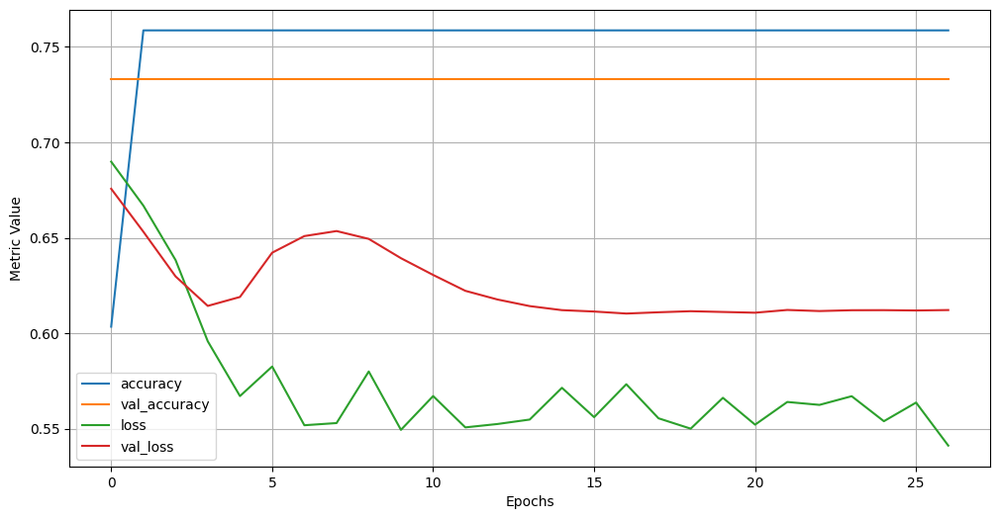

Evaluating model for Gamma_Area_Under_Curve_Naive...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
✅ Test metrics for Gamma_Area_Under_Curve_Naive: Loss=0.6967, Accuracy=0.6250

Comparison table:
         code   true_label   pred_label  probability_optima  probability_chrysargyrea
CICIMAUCR0044       optima chrysargyrea                 0.3                       0.7
CICIMAUCR0044       optima chrysargyrea                 0.3                       0.7
CICIMAUCR0044       optima chrysargyrea                 0.2                       0.8
CICIMAUCR0173 chrysargyrea chrysargyrea                 0.2                       0.8
CICIMAUCR0173 chrysargyrea chrysargyrea                 0.2                       0.8
   INBUCR0216 chrysargyrea chrysargyrea                 0.2                       0.8
   INBUCR0216 chrysargyrea chrysargyrea                 0.2                       0.8
   INBUCR0216 chrysargyrea chrysargyrea                 0.3                       0.7
metrics    test_loss  test_accuracy  t

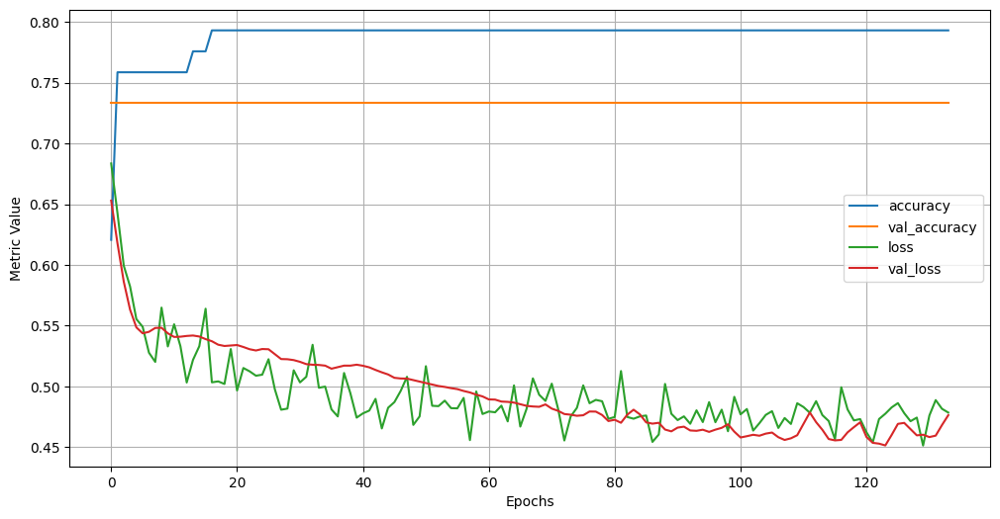

Evaluating model for Gamma_Gaussian_Fit...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
✅ Test metrics for Gamma_Gaussian_Fit: Loss=0.6678, Accuracy=0.6250

Comparison table:
         code   true_label   pred_label  probability_optima  probability_chrysargyrea
CICIMAUCR0044       optima chrysargyrea                 0.4                       0.6
CICIMAUCR0044       optima chrysargyrea                 0.4                       0.6
CICIMAUCR0044       optima chrysargyrea                 0.4                       0.6
CICIMAUCR0173 chrysargyrea chrysargyrea                 0.4                       0.6
CICIMAUCR0173 chrysargyrea chrysargyrea                 0.4                       0.6
   INBUCR0216 chrysargyrea chrysargyrea                 0.4                       0.6
   INBUCR0216 chrysargyrea chrysargyrea                 0.4                       0.6
   INBUCR0216 chrysargyrea chrysargyrea                 0.4                       0.6
metrics    test_loss  test_accuracy  true_positives  true_

,test_loss,test_accuracy,true_positives,true_negatives,false_positives,false_negatives,precision,recall,f1_score
0,0.7,0.6,0,5,0,3,0.4,0.6,0.5
1,0.7,0.6,0,5,0,3,0.4,0.6,0.5
2,0.7,0.6,0,5,0,3,0.4,0.6,0.5


In [79]:
import pandas as pd
debug = True
def run_all_metrics(nn_training_bundle, debug=False):
    """Run training only for metrics marked fit_for_training and return a summary DataFrame."""
    results = []
    skipped = []

    for metric, bundle in nn_training_bundle.items():
        rec = bundle.get("recommendation", {})
        ok = bool(rec.get("fit_for_training", False))

        if not ok:
            skipped.append((metric, rec.get("reason", "No reason provided")))
            if debug:
                print(f"⏭️ Skipping {metric}: {rec.get('reason', 'No reason provided')}")
            continue

        print(f"\n\nMetric: {metric}")
        try:
            metrics, stats_df = neural_network_training(bundle)  # your function from above
            print("metrics", metrics)
            if not metrics.empty:
                results.append(metrics)
        except Exception as e:
            print(f"❌ Failed on {metric}: {e}")
            traceback.print_exc()

    # Build final comparison table
    if results:
        # Merge all results into a single DataFrame
        final_df = pd.concat(results, ignore_index=True)
    
        # Sort by test_accuracy (then f1_score), best first
        final_df = final_df.sort_values(
            by=["test_accuracy", "f1_score"],
            ascending=[False, False],
            na_position="last"
        )
    
        print("\n=== Final comparison ===")
        print(final_df.to_string(index=False))
    else:
        # Empty schema to keep downstream code happy
        final_df = pd.DataFrame(columns=[
            "metric","fit_for_training","reason","test_loss","test_accuracy",
            "true_positives","true_negatives","false_positives","false_negatives",
            "precision","recall","f1_score"
        ])

    if debug and skipped:
        print("\nSkipped metrics (not fit for training):")
        for m, r in skipped:
            print(f" - {m}: {r}")

    return final_df

run_all_metrics(nn_training_bundle, debug=False)

In [80]:
import sys

print(sys.version_info)

#@title Import relevant modules

from tensorflow.keras import layers


# The following lines adjust the granularity of reporting. 
pd.options.display.max_rows = 10
pd.options.display.float_format = "{:.1f}".format

# The following line improves formatting when ouputting NumPy arrays.
np.set_printoptions(linewidth = 200)

sys.version_info(major=3, minor=12, micro=7, releaselevel='final', serial=0)


## Prediction vectorial features

In [ ]:
import numpy as np
print(list(gamma_vector_relative_reflectance_data[1]))
gamma_vector_relative_reflectance_data_np = np.array(gamma_vector_relative_reflectance_data[1])
gamma_vector_relative_reflectance_data_np

In [ ]:
#gvrrd_df = pd.DataFrame(transpose_list(gamma_vector_relative_reflectance_data), columns =["code", "g_arbitrary_limits", "species"])
gvrrd_df = pd.DataFrame(transpose_list(gamma_vector_relative_reflectance_data), columns =["code", "g_arbitrary_limits", "species"])
gvrrd_df


In [ ]:
def get_x_y(df):
    columns = df.columns
    x_column_name = [x for x in columns if x not in ["code", "species"]]
    x = df[x_column_name].values
    x2 = []
    for element in x:
        xp = str(element).replace("[array(", "").replace(")]", "")
        ev = eval(xp)
        x2.append(ev)
    x2 = np.array(x2)
    
    y = df["species"].values
    y= replace_strings(y)
    y= np.array(y)
    #print(y)
    #print(df.dtypes)
    return x2, y

x,y_p = get_x_y(gvrrd_df)


In [ ]:
x_train, y_train,x_test, y_test  = get_training_and_test_data(x, y_p, 0.4)

In [ ]:
x_train[0]


In [ ]:
def create_model_2(my_learning_rate):
  """Create and compile a deep neural net."""
  
  # All models in this course are sequential.
  model = tf.keras.models.Sequential()

  # The features are stored in a two-dimensional 28X28 array. 
  # Flatten that two-dimensional array into a one-dimensional 
  # 784-element array.
  model.add(tf.keras.layers.Flatten(input_shape=(9,)))

  # Define the first hidden layer.   
  model.add(tf.keras.layers.Dense(units=40, activation='relu'))

  # Define the first hidden layer.   
  model.add(tf.keras.layers.Dense(units=20, activation='relu'))

  # Define the first hidden layer.   
  #model.add(tf.keras.layers.Dense(units=20, activation='relu'))
  
  # Define a dropout regularization layer. 
  model.add(tf.keras.layers.Dropout(rate=0.4))

  # Define the output layer. The units parameter is set to 10 because
  # the model must choose among 10 possible output values (representing
  # the digits from 0 to 9, inclusive).
  #
  # Don't change this layer.
  model.add(tf.keras.layers.Dense(units=3, activation='softmax'))     
                           
  # Construct the layers into a model that TensorFlow can execute.  
  # Notice that the loss function for multi-class classification
  # is different than the loss function for binary classification.  
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=my_learning_rate),
                loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])
  
  return model    


def train_model(model, train_features, train_label, epochs,
                batch_size=None, validation_split=0.1):
  """Train the model by feeding it data."""

  history = model.fit(x=train_features, y=train_label, batch_size=batch_size,
                      epochs=epochs, shuffle=True,
                      validation_split=validation_split)
 
  # To track the progression of training, gather a snapshot
  # of the model's metrics at each epoch. 
  epochs = history.epoch
  hist = pd.DataFrame(history.history)

  return epochs, hist    

In [ ]:
# The following variables are the hyperparameters.
learning_rate = 0.003
epochs = 150
batch_size = 1
validation_split = 0.0

# Establish the model's topography.
my_model = create_model_2(learning_rate)

# Train the model on the normalized training set.
epochs, hist = train_model(my_model, x_train, y_train, 
                           #epochs, batch_size, validation_split)
#epochs, hist = train_model(my_model, x_train, y_train, 
                           epochs, batch_size)

# Plot a graph of the metric vs. epochs.
list_of_metrics_to_plot = ['accuracy']
plot_curve(epochs, hist, list_of_metrics_to_plot)

# Evaluate against the test set.
print("\n Evaluate the new model against the test set:")
my_model.evaluate(x=x_test, y=y_test, batch_size=batch_size)

#amplitud en IR vs amplitud en el visible
#700 nm
visible horizontal, IR vertical. 
#gamma vertical, amplitud pico IR horizontal 
#y es amplitud en el IR, x es el gamma

## Prediction 2 variables

In [ ]:
#@title Import relevant modules
import numpy as np
import pandas as pd
import tensorflow as tf
from matplotlib import pyplot as plt
import seaborn as sns

# The following lines adjust the granularity of reporting.
pd.options.display.max_rows = 10
pd.options.display.float_format = "{:.1f}".format

print("Imported modules.")

#first scenario gamma_first_two_peaks and gamma_area_under_curve_first_minimum
#Definicion de las variables
gal_df 
gftp_df 
gaucfmc_df 
gauc_df 


In [ ]:
#define the dataframe

complete_df = pd.merge(gal_df, gftp_df, on=["species","code"], how="inner")
complete_df = pd.merge(complete_df, gaucfmc_df, on=["species","code"], how="inner")
complete_df = pd.merge(complete_df, gauc_df, on=["species","code"], how="inner")
complete_df.drop(columns=['code'], inplace=True)

fraction = 0.8

def substitute_species(df):
    df.loc[df["species"] == "kalinini"] = -100.0
    df.loc[df["species"] == "resplendens"] = 0.0
    df.loc[df["species"] == "cupreomarginata"] = 100.0
    return df 

complete_df = substitute_species(complete_df)


def split_train_test(df, fraction):
    # Shuffle the DataFrame
    shuffled_df = df.sample(frac=1, random_state=0)
    
    # Calculate the number of rows for the training set
    train_size = int(fraction * len(df))
    
    # Split the DataFrame
    train_df = shuffled_df[:train_size]
    test_df = shuffled_df[train_size:]
    
    return train_df, test_df
    
train_df, test_df =split_train_test(complete_df, fraction)
#print(complete_df)
#print(train_df)
#print(test_df)

In [ ]:
# Keras Input tensors of float values.
inputs = {
    'g_arbitrary_limits':
        tf.keras.layers.Input(shape=(1,), dtype=tf.float32,
                              name='g_arbitrary_limits '),
    'g_first_2_peaks':
        tf.keras.layers.Input(shape=(1,), dtype=tf.float32,
                              name='g_first_2_peaks'),
    'g_area_und_curve_first_min':
        tf.keras.layers.Input(shape=(1,), dtype=tf.float32,
                              name='g_area_und_curve_first_min'),
    'g_area_und_curve':
        tf.keras.layers.Input(shape=(1,), dtype=tf.float32,
                              name='g_area_und_curve')
}

# Create a Normalization layer to normalize the median_income data.
g_area_und_curve_first_min = tf.keras.layers.Normalization(
    name='normalization_g_area_und_curve_first_min',
    axis=None)
g_area_und_curve_first_min.adapt(train_df['g_area_und_curve_first_min'])
g_area_und_curve_first_min = g_area_und_curve_first_min(inputs.get('g_area_und_curve_first_min'))

# Create a Normalization layer to normalize the population data.
g_area_und_curve = tf.keras.layers.Normalization(
    name='normalization_g_area_und_curve',
    axis=None)
g_area_und_curve.adapt(train_df['g_area_und_curve_first_min'])
g_area_und_curve = g_area_und_curve(inputs.get('g_area_und_curve'))


# Create a Normalization layer to normalize the latitude data.
g_arbitrary_limits = tf.keras.layers.Normalization(
    name='normalization_g_arbitrary_limits',
    axis=None)
g_arbitrary_limits.adapt(train_df['g_arbitrary_limits'])
g_arbitrary_limits = g_arbitrary_limits(inputs.get('g_arbitrary_limits'))


# Create a Normalization layer to normalize the longitude data.
g_first_2_peaks = tf.keras.layers.Normalization(
    name='normalization_g_first_2_peaks',
    axis=None)
g_first_2_peaks.adapt(train_df['g_first_2_peaks'])
g_first_2_peaks = g_first_2_peaks(inputs.get('g_first_2_peaks'))

# Concatenate our inputs into a single tensor.
preprocessing_layers = tf.keras.layers.Concatenate()(
    [g_arbitrary_limits, g_first_2_peaks, g_area_und_curve, g_area_und_curve_first_min])

print("Preprocessing layers defined.")

In [ ]:


def plot_the_loss_curve(epochs, mse_training, mse_validation):
  """Plot a curve of loss vs. epoch."""

  plt.figure()
  plt.xlabel("Epoch")
  plt.ylabel("Mean Squared Error")

  plt.plot(epochs, mse_training, label="Training Loss")
  plt.plot(epochs, mse_validation, label="Validation Loss")

  # mse_training is a pandas Series, so convert it to a list first.
  merged_mse_lists = mse_training.tolist() + mse_validation
  highest_loss = max(merged_mse_lists)
  lowest_loss = min(merged_mse_lists)
  top_of_y_axis = highest_loss * 1.03
  bottom_of_y_axis = lowest_loss * 0.97

  plt.ylim([bottom_of_y_axis, top_of_y_axis])
  plt.legend()
  plt.show()

print("Defined the plot_the_loss_curve function.")

In [ ]:
from tensorflow import Tensor

In [ ]:
#@title Define functions to create and train a linear regression model
def create_model(my_inputs, my_outputs, my_learning_rate):
  """Create and compile a simple linear regression model."""
  model = tf.keras.Model(inputs=my_inputs, outputs=my_outputs)

  # Construct the layers into a model that TensorFlow can execute.
  model.compile(optimizer=tf.keras.optimizers.Adam(
      learning_rate=my_learning_rate),
      loss="mean_squared_error",
      metrics=[tf.keras.metrics.MeanSquaredError()])

  return model


def train_model(model, dataset, epochs, batch_size, label_name, validation_split=0.1):
  """Feed a dataset into the model in order to train it."""

  # Split the dataset into features and label.
  features = {name:np.array(value) for name, value in dataset.items()}
  print(features)
 
  #Considering y variable holds numpy array
  train_features_tensor = tf.convert_to_tensor(np.array(features.pop(label_name)), dtype=tf.int64) 
  label = train_median_house_value_normalized(train_features_tensor)

  for element in features:
      features[element] =  tf.convert_to_tensor(np.array(features[element]), dtype=tf.int64) 
      
  print(f"{label=}")
  history = model.fit(x=features, y=label, batch_size=batch_size,
                      epochs=epochs, shuffle=True, validation_split=validation_split)

  # Get details that will be useful for plotting the loss curve.
  epochs = history.epoch
  hist = pd.DataFrame(history.history)
  mse = hist["mean_squared_error"]

  return epochs, mse, history.history

print("Defined the create_model and train_model functions.")

In [ ]:
train_df.fillna(value='', inplace=True)
test_df.fillna(value='', inplace=True)

x_train = np.asarray(train_df['species']).astype('float32')
x_test = np.asarray(test_df['species']).astype('float32')

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
#@title Define normalized label columns
# Create Normalization layers to normalize the median_house_value data.
# Because median_house_value is our label (i.e., the target value we're
# predicting), these layers won't be added to our model.
train_median_house_value_normalized = tf.keras.layers.Normalization(axis=None)
train_median_house_value_normalized.adapt(x_train)
print(train_median_house_value_normalized)

test_median_house_value_normalized = tf.keras.layers.Normalization(axis=None)
test_median_house_value_normalized.adapt(x_test)
print(test_median_house_value_normalized)

In [ ]:
#@title Define linear regression model outputs
def get_outputs_linear_regression():
  # Create the Dense output layer.
  dense_output = tf.keras.layers.Dense(units=1,
                              name='dense_output')(preprocessing_layers)

  # Define an output dictionary we'll send to the model constructor.
  outputs = {
    'dense_output': dense_output
  }
  return outputs

In [ ]:
# The following variables are the hyperparameters.
learning_rate = 0.01
epochs = 15
batch_size = 1000
label_name = "species"

# Split the original training set into a reduced training set and a
# validation set.
validation_split = 0.2

outputs = get_outputs_linear_regression()

# Establish the model's topography.
my_model = create_model(inputs, outputs, learning_rate)

# Train the model on the normalized training set.
epochs, mse, history = train_model(my_model, train_df, epochs, batch_size,
                          label_name, validation_split)
plot_the_loss_curve(epochs, mse, history["val_mean_squared_error"])

test_features = {name:np.array(value) for name, value in test_df.items()}

test_features_tensor = tf.convert_to_tensor(np.array(test_features.pop(label_name)), dtype=tf.int64) 

test_label = test_median_house_value_normalized(test_features_tensor) # isolate the label
print("\n Evaluate the linear regression model against the test set:")
my_model.evaluate(x = test_features, y = test_label, batch_size=batch_size, return_dict=True)

In [ ]:
def get_outputs_dnn():
  # Create a Dense layer with 20 nodes.
  dense_output = tf.keras.layers.Dense(units=20,
                              activation='relu',
                              name='hidden_dense_layer_1')(preprocessing_layers)
  # Create a Dense layer with 12 nodes.
  dense_output = tf.keras.layers.Dense(units=12,
                              activation='relu',
                              name='hidden_dense_layer_2')(dense_output)
  # Create the Dense output layer.
  dense_output = tf.keras.layers.Dense(units=1,
                              name='dense_output')(dense_output)

  # Define an output dictionary we'll send to the model constructor.
  outputs = {
    'dense_output': dense_output
  }

  return outputs

In [ ]:
# The following variables are the hyperparameters.
learning_rate = 0.01
epochs = 20
batch_size = 1000

# Specify the label
label_name = "species"

# Split the original training set into a reduced training set and a
# validation set.
validation_split = 0.2

dnn_outputs = get_outputs_dnn()

# Establish the model's topography.
my_model = create_model(
    inputs,
    dnn_outputs,
    learning_rate)

# Train the model on the normalized training set. We're passing the entire
# normalized training set, but the model will only use the features
# defined in our inputs.
epochs, mse, history = train_model(my_model, train_df, epochs,
                                   batch_size, label_name, validation_split)
plot_the_loss_curve(epochs, mse, history["val_mean_squared_error"])

# After building a model against the training set, test that model
# against the test set.
test_features = {name:np.array(value) for name, value in test_df.items()}

train_features_tensor = tf.convert_to_tensor(np.array(test_features.pop(label_name)), dtype=tf.int64) 

test_label = test_median_house_value_normalized(train_features_tensor) # isolate the label

print("\n Evaluate the new model against the test set:")
my_model.evaluate(x = test_features, y = test_label, batch_size=batch_size, return_dict=True)

In [ ]:
#Save model 

# Define the file path where you want to save your model
model_file_path = 'trained_model.h5'

# Save the model
my_model.save(model_file_path)

print("Model saved successfully at:", model_file_path)

In [ ]:
# Load the saved model
model_file_path = 'trained_model.h5'
loaded_model = tf.keras.models.load_model(model_file_path)

#load prediction data
#test_spectra

prediction_gamma_arbitrary_limits_data = feature_and_label_extractor(Gamma_Arbitrary_Limits_Silver, test_spectra)
prediction_gamma_first_two_peaks_data = feature_and_label_extractor(Gamma_First_Two_Peaks, test_spectra)
prediction_gamma_area_under_curve_data = feature_and_label_extractor(Gamma_Area_Under_Curve_Naive, test_spectra)
prediction_gamma_area_under_curve_first_min_cut_data = feature_and_label_extractor(Gamma_Area_Under_Curve_First_Min_Cut, test_spectra)

prediction_gamma_vector_relative_reflectance_data = feature_and_label_extractor(Gamma_Vector_Relative_Reflectance, test_spectra)
prediction_critical_points_data = feature_and_label_extractor(Critical_Points, test_spectra)

#Definicion de las variables
pred_gal_df = pd.DataFrame(transpose_list(prediction_gamma_arbitrary_limits_data), columns =["code", "g_arbitrary_limits", "real_species"]) 
pred_gftp_df = pd.DataFrame(transpose_list(prediction_gamma_first_two_peaks_data), columns =["code", "g_first_2_peaks", "real_species"])
pred_gaucfmc_df = pd.DataFrame(transpose_list(prediction_gamma_area_under_curve_first_min_cut_data), columns =["code", "g_area_und_curve_first_min", "real_species"]) 
pred_gauc_df = pd.DataFrame(transpose_list(prediction_gamma_area_under_curve_data), columns =["code", "g_area_und_curve", "real_species"])


#drop species

drop_pred_gal_df = pred_gal_df.copy()

drop_pred_gal_df.drop(columns=[ "real_species"], inplace=True)


drop_pred_gftp_df = pred_gftp_df.copy()
drop_pred_gftp_df.drop(columns=[ "real_species"], inplace=True)


drop_pred_gauc_df= pred_gauc_df.copy()
drop_pred_gauc_df.drop(columns=[ "real_species"], inplace=True)

drop_pred_gaucfmc_df=pred_gaucfmc_df.copy()
drop_pred_gaucfmc_df.drop(columns=[ "real_species"], inplace=True)


#merge on code
pred_complete_df = pd.merge(drop_pred_gal_df, drop_pred_gftp_df, on=["code"], how="inner")
print(pred_complete_df)
pred_complete_df = pd.merge(pred_complete_df, drop_pred_gauc_df, on=["code"], how="inner")
pred_complete_df = pd.merge(pred_complete_df, drop_pred_gaucfmc_df, on=["code"], how="inner")

pred_complete_df.drop(columns=[ "code"], inplace=True)
pred_complete_df


In [ ]:

# Assuming `features_to_predict` contains the features you want to use for prediction
prediction_features = {name:np.array(value) for name, value in pred_complete_df.items()}

#convert prediction_features to tensor
for element in prediction_features:
    prediction_features[element] = tf.convert_to_tensor(np.array(prediction_features[element]), dtype=tf.int64) 


# Predict using the loaded model
predictions = loaded_model.predict(prediction_features)

# Print the predictions
print(predictions)

In [ ]:
# Calculate the mean and standard deviation used for normalization
original_mean = train_df[label_name].mean()
original_stddev = train_df[label_name].std()
print(predictions['dense_output'])
predictions_unnormalized = (predictions['dense_output'] * original_stddev) + original_mean
predictions_unnormalized = predictions_unnormalized
print(predictions_unnormalized)

In [ ]:

def replace_back_strings(lst):
    lst = [int(x) for x in lst]
    mapping = {"kalinini": 0, "resplendens": 1, "cupreomarginata": 2, "unk1":3, "unk2":4}
    reverse_mapping = {value: key for key, value in mapping.items()}
    return [reverse_mapping.get(item, item) for item in lst]
    
predictions_labels = replace_back_strings(predictions_unnormalized)

print(predictions_labels)
print((pred_gal_df))

## Prediction 4 variables vector

In [ ]:
import sys

print(sys.version_info)

In [ ]:
#@title Import relevant modules

from tensorflow.keras import layers

# The following lines adjust the granularity of reporting. 
pd.options.display.max_rows = 10
pd.options.display.float_format = "{:.1f}".format

# The following line improves formatting when ouputting NumPy arrays.
np.set_printoptions(linewidth = 200)

In [ ]:
def replace_strings_3(lst):
    mapping = {"kalinini": 0, "resplendens": 1, "cupreomarginata": 2}
    return [mapping.get(item, item) for item in lst]

In [ ]:

complete_df = pd.merge(gal_df, gftp_df, on=["species","code"], how="inner")
complete_df = pd.merge(complete_df, gauc_df, on=["species","code"], how="inner")
complete_df = pd.merge(complete_df, gaucfmc_df, on=["species","code"], how="inner")
complete_df.drop(columns=['code'], inplace=True)

def replace_species_with_categorical(df):
    
    df.loc[df["species"]=="kalinini","species"] = 0
    df.loc[df["species"]=="resplendens", "species"] = 1
    df.loc[df["species"]=="cupreomarginata", "species"] = 2

    df.loc[df["species"]=="kalinini", "species"] = 0
    df.loc[df["species"]=="resplendens", "species"] = 1
    df.loc[df["species"]=="cupreomarginata", "species"] = 2

    df.loc[df["species"]=="kalinini", "species"] = 0
    df.loc[df["species"]=="resplendens", "species"] = 1
    df.loc[df["species"]=="cupreomarginata", "species"] = 1
    return df

complete_df = replace_species_with_categorical(complete_df)
#complete_df.drop(columns=['species'], inplace=True)
complete_df

In [ ]:

shuffled_df = complete_df.sample(frac=1, random_state=42)  # Random_state for reproducibility

# Define the fraction of data to be used for training
train_fraction = 0.66  # For example, 80% for training, 20% for testing

# Calculate the number of rows for the training set
train_size = int(train_fraction * len(complete_df))

# Split the shuffled DataFrame into train and test sets
train_data = shuffled_df.iloc[:train_size]
test_data = shuffled_df.iloc[train_size:]

# Split the shuffled DataFrame into features and labels
train_data_features = train_data.drop(columns=['species'], inplace=False)
train_data_labels =  train_data.drop(columns=['g_arbitrary_limits','g_first_2_peaks','g_area_und_curve_first_min','g_area_und_curve'], inplace=False)
test_data_features =  test_data.drop(columns=['species'], inplace=False)
test_data_labels =  test_data.drop(columns=['g_arbitrary_limits','g_first_2_peaks','g_area_und_curve_first_min','g_area_und_curve'], inplace=False)

from tensorflow.keras.utils import to_categorical

# Assuming y_train and y_test are your integer labels
train_data_labels_one_hot = to_categorical(train_data_labels, num_classes=3)
test_data_labels_one_hot = to_categorical(test_data_labels, num_classes=3)


print(train_data_features)
print(len(train_data))
print(len(test_data))
#print(test_features)
#print(test_labels)

In [ ]:
# Select 2
train_data_features = train_data_features.drop(columns=['g_arbitrary_limits',"g_area_und_curve"], inplace=False)
test_data_features =  test_data_features.drop(columns=['g_arbitrary_limits',"g_area_und_curve"], inplace=False)

print(train_data_features)
print(test_data_features)

In [ ]:
def plot_curve(epochs, hist, list_of_metrics):
  """Plot a curve of one or more classification metrics vs. epoch."""  
  # list_of_metrics should be one of the names shown in:
  # https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#define_the_model_and_metrics  

  plt.figure()
  plt.xlabel("Epoch")
  plt.ylabel("Value")

  for m in list_of_metrics:
    x = hist[m]
    plt.plot(epochs[1:], x[1:], label=m)

  plt.legend()

print("Loaded the plot_curve function.")

In [ ]:
def create_model_3(my_learning_rate):
  """Create and compile a deep neural net."""
  
  # All models in this course are sequential.
  model = tf.keras.models.Sequential()

  # The features are stored in a two-dimensional 28X28 array. 
  # Flatten that two-dimensional array into a one-dimensional 
  # 784-element array.
  model.add(tf.keras.layers.Flatten(input_shape=(2,)))

  # Define the first hidden layer.   
  model.add(tf.keras.layers.Dense(units=20, activation='relu'))

  # Define the first hidden layer.   
  model.add(tf.keras.layers.Dense(units=20, activation='relu'))

  # Define the first hidden layer.   
  model.add(tf.keras.layers.Dense(units=20, activation='relu'))
  
  # Define a dropout regularization layer. 
  model.add(tf.keras.layers.Dropout(rate=0.2))

  # Define the output layer. The units parameter is set to 10 because
  # the model must choose among 10 possible output values (representing
  # the digits from 0 to 9, inclusive).
  #
  # Don't change this layer.
  model.add(tf.keras.layers.Dense(units=3, activation='softmax'))     
                           
  # Construct the layers into a model that TensorFlow can execute.  
  # Notice that the loss function for multi-class classification
  # is different than the loss function for binary classification.  
  #model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=my_learning_rate),loss="sparse_categorical_crossentropy", metrics=['accuracy'])
  model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
  return model    


def train_model(model, train_features, train_label, epochs,
                batch_size=None, validation_split=0.1):
  """Train the model by feeding it data."""

  history = model.fit(x=train_features, y=train_label, batch_size=batch_size,
                      epochs=epochs, shuffle=True)
                      #validation_split=validation_split)
 
  # To track the progression of training, gather a snapshot
  # of the model's metrics at each epoch. 
  epochs = history.epoch
  hist = pd.DataFrame(history.history)

  return epochs, hist    

In [ ]:
# The following variables are the hyperparameters.
learning_rate = 0.008
epochs = 150
batch_size = 3
validation_split = 0.2

# Establish the model's topography.
my_model = create_model_3(learning_rate)

# Train the model on the normalized training set.
#epochs, hist = train_model(my_model, x_train, y_train, 
                           #epochs, batch_size, validation_split)
epochs, hist = train_model(my_model, train_data_features, train_data_labels_one_hot, 
                           epochs, batch_size)

# Plot a graph of the metric vs. epochs.
list_of_metrics_to_plot = ['accuracy']
plot_curve(epochs, hist, list_of_metrics_to_plot)

# Evaluate against the test set.
print("\n Evaluate the new model against the test set:")
my_model.evaluate(x=test_data_features, y=test_data_labels_one_hot, batch_size=batch_size)


In [ ]:
#Save model 

# Define the file path where you want to save your model
model_file_path = 'trained_model_4_var.h5'

# Save the model
my_model.save(model_file_path)

print("Model saved successfully at:", model_file_path)

In [ ]:
# Load the saved model
model_file_path = 'trained_model_4_var.h5'
loaded_model2 = tf.keras.models.load_model(model_file_path)

#load prediction data
#test_spectra

prediction_gamma_arbitrary_limits_data = feature_and_label_extractor(Gamma_Arbitrary_Limits_Silver, test_spectra)
prediction_gamma_first_two_peaks_data = feature_and_label_extractor(Gamma_First_Two_Peaks, test_spectra)
prediction_gamma_area_under_curve_data = feature_and_label_extractor(Gamma_Area_Under_Curve_Naive, test_spectra)
prediction_gamma_area_under_curve_first_min_cut_data = feature_and_label_extractor(Gamma_Area_Under_Curve_First_Min_Cut, test_spectra)

#prediction_gamma_vector_relative_reflectance_data = feature_and_label_extractor(Gamma_Vector_Relative_Reflectance, test_spectra)
#prediction_critical_points_data = feature_and_label_extractor(Critical_Points, test_spectra)

#Definicion de las variables
pred_gal_df = pd.DataFrame(transpose_list(prediction_gamma_arbitrary_limits_data), columns =["code", "g_arbitrary_limits", "real_species"]) 
pred_gftp_df = pd.DataFrame(transpose_list(prediction_gamma_first_two_peaks_data), columns =["code", "g_first_2_peaks", "real_species"])
pred_gauc_df = pd.DataFrame(transpose_list(prediction_gamma_area_under_curve_data), columns =["code", "g_area_und_curve", "real_species"])
pred_gaucfmc_df = pd.DataFrame(transpose_list(prediction_gamma_area_under_curve_first_min_cut_data), columns =["code", "g_area_und_curve_first_min", "real_species"]) 


#drop species

drop_pred_gal_df = pred_gal_df.copy()
drop_pred_gal_df.drop(columns=[ "real_species"], inplace=True)


drop_pred_gftp_df = pred_gftp_df.copy()
drop_pred_gftp_df.drop(columns=[ "real_species"], inplace=True)


drop_pred_gauc_df= pred_gauc_df.copy()
drop_pred_gauc_df.drop(columns=[ "real_species"], inplace=True)

drop_pred_gaucfmc_df=pred_gaucfmc_df.copy()
drop_pred_gaucfmc_df.drop(columns=[ "real_species"], inplace=True)


#merge on code
pred_complete_df = pd.merge(drop_pred_gal_df, drop_pred_gftp_df, on=["code"], how="inner")
#print(pred_complete_df)
pred_complete_df = pd.merge(pred_complete_df, drop_pred_gauc_df, on=["code"], how="inner")
pred_complete_df = pd.merge(pred_complete_df, drop_pred_gaucfmc_df, on=["code"], how="inner")

no_code_pred_complete_df= pred_complete_df.copy()
no_code_pred_complete_df.drop(columns=[ "code"], inplace=True)
pred_complete_df

In [ ]:
# Select 2
no_code_pred_complete_df = no_code_pred_complete_df.drop(columns=['g_arbitrary_limits',"g_area_und_curve"], inplace=False)

print(no_code_pred_complete_df)


In [ ]:
# Assuming `features_to_predict` contains the features you want to use for prediction
prediction_features = pd.DataFrame({name:np.array(value) for name, value in no_code_pred_complete_df.items()})

#print(prediction_features)
#print(pred_complete_df)
#convert prediction_features to tensor
for element in prediction_features:
    prediction_features[element] = tf.convert_to_tensor(np.array(prediction_features[element]), dtype=tf.int64) 


# Predict using the loaded model
predictions = loaded_model2.predict(prediction_features)

# Print the predictions
#print(predictions)
prediction_df = pd.DataFrame(predictions, columns=["kalinini", "resplendens", "cupreomarginata"])
prediction_df

In [ ]:
#pred_gal_df = pd.DataFrame(transpose_list(prediction_gamma_arbitrary_limits_data), columns =["code", "g_arbitrary_limits", "real_species"]) 
#pred_gftp_df = pd.DataFrame(transpose_list(prediction_gamma_first_two_peaks_data), columns =["code", "g_first_2_peaks", "real_species"])
#pred_gaucfmc_df = pd.DataFrame(transpose_list(prediction_gamma_area_under_curve_first_min_cut_data), columns =["code", "g_area_und_curve_first_min", "real_species"]) 
#pred_gauc_df = pd.DataFrame(transpose_list(prediction_gamma_area_under_curve_data), columns =["code", "g_area_und_curve", "real_species"])

merged_prediction_data = pd.merge(pred_gal_df, pred_gftp_df , on=["code","real_species"], how="inner")
merged_prediction_data = pd.merge(merged_prediction_data, pred_gauc_df , on=["code","real_species"], how="inner")
merged_prediction_data = pd.merge(merged_prediction_data, pred_gaucfmc_df , on=["code","real_species"], how="inner")
merged_prediction_data